#Macroeconomic Indicators for Stock Dynamics

ESE 5380_AGM

Team Members:

* Shruthi Arunkumar
* Vinod Ghanchi
* Yashvi Mehta

Overleaf link : https://www.overleaf.com/project/68f6a582a3ef13186eebaf05

Github Link : https://github.com/Shruthi-Arun/Macroeconomic-Indicators-for-Stock-Dynamics

Drive Link : https://drive.google.com/drive/folders/11m9KpylkBr2JFR7gCGhf01lAwGoPKktq?usp=sharing

This project analyzes how key macroeconomic indicators—interest rates, inflation, and unemployment—affect S&P 500 returns using a Vector AutoRegression (VAR) framework. The study examines how shocks in one variable propagate through the system over time and evaluates dynamic relationships using:

* Granger causality tests to identify predictive links

* VAR and VECM models to capture interdependencies

* Impulse Response Functions (IRFs) to visualize shock effects

* Forecast Error Variance Decomposition (FEVD) to quantify contributions




The goal is to understand the timing, magnitude, and impact of economic shocks on financial markets and provide insights for investors and policymakers.

## PART 1 - Data Collection and Pre-Processing
A combined macroeconomic–financial dataset is created using indicators from the Federal Reserve Economic Database (FRED) and stock market data from Yahoo Finance. <br><br>

Eight key U.S. macroeconomic indicators are retrieved through the fredapi package: inflation (CPIAUCSL), unemployment (UNRATE), interest rate (FEDFUNDS), real GDP (GDPC1), industrial output (INDPRO), money supply (M2SL), consumer confidence (UMCSENT), and 10-year treasury yield (GS10). <br><br>

S&P 500 index data (^GSPC) is downloaded using yfinance, and monthly percentage returns are calculated to represent market performance.
All series are standardized to a monthly frequency and aligned to month-end timestamps for uniformity. <br><br>
Quarterly indicators such as GDP are forward-filled to fill missing months, and minor residual gaps across indicators are handled through forward and backward filling.
<br><br>
The final dataset spans 1955–2025 with 849 monthly observations across nine variables.

In [ ]:
!pip install fredapi

In [ ]:
# --- Import libraries ---
from fredapi import Fred
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from statsmodels.tsa.api import VAR
from statsmodels.stats.stattools import durbin_watson
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error
import scipy.stats as stats
from statsmodels.tsa.stattools import grangercausalitytests

from statsmodels.tsa.vector_ar.vecm import coint_johansen, VECM
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import jarque_bera, skew, kurtosis


In [ ]:
# --- Initialize FRED ---
fred = Fred(api_key='70b316692bf4c602d54fe9c4c752a18c')

In [ ]:
# --- FRED Series IDs ---
fred_series = {
    'Inflation': 'CPIAUCSL',
    'Unemployment': 'UNRATE',
    'Interest_Rate': 'FEDFUNDS',
    'GDP': 'GDPC1',
    'Industrial_Output': 'INDPRO',
    'Money_Supply': 'M2SL',
    'Consumer_Confidence': 'UMCSENT',
    'Treasury_Yield': 'GS10'
}

In [ ]:
# --- FRED (pull raw, then make monthly, forward-fill slow series) ---
df_fred = pd.DataFrame({k: fred.get_series(v) for k, v in fred_series.items()})
df_fred.index = pd.to_datetime(df_fred.index)

In [ ]:
# monthly month-end index, forward-fill for quarterly/irregular
df_fred = df_fred.resample('M').ffill()
df_fred[['GDP','Consumer_Confidence']] = df_fred[['GDP','Consumer_Confidence']].ffill()

/tmp/ipython-input-1362262850.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_fred = df_fred.resample('M').ffill()


In [ ]:
# align to month-end timestamps
df_fred.index = df_fred.index.to_period('M').to_timestamp('M')

In [ ]:
# --- S&P 500 (pull MAX daily, then resample to month-end yourself) ---
hist = yf.Ticker("^GSPC").history(period="max", auto_adjust=True)
hist = hist[['Close']].rename(columns={'Close':'SP500_Close'})
hist.index = pd.to_datetime(hist.index)

In [ ]:
# month-end prices & returns
sp500_m = hist.resample('M').last()
sp500_ret = sp500_m['SP500_Close'].pct_change().dropna() * 100
sp500_ret.name = 'SP500_Returns'
sp500_ret.index = sp500_ret.index.to_period('M').to_timestamp('M')

/tmp/ipython-input-1867777784.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sp500_m = hist.resample('M').last()
/tmp/ipython-input-1867777784.py:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  sp500_ret.index = sp500_ret.index.to_period('M').to_timestamp('M')


In [ ]:
# --- Merge on intersection only (clean econometrics) ---
df = pd.merge(df_fred, sp500_ret, left_index=True, right_index=True, how='inner')

In [ ]:
# restrict to a broad era
df = df.loc['1955':'2025-10']  # earliest limited by GS10(1962), M2(1959), FEDFUNDS(1954), SP500(1950)

In [ ]:
print("Final merged dataset:", df.shape)
print("Range:", df.index.min().strftime("%Y-%m"), "→", df.index.max().strftime("%Y-%m"))
print("\nSeries coverage:")
for col in df.columns:
    s = df[col].dropna()
    print(f"{col:<22} {s.index.min().strftime('%Y-%m')} → {s.index.max().strftime('%Y-%m')} (n={len(s)})")

Final merged dataset: (850, 9)
Range: 1955-01 → 2025-10

Series coverage:
Inflation              1955-01 → 2025-09 (n=849)
Unemployment           1955-01 → 2025-09 (n=849)
Interest_Rate          1955-01 → 2025-10 (n=850)
GDP                    1955-01 → 2025-10 (n=850)
Industrial_Output      1955-01 → 2025-09 (n=849)
Money_Supply           1959-01 → 2025-10 (n=802)
Consumer_Confidence    1955-01 → 2025-10 (n=850)
Treasury_Yield         1955-01 → 2025-10 (n=850)
SP500_Returns          1955-01 → 2025-10 (n=850)


In [ ]:
df.to_csv('macro_stock_merged_1955_2025.csv')
print("\n💾 Saved macro_stock_merged_1955_2025.csv")


💾 Saved macro_stock_merged_1955_2025.csv


In [ ]:
# converting Unnamed0 to date
df = pd.read_csv('macro_stock_merged_1955_2025.csv')
print(df.columns)

df = df.rename(columns={'Unnamed: 0': 'Date'})

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

df.info()


Index(['Unnamed: 0', 'Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
       'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
       'Treasury_Yield', 'SP500_Returns'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 850 entries, 1955-01-31 to 2025-10-31
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Inflation            849 non-null    float64
 1   Unemployment         849 non-null    float64
 2   Interest_Rate        850 non-null    float64
 3   GDP                  850 non-null    float64
 4   Industrial_Output    849 non-null    float64
 5   Money_Supply         802 non-null    float64
 6   Consumer_Confidence  850 non-null    float64
 7   Treasury_Yield       850 non-null    float64
 8   SP500_Returns        850 non-null    float64
dtypes: float64(9)
memory usage: 66.4 KB


In [ ]:
df.head()

,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
Date,,,,,,,,,
1955-01-31,26.77,4.9,1.39,3020.746,19.3070,NaN,87.0,2.61,1.806563
1955-02-28,26.82,4.7,1.29,3020.746,19.5494,NaN,95.9,2.65,0.354893
1955-03-31,26.79,4.6,1.35,3020.746,20.0071,NaN,95.9,2.68,-0.489653
1955-04-30,26.79,4.7,1.43,3069.910,20.2495,NaN,95.9,2.75,3.772546
1955-05-31,26.77,4.3,1.43,3069.910,20.5726,NaN,99.1,2.76,-0.131716


In [ ]:
df = pd.read_csv("macro_stock_merged_1955_2025.csv", parse_dates=["Unnamed: 0"], index_col="Unnamed: 0")

# Rename index column
df.index.name = "Date"

# Quick overview
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
Index: 850 entries, 1955-01-31 to 2025-10-31
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Inflation            849 non-null    float64
 1   Unemployment         849 non-null    float64
 2   Interest_Rate        850 non-null    float64
 3   GDP                  850 non-null    float64
 4   Industrial_Output    849 non-null    float64
 5   Money_Supply         802 non-null    float64
 6   Consumer_Confidence  850 non-null    float64
 7   Treasury_Yield       850 non-null    float64
 8   SP500_Returns        850 non-null    float64
dtypes: float64(9)
memory usage: 66.4+ KB
None
            Inflation  Unemployment  Interest_Rate       GDP  \
Date                                                           
1955-01-31      26.77           4.9           1.39  3020.746   
1955-02-28      26.82           4.7           1.29  3020.746   
1955-03-31      26.79           

In [ ]:
df.index = pd.to_datetime(df.index, errors='coerce')


In [ ]:
print(type(df.index))


<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


In [ ]:
df = df.dropna(subset=['Money_Supply'])
print(df.isna().sum())

# Optional: check the new start date
# print("New start date after dropping NaNs:", df.index.min())

Inflation              1
Unemployment           1
Interest_Rate          0
GDP                    0
Industrial_Output      1
Money_Supply           0
Consumer_Confidence    0
Treasury_Yield         0
SP500_Returns          0
dtype: int64


In [ ]:
df['Unemployment'] = df['Unemployment'].ffill()
df['Industrial_Output'] = df['Industrial_Output'].ffill()

In [ ]:
df.isna().sum()

,0
Inflation,1
Unemployment,0
Interest_Rate,0
GDP,0
Industrial_Output,0
Money_Supply,0
Consumer_Confidence,0
Treasury_Yield,0
SP500_Returns,0


In [ ]:
df.to_csv('macro_data_cleaned.csv', index=True)

## Part 2 - EDA

This section aims to understand the statistical properties, temporal patterns, and interrelationships among macroeconomic indicators and S&P 500 returns. By examining trends, cycles, stationarity, autocorrelations, and distributions, EDA identifies the necessary transformations (log-differencing, first differences) for accurate and unbiased modeling. This analysis also highlights volatility, cyclical peaks, and patterns in short- and long-term behavior, laying the foundation for the subsequent VAR, VECM, and ARIMA modeling of macro-financial dynamics.

In [ ]:
df = pd.read_csv('macro_data_cleaned.csv')
print(df.columns)

df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

df.info()


Index(['Date', 'Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
       'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
       'Treasury_Yield', 'SP500_Returns'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 801 entries, 1959-01-31 to 2025-09-30
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Inflation            801 non-null    float64
 1   Unemployment         801 non-null    float64
 2   Interest_Rate        801 non-null    float64
 3   GDP                  801 non-null    float64
 4   Industrial_Output    801 non-null    float64
 5   Money_Supply         801 non-null    float64
 6   Consumer_Confidence  801 non-null    float64
 7   Treasury_Yield       801 non-null    float64
 8   SP500_Returns        801 non-null    float64
dtypes: float64(9)
memory usage: 62.6 KB


In [ ]:
df.head()

,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
Date,,,,,,,,,
1959-01-31,29.01,6.0,2.48,3352.129,21.9616,286.6,90.8,4.02,0.434707
1959-02-28,29.00,5.9,2.43,3352.129,22.3917,287.7,90.8,3.96,-0.072139
1959-03-31,28.97,5.6,2.80,3352.129,22.7142,289.2,90.8,3.99,0.054140
1959-04-30,28.98,5.2,2.96,3427.667,23.1981,290.1,90.8,4.12,3.878069
1959-05-31,29.04,5.1,2.90,3427.667,23.5476,292.2,95.3,4.31,1.892690


In [ ]:
df.describe()


,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,140.944479,5.862047,4.771573,11632.552109,68.088921,5615.058427,85.511111,5.752859,0.692191
std,85.391022,1.685440,3.600813,5922.623685,26.970055,5991.892538,12.925321,2.900398,4.261525
min,28.970000,3.400000,0.050000,3352.129000,21.961600,286.600000,50.000000,0.620000,-21.763041
25%,54.600000,4.600000,2.000000,6150.131000,45.085000,991.500000,76.000000,3.880000,-1.754387
50%,139.700000,5.600000,4.650000,10347.429000,63.126800,3398.800000,89.500000,5.180000,0.997998
75%,214.790000,6.900000,6.470000,16743.162000,96.180900,8289.000000,95.100000,7.460000,3.463658
max,324.368000,14.800000,19.100000,23770.976000,104.211500,22212.500000,112.000000,15.320000,16.304691


### Time Series

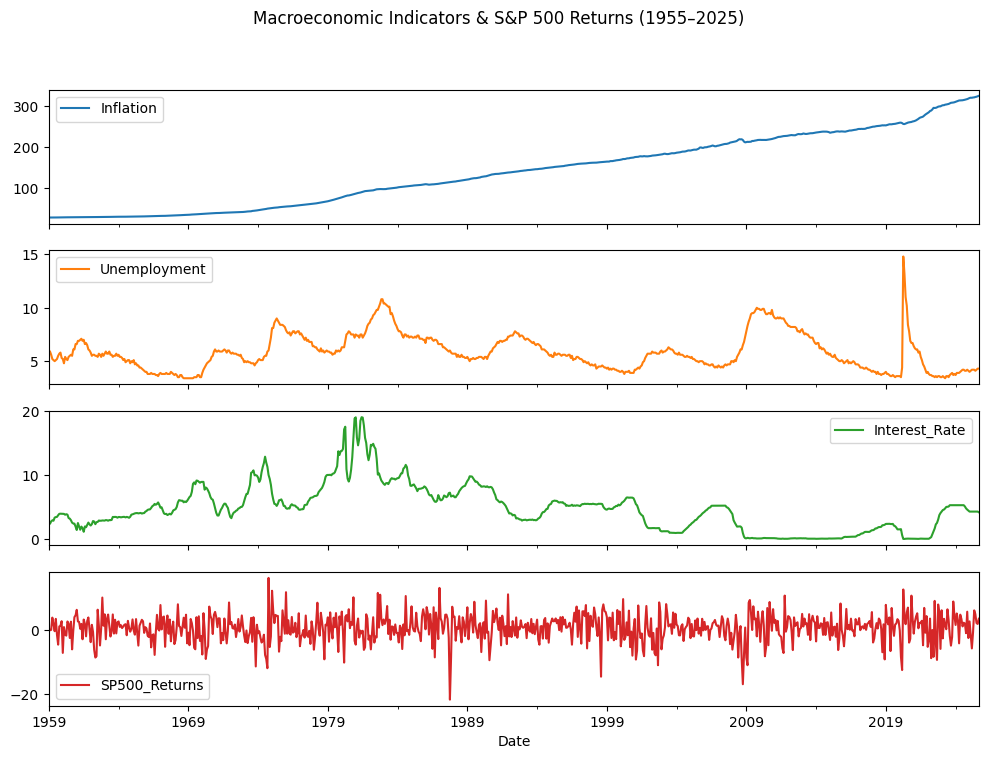

In [ ]:
# time series
df[['Inflation', 'Unemployment', 'Interest_Rate', 'SP500_Returns']].plot(subplots=True, figsize=(12,8))
plt.suptitle('Macroeconomic Indicators & S&P 500 Returns (1955–2025)')
plt.show()

### Correlation Heatmap

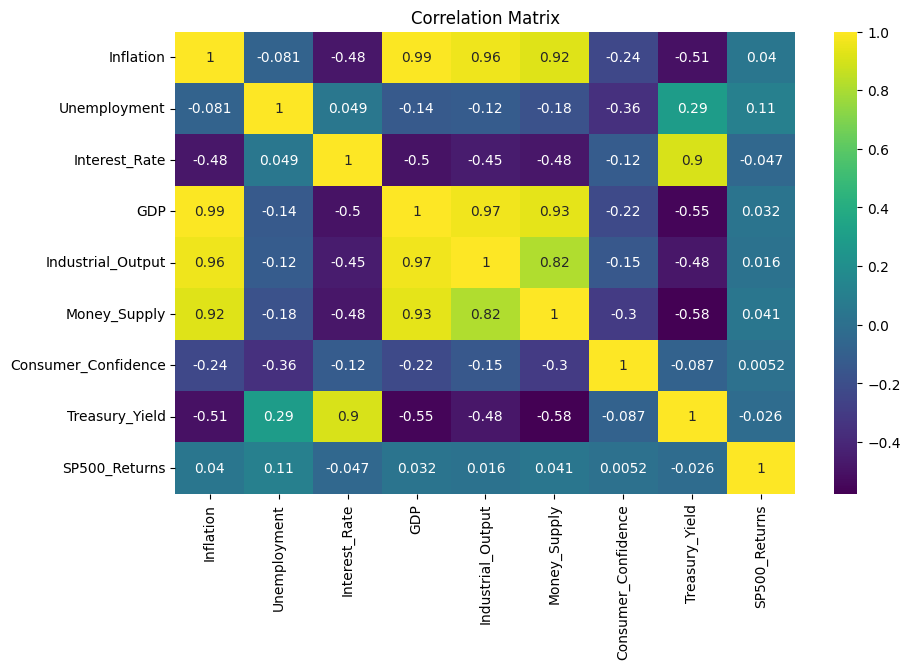

In [ ]:
# Correlation heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.title('Correlation Matrix')
plt.show()

### Overall Trends for All Indicators

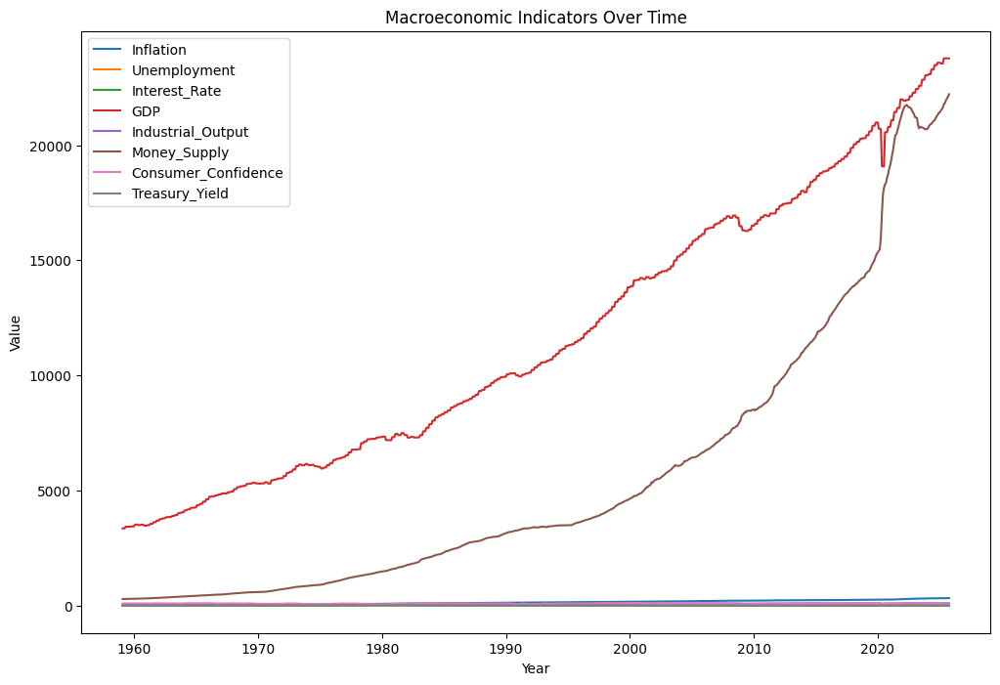

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Plot overall trends for all indicators
plt.figure(figsize=(12, 8))
for col in df.columns[:-1]:  # excluding SP500_Returns
    plt.plot(df.index, df[col], label=col)
plt.title("Macroeconomic Indicators Over Time")
plt.xlabel("Year")
plt.ylabel("Value")
plt.legend()
plt.show()



### Inflation vs. S&P 500 Returns

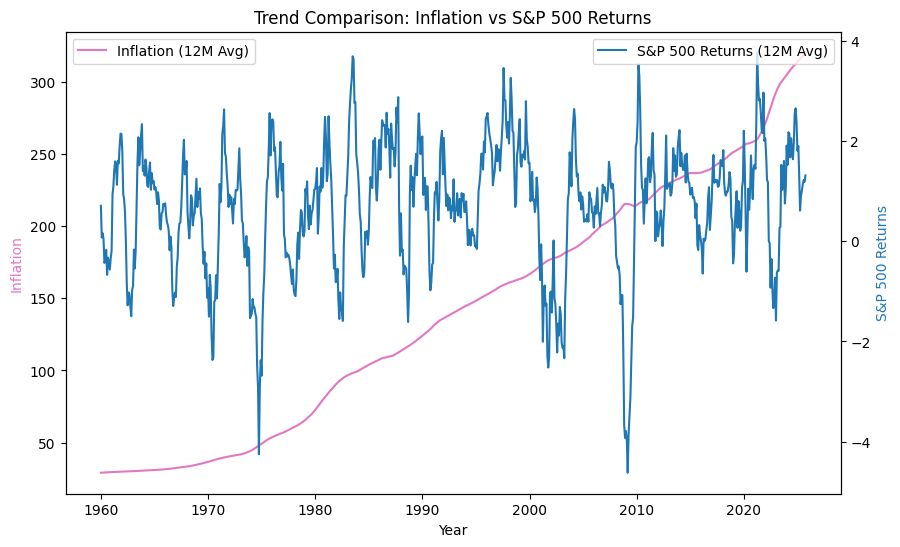

In [ ]:

# Compare Inflation vs. S&P 500 Returns (trend comparison)

rolling_df = df.rolling(window=12).mean()
fig, ax1 = plt.subplots(figsize=(10,6))
ax1.plot(rolling_df.index, rolling_df["Inflation"], color='tab:pink', label='Inflation (12M Avg)')
ax2 = ax1.twinx()
ax2.plot(rolling_df.index, rolling_df["SP500_Returns"], color='tab:blue', label='S&P 500 Returns (12M Avg)')

ax1.set_xlabel("Year")
ax1.set_ylabel("Inflation", color='tab:pink')
ax2.set_ylabel("S&P 500 Returns", color='tab:blue')
plt.title("Trend Comparison: Inflation vs S&P 500 Returns")
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()

### Time Series Visualization

* Inflation: Strong long-term upward trend, accelerating in recent decades; non-stationary.

* GDP: Persistent growth with a sharp dip during the 2020 pandemic; long-term trend.

* Money Supply: Near-exponential long-term growth, with large expansions post-2008 and post-2020.

* Industrial Output: Upward trend reflecting production growth, with cyclical dips during recessions.

* Unemployment: Highly cyclical, with sharp spikes during recessions and prolonged declines in expansions.

* Interest Rate: U-shaped secular trend, peaking in the early 1980s, declining toward zero, rising post-2022.

* Treasury Yield: Cyclical pattern mirroring interest rates; historical lows post-2008.

* Consumer Confidence: Mean-reverting and volatile, fluctuating within a relatively fixed range; drops during economic distress.

* SP500 Returns: Visually stationary around zero, highly volatile, showing volatility clustering but no long-term trend.

In [ ]:
variables = ['Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
             'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
             'Treasury_Yield', 'SP500_Returns']

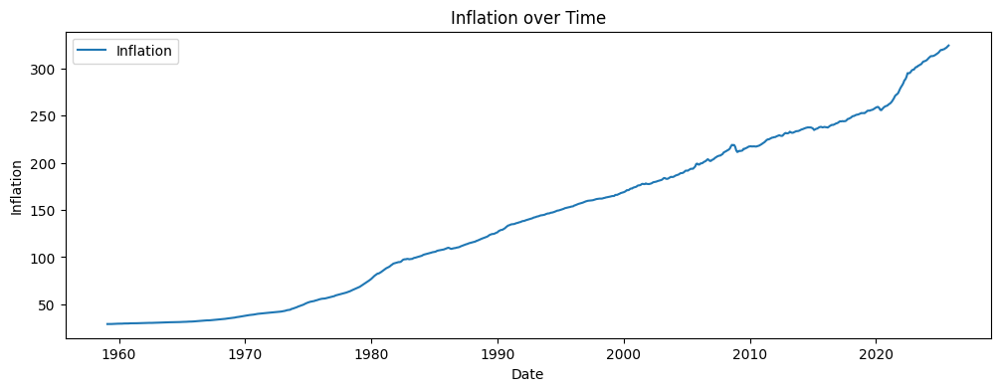

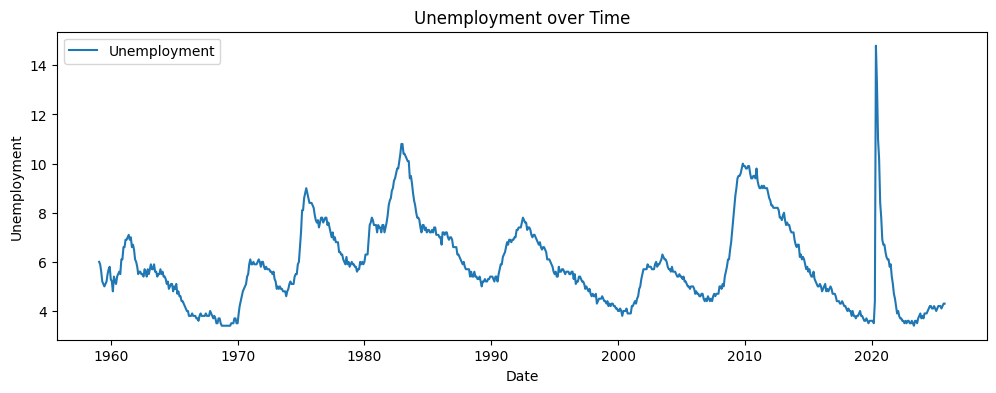

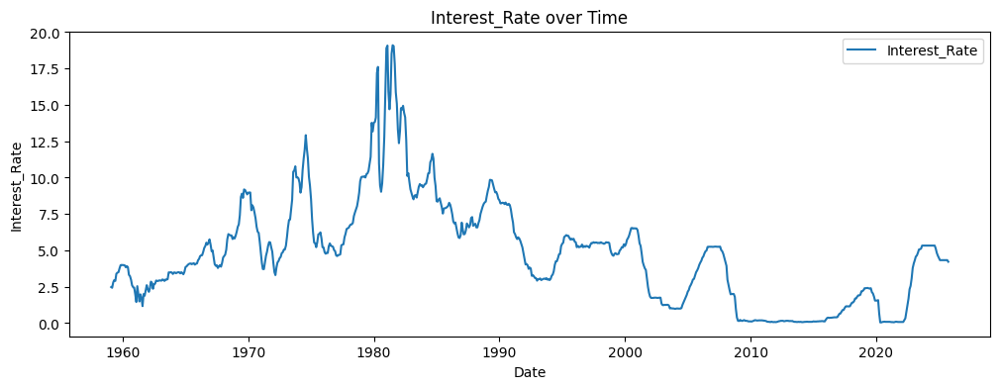

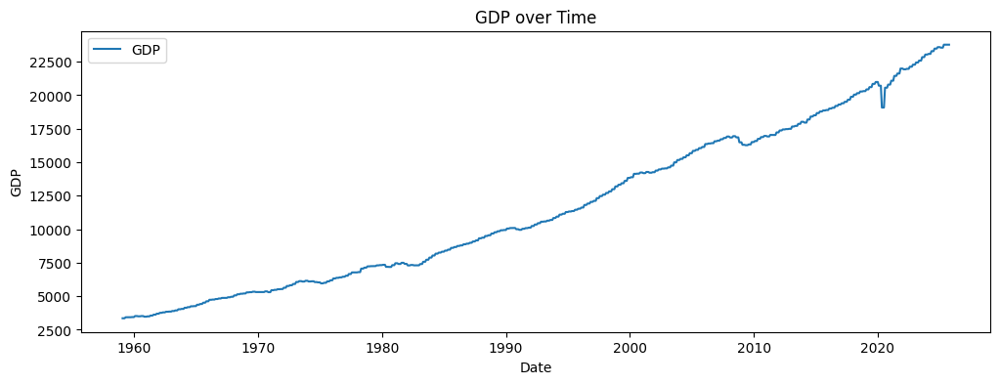

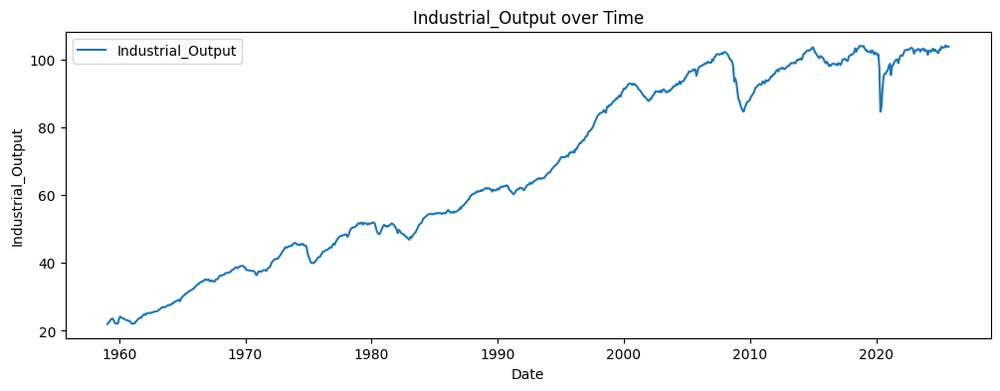

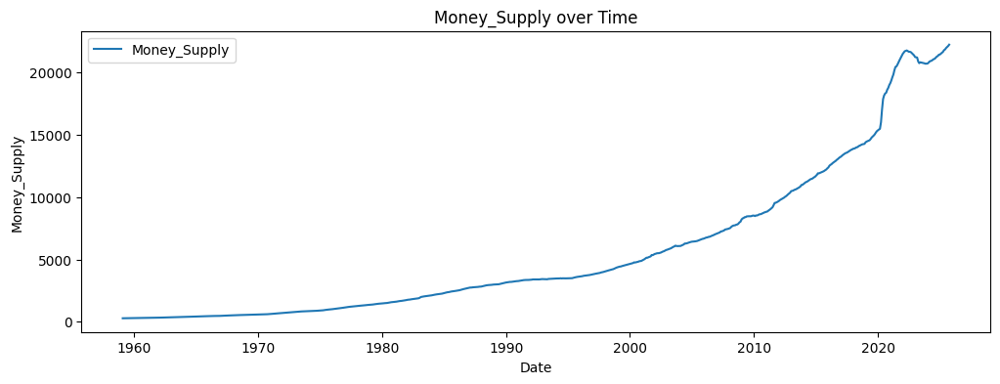

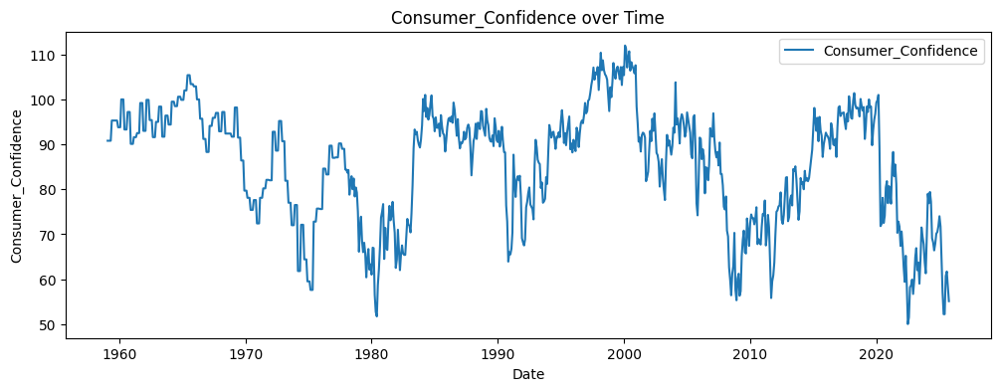

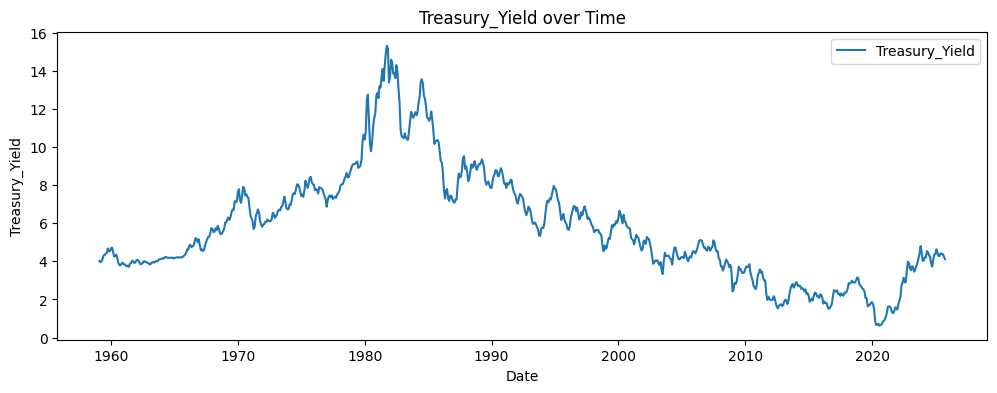

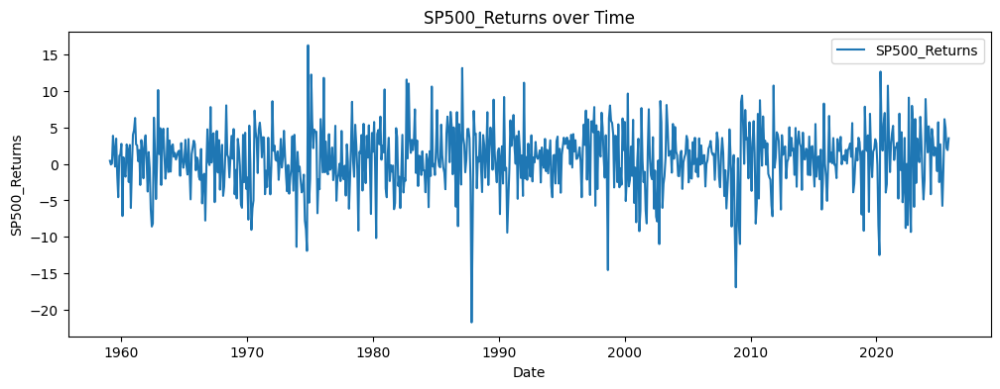

In [ ]:
# Line plots for each variable
for col in variables:
    plt.figure(figsize=(12,4))
    plt.plot(df.index, df[col], label=col)
    plt.title(f"{col} over Time")
    plt.xlabel("Date")
    plt.ylabel(col)
    plt.legend()
    plt.show()

### Rolling Averages

The 12-month rolling averages provide visual confirmation of the stationarity and trend properties of the variables:

* Trending variables (GDP, Inflation, Money Supply, Industrial Output): Rolling averages closely follow the original data, confirming strong long-term trends and the need for log-differencing to achieve stationarity.

* Interest Rate and Treasury Yield: Moving averages highlight long-term peaks and declines, supporting the use of first differences to model rate changes.

* SP500 Returns: Rolling averages hover near zero, confirming stationarity (I(0)) and suitability for modeling in levels.

* Unemployment and Consumer Confidence: Cyclical patterns are evident, with no persistent long-term trend, suggesting they may be I(0) or I(1) depending on formal tests.

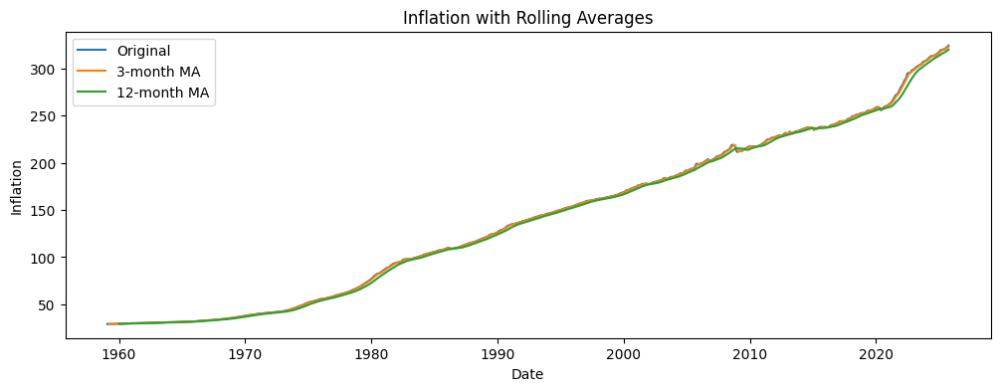

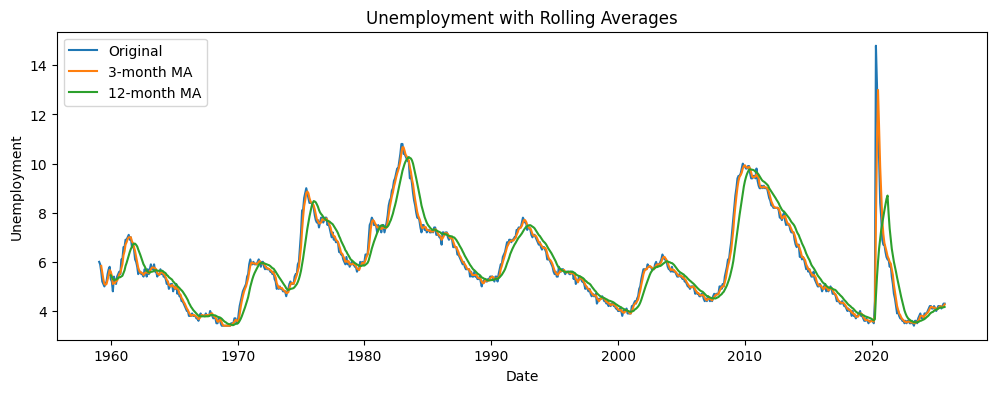

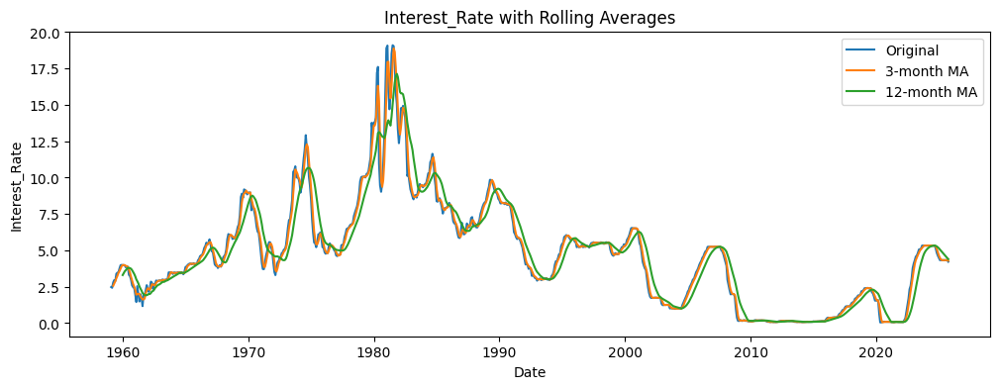

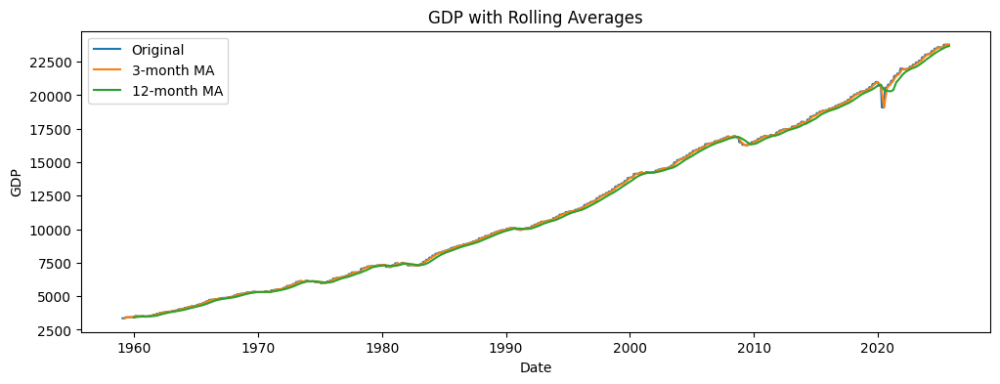

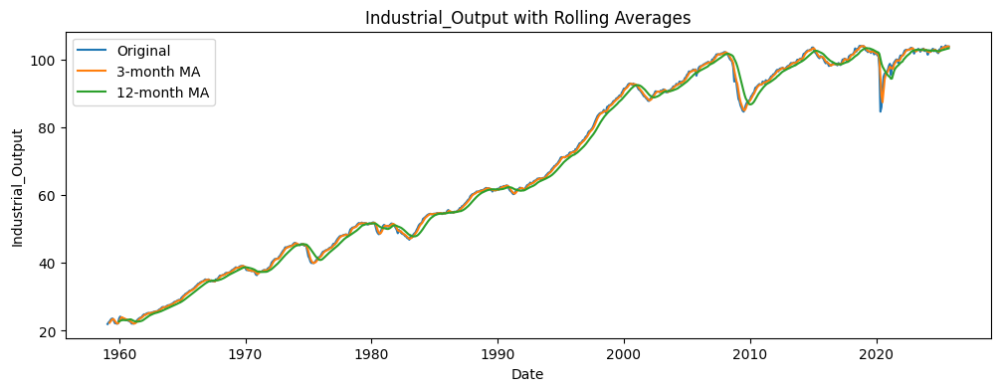

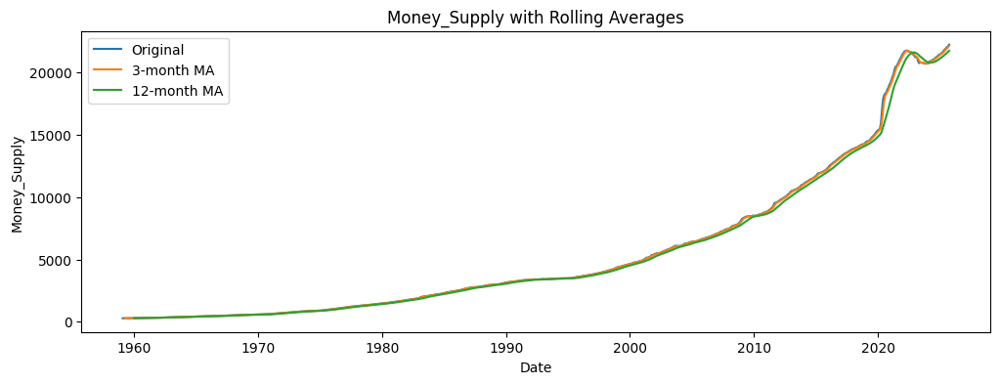

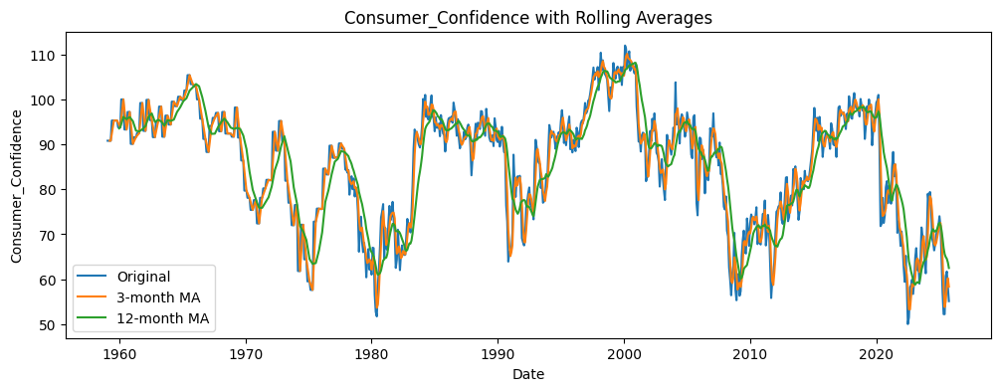

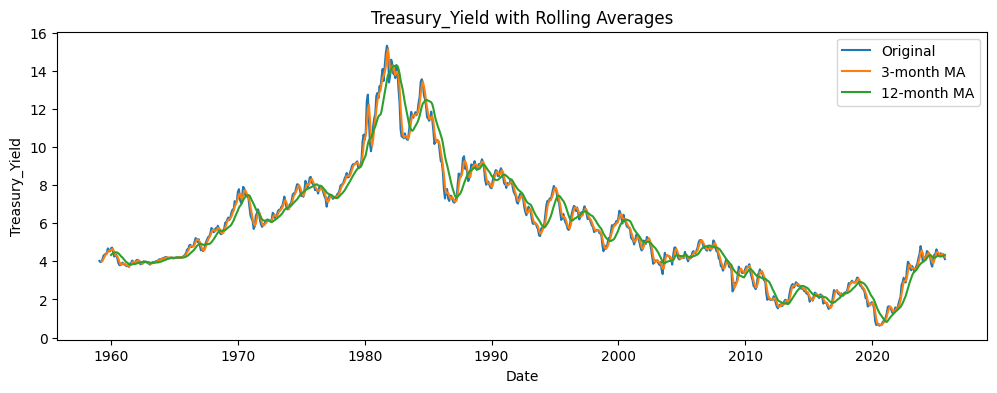

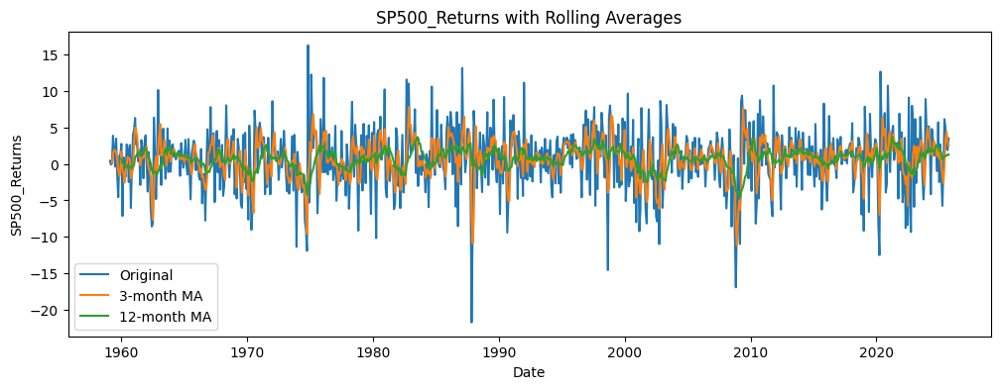

In [ ]:
# Rolling averages: 3-month and 12-month
for col in variables:
    plt.figure(figsize=(12,4))
    plt.plot(df.index, df[col], label='Original')
    plt.plot(df.index, df[col].rolling(window=3).mean(), label='3-month MA')
    plt.plot(df.index, df[col].rolling(window=12).mean(), label='12-month MA')
    plt.title(f"{col} with Rolling Averages")
    plt.xlabel("Date")
    plt.ylabel(col)
    plt.legend()
    plt.show()

### Distribution Analysis

* Inflation & GDP: Broad, platykurtic distributions (Kurtosis ≈ -1.1), with wide ranges due to long-term trends but no extreme outliers.

* Industrial Output: Nearly symmetric and highly platykurtic (Skewness ≈ -0.09, Kurtosis ≈ -1.47), reflecting a uniform spread across historical levels.

* Unemployment: Positively skewed (Skewness ≈ 0.93) with occasional high-value outliers during recessions.

* Interest Rate: Positively skewed (Skewness ≈ 0.99), concentrated at low rates with extreme historical highs as outliers.

* Money Supply: Strong positive skew (Skewness ≈ 1.38); recent high values are extreme outliers, indicating need for log transformation.

* Consumer Confidence: Slightly negatively skewed (Skewness ≈ -0.53) with a bimodal tendency, reflecting generally optimistic sentiment with periodic drops.

* Treasury Yield: Positively skewed (Skewness ≈ 0.80), with historically high rates in the 1980s as notable outliers.

* SP500 Returns: Slight negative skew (Skewness ≈ -0.43) and leptokurtic (Kurtosis ≈ 1.63), with fat tails and volatility-related outliers typical of financial returns.

Overall implication: Several variables are skewed or leptokurtic, indicating non-normality; transformations such as log or differencing may be required for robust VAR modeling.

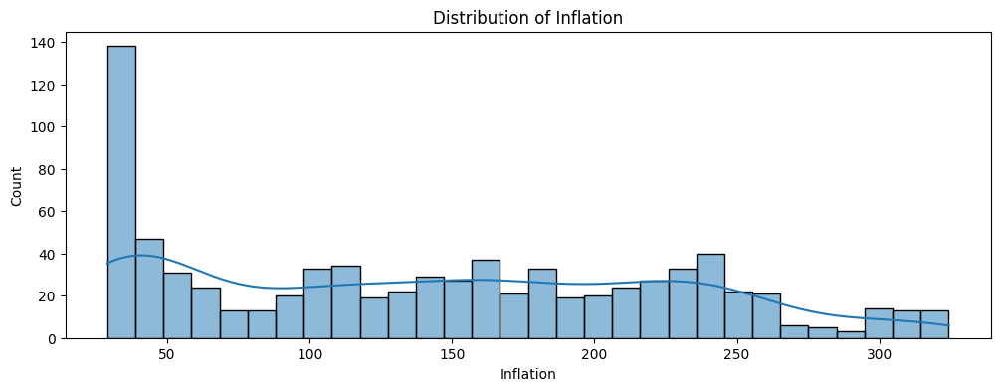

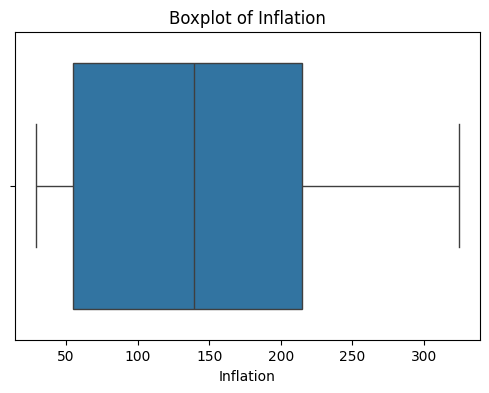

Inflation Skewness: 0.25, Kurtosis: -1.10



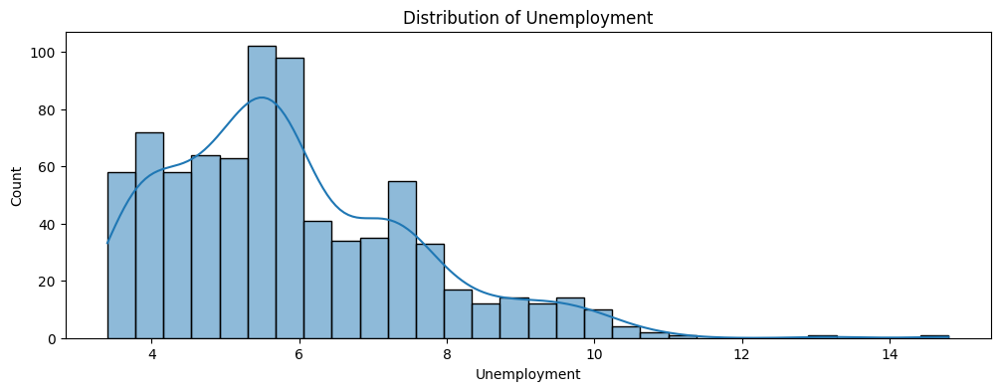

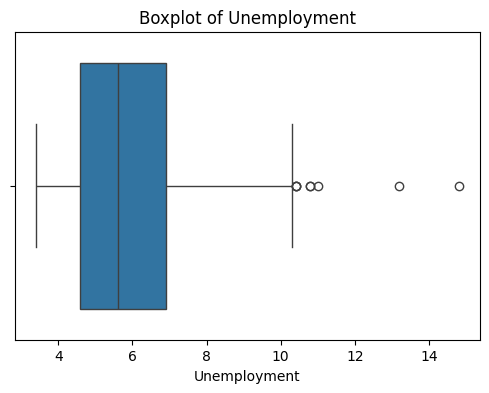

Unemployment Skewness: 0.93, Kurtosis: 1.15



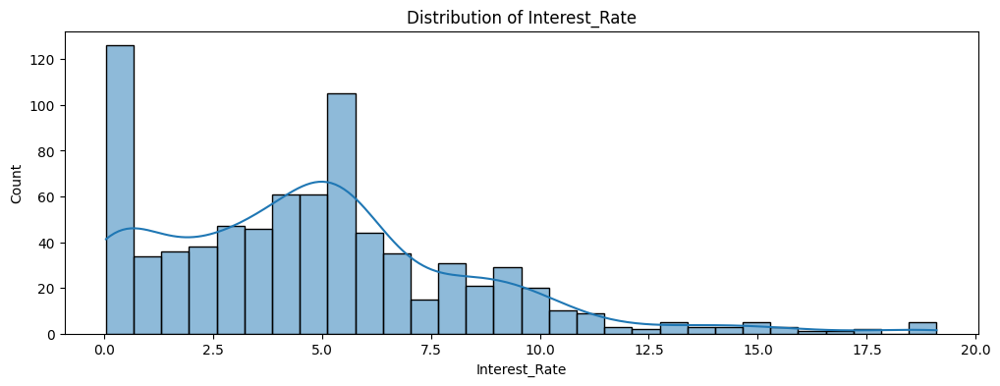

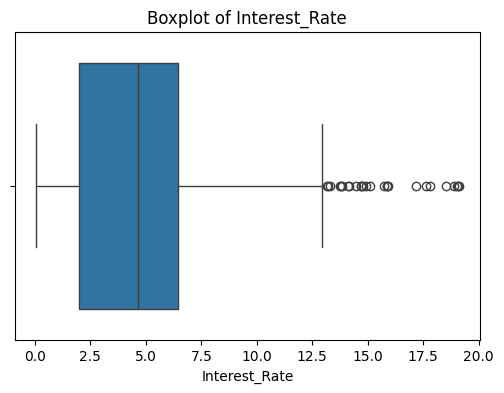

Interest_Rate Skewness: 0.99, Kurtosis: 1.52



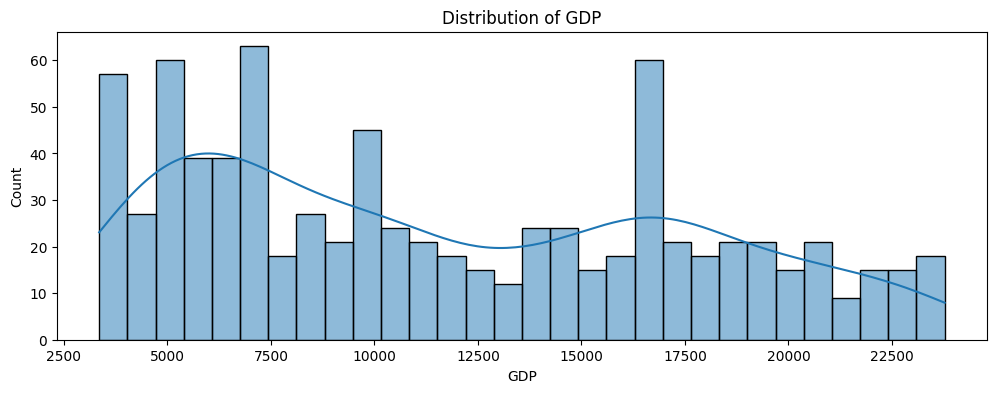

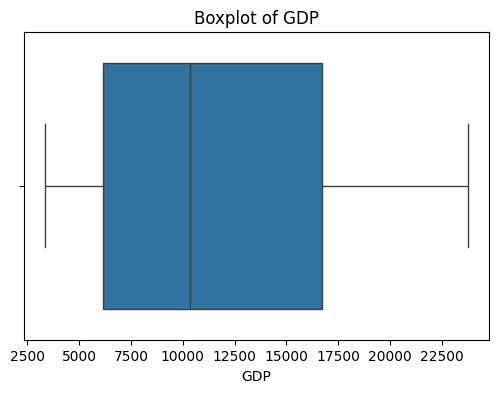

GDP Skewness: 0.36, Kurtosis: -1.13



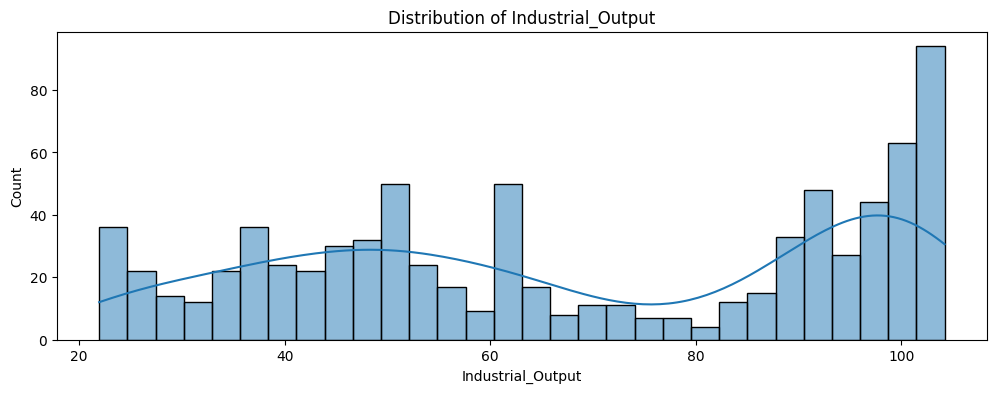

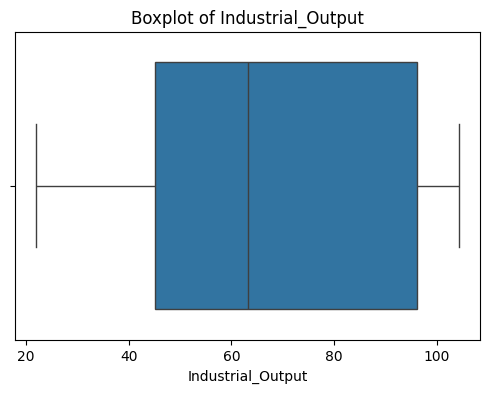

Industrial_Output Skewness: -0.09, Kurtosis: -1.47



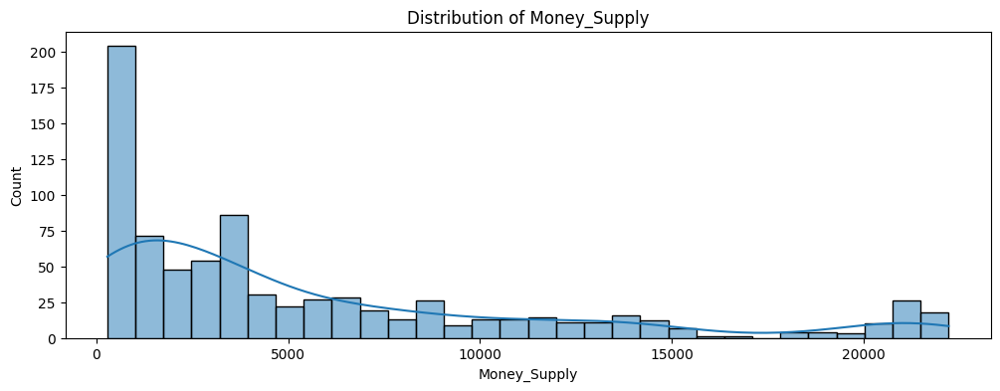

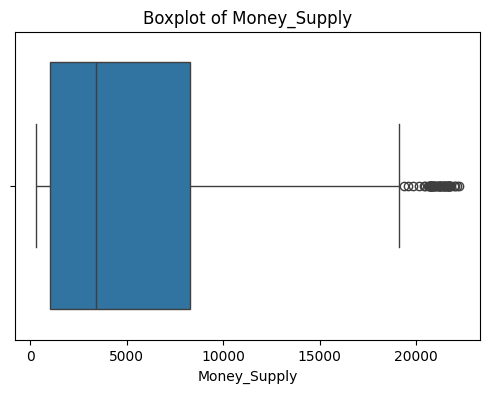

Money_Supply Skewness: 1.38, Kurtosis: 0.96



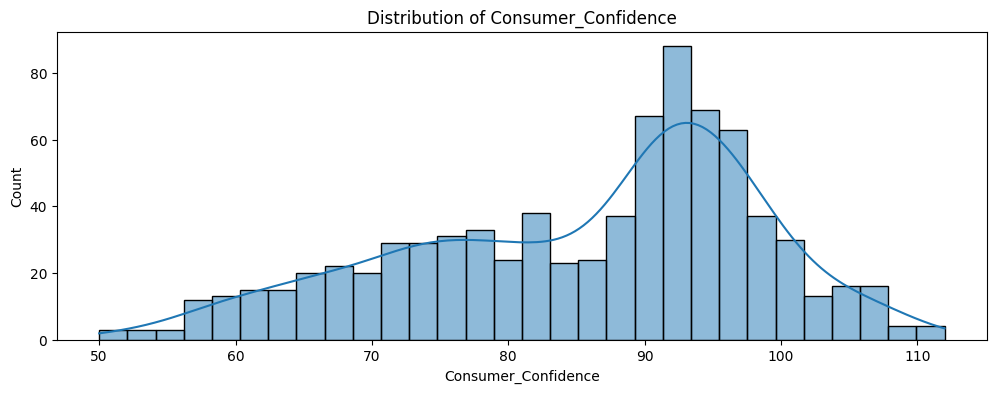

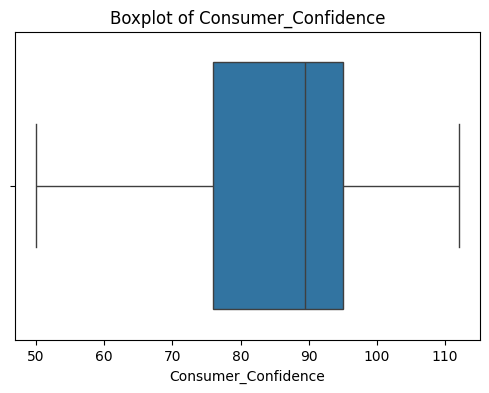

Consumer_Confidence Skewness: -0.53, Kurtosis: -0.52



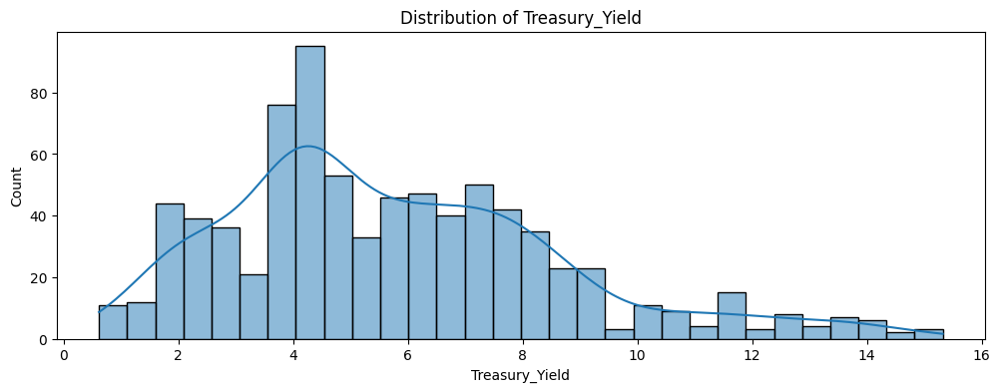

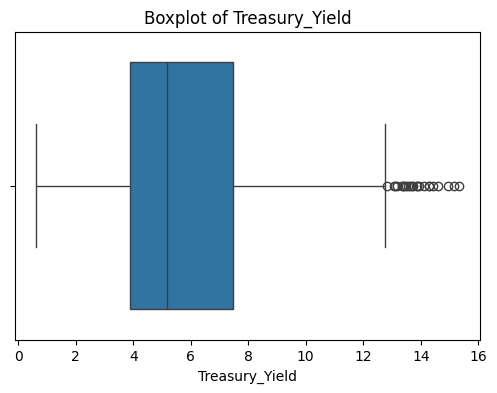

Treasury_Yield Skewness: 0.80, Kurtosis: 0.48



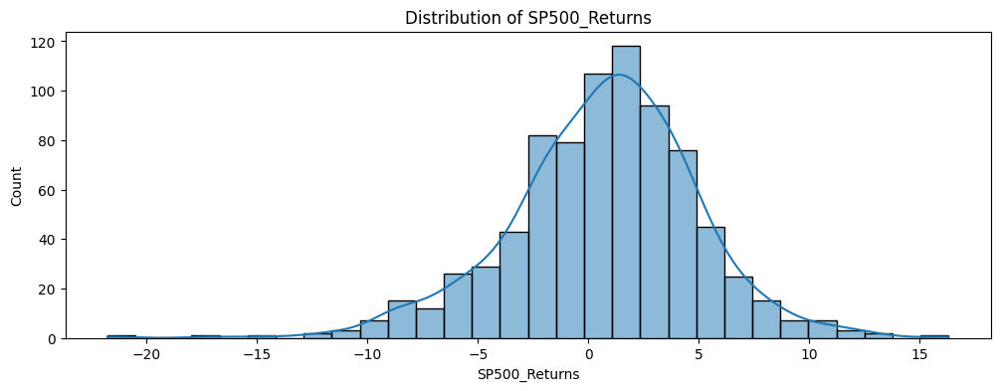

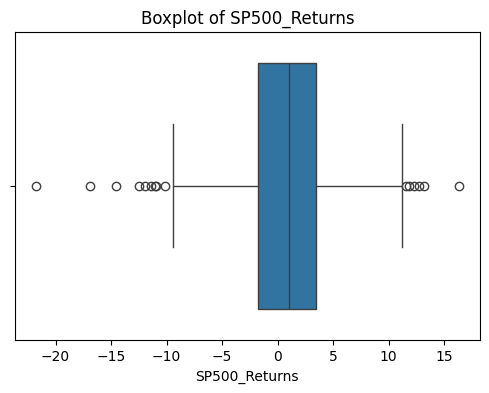

SP500_Returns Skewness: -0.43, Kurtosis: 1.63



In [ ]:
for col in variables:
    plt.figure(figsize=(12,4))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    plt.show()

    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

    print(f"{col} Skewness: {df[col].skew():.2f}, Kurtosis: {df[col].kurt():.2f}\n")

### Lagged Relationships (ACF, PACF, Scatter with Lags)

* Stationary variable (I(0)):

  * SP500 Returns: No significant autocorrelation; Lag Plot scattered, ready for VAR modeling in levels.

* Non-stationary variables (I(1)), requiring transformation:

  * Inflation, GDP, Money Supply, Industrial Output: Slowly decaying ACFs and linear Lag Plots confirm strong trends; log-differencing recommended to model growth rates.

  * Interest Rate, Treasury Yield, Unemployment, Consumer Confidence: Slowly decaying ACFs with linear Lag Plots indicate persistence; first-differencing required to model changes over time.

Overall implication: All macroeconomic variables exhibit non-stationarity and require appropriate transformations (log or first differences) for unbiased VAR modeling, while SP500 Returns can enter the model directly.

<Figure size 1200x400 with 0 Axes>

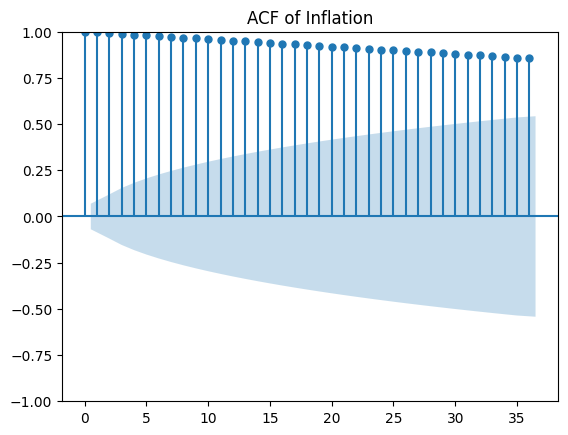

<Figure size 1200x400 with 0 Axes>

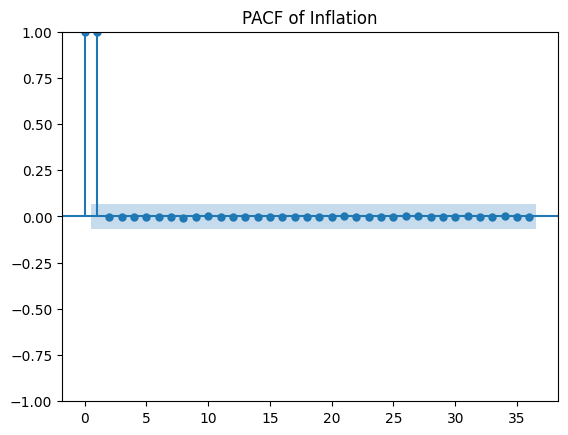

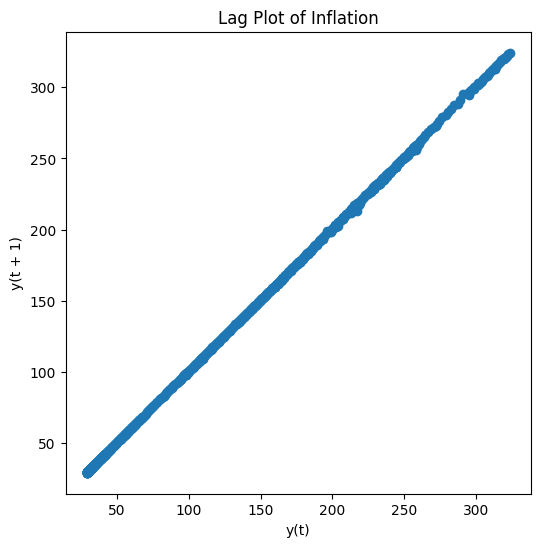

<Figure size 1200x400 with 0 Axes>

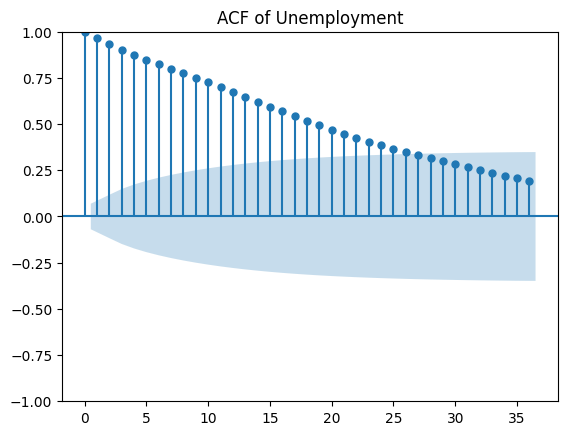

<Figure size 1200x400 with 0 Axes>

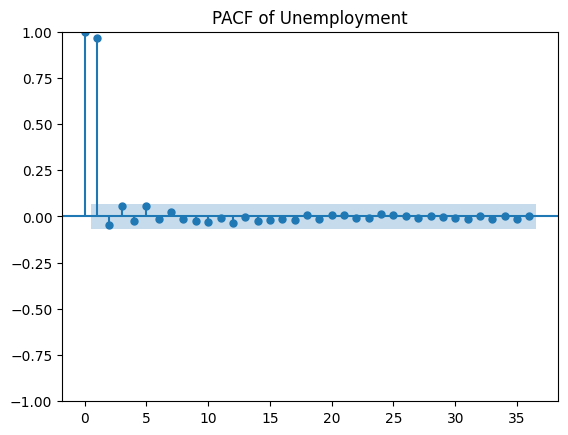

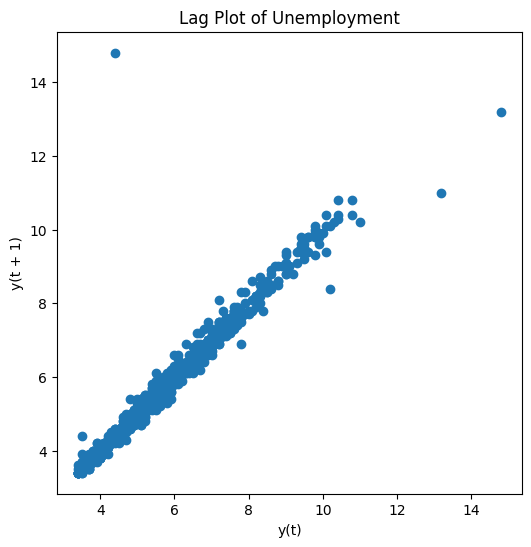

<Figure size 1200x400 with 0 Axes>

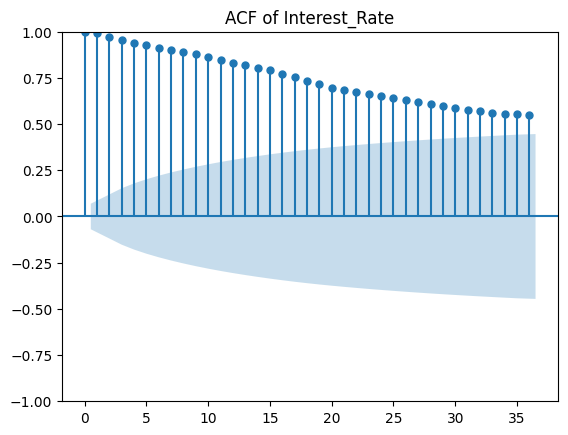

<Figure size 1200x400 with 0 Axes>

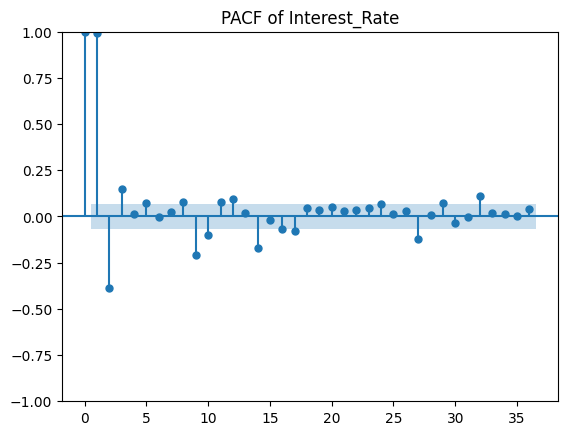

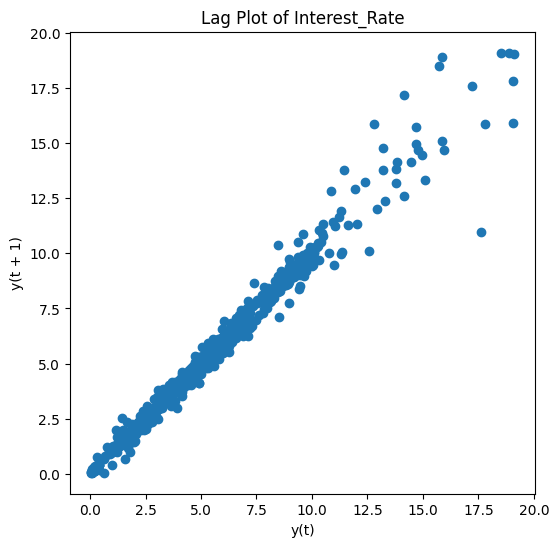

<Figure size 1200x400 with 0 Axes>

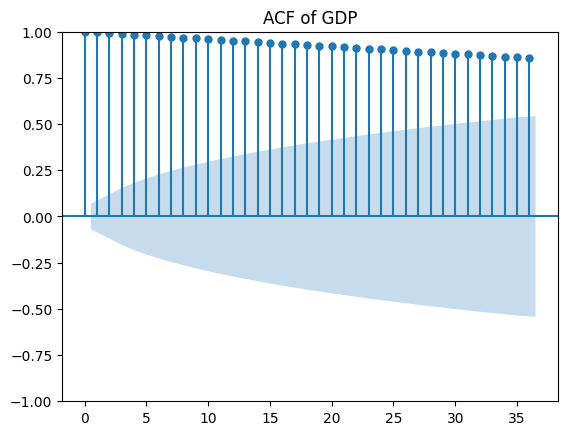

<Figure size 1200x400 with 0 Axes>

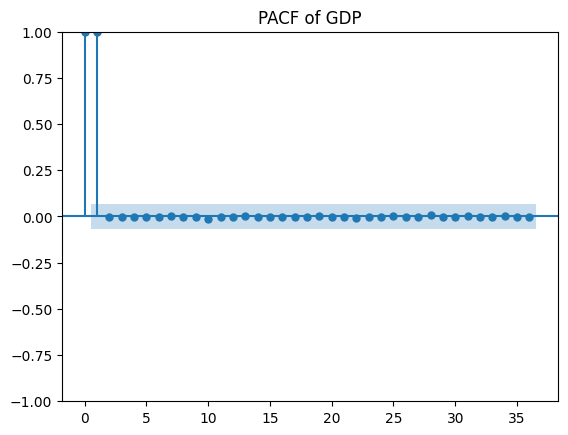

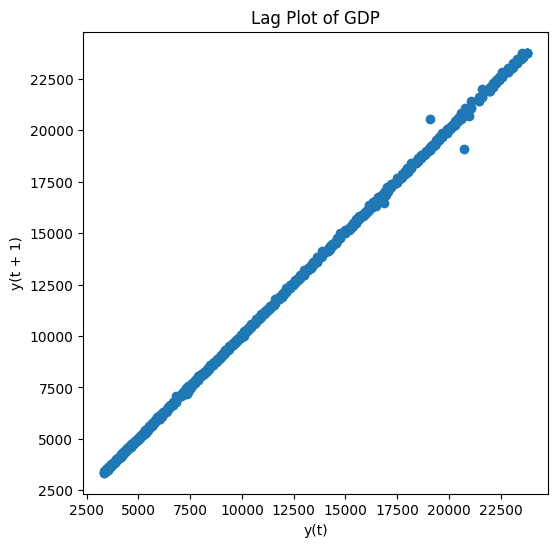

<Figure size 1200x400 with 0 Axes>

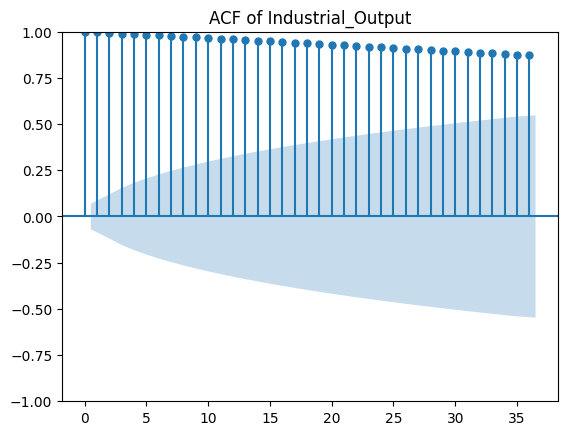

<Figure size 1200x400 with 0 Axes>

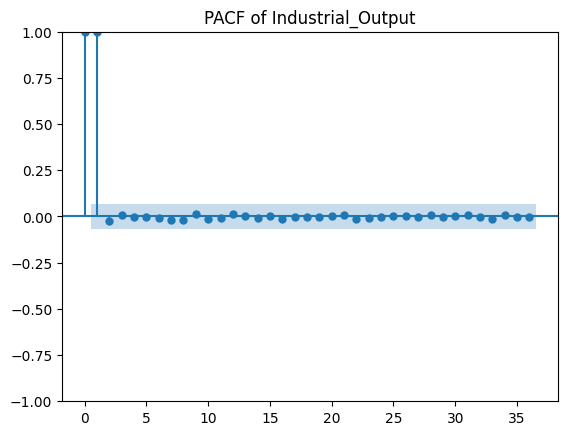

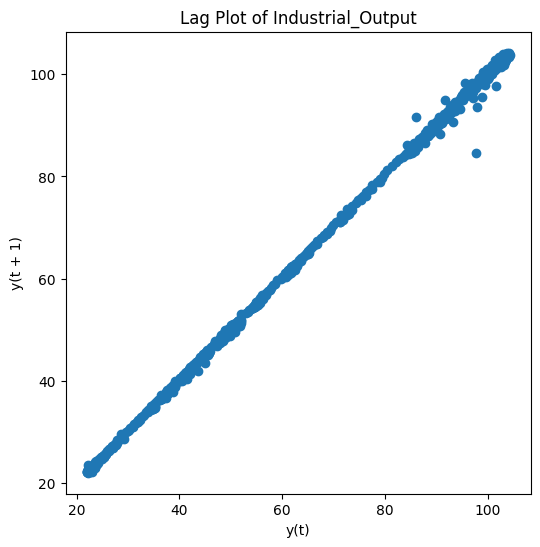

<Figure size 1200x400 with 0 Axes>

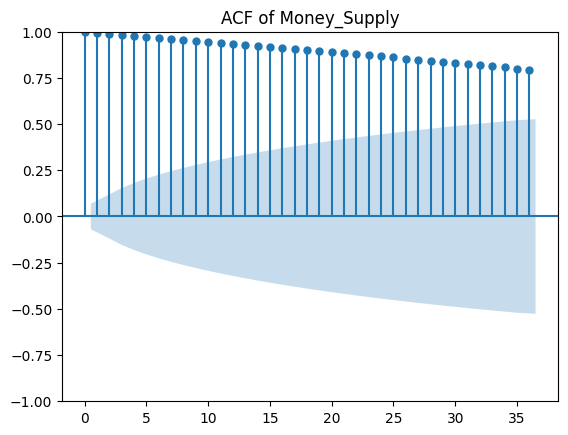

<Figure size 1200x400 with 0 Axes>

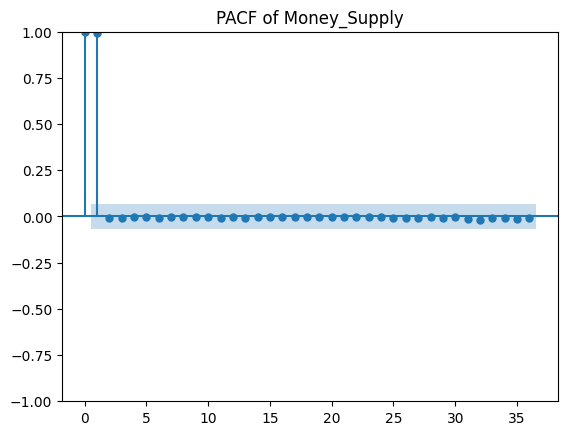

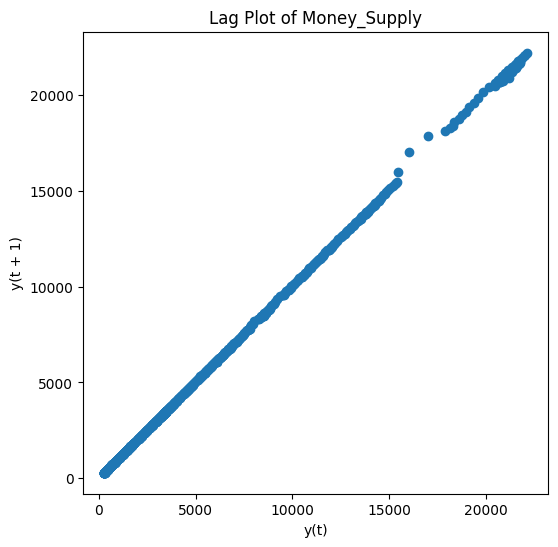

<Figure size 1200x400 with 0 Axes>

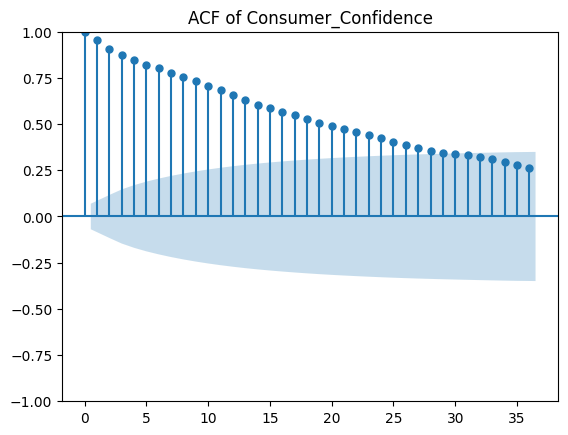

<Figure size 1200x400 with 0 Axes>

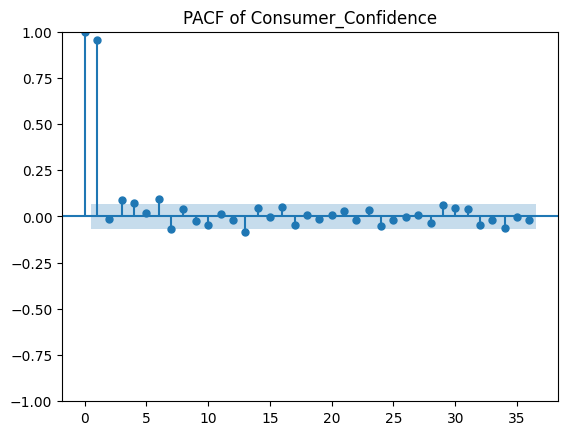

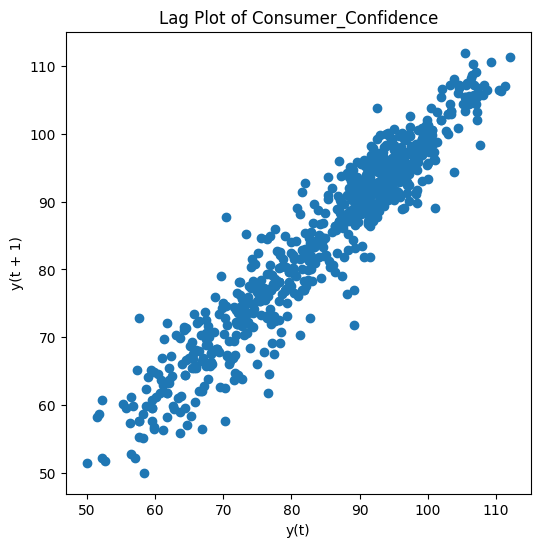

<Figure size 1200x400 with 0 Axes>

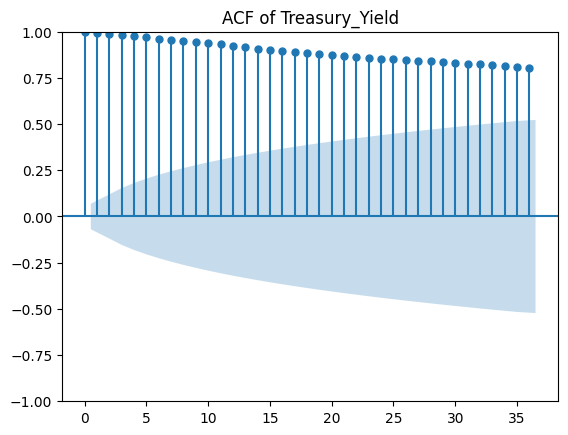

<Figure size 1200x400 with 0 Axes>

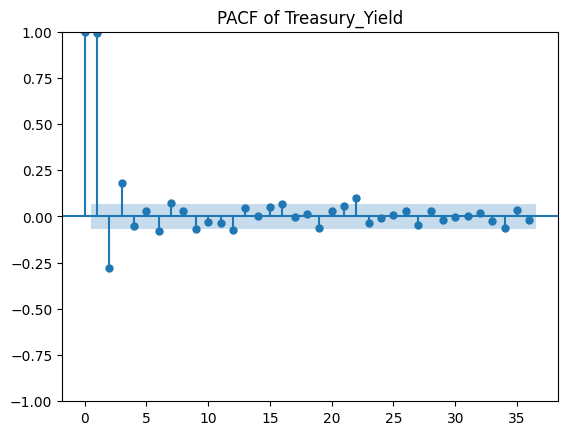

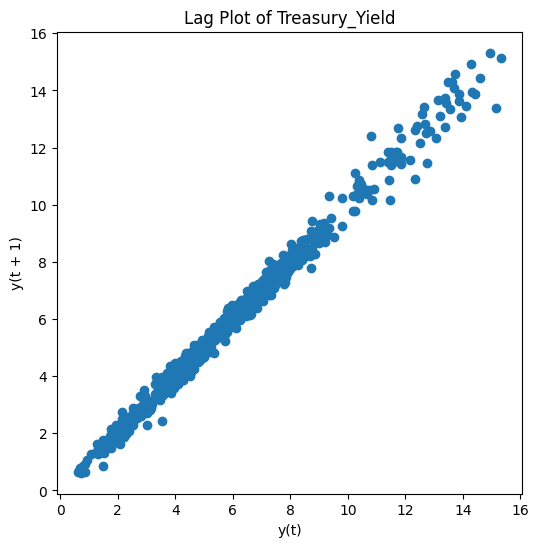

<Figure size 1200x400 with 0 Axes>

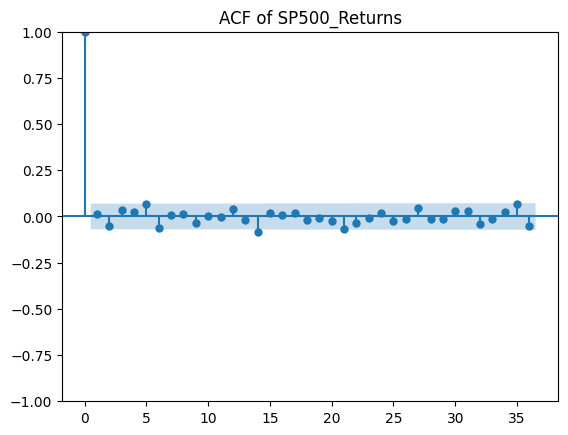

<Figure size 1200x400 with 0 Axes>

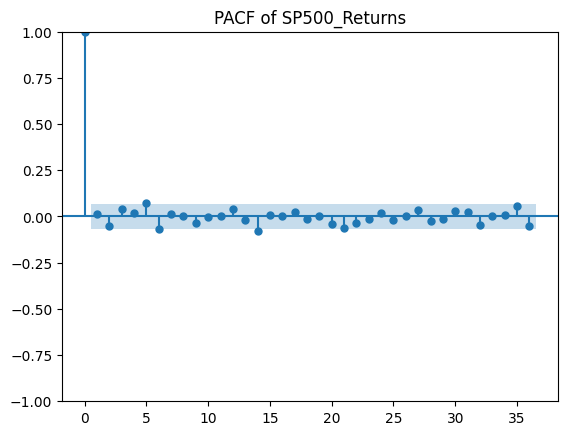

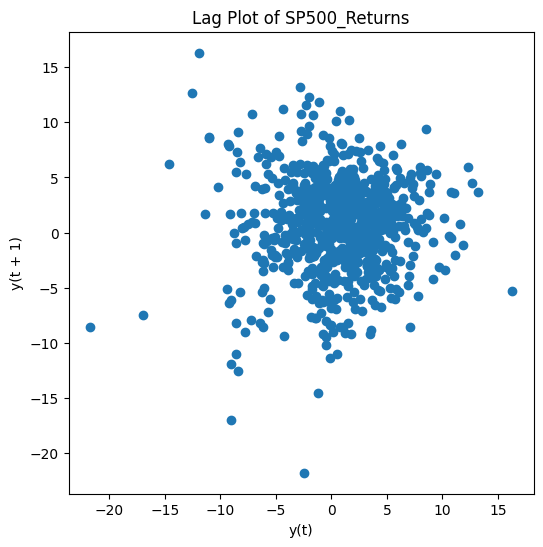

In [ ]:
from pandas.plotting import lag_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

for col in variables:
    plt.figure(figsize=(12,4))
    plot_acf(df[col].dropna(), lags=36)
    plt.title(f"ACF of {col}")
    plt.show()

    plt.figure(figsize=(12,4))
    plot_pacf(df[col].dropna(), lags=36)
    plt.title(f"PACF of {col}")
    plt.show()

    plt.figure(figsize=(6,6))
    lag_plot(df[col])
    plt.title(f"Lag Plot of {col}")
    plt.show()

### Volatility / Stationarity Checks

* Stationary variables (I(0)) with volatility considerations:

  * SP500 Returns: Stationary (p = 0.0000); Rolling Std shows volatility clustering.

  * Unemployment: Stationary (p = 0.0101); volatility spike during 2020 pandemic indicates structural break.

  * Interest Rate: Stationary (p = 0.0418); historical volatility clustering in the 1970s–1980s (heteroskedasticity).

  * Consumer Confidence: Stationary (p = 0.0360); cyclical fluctuations in volatility over time.

* Non-stationary variables (I(1)), requiring transformation:

  * Inflation, GDP, Money Supply, Industrial Output, Treasury Yield: ADF confirms non-stationarity (p ≥ 0.6490); log-differencing (for indices) or first-differencing (for rates) required before VAR modeling.

Overall implication: Most macroeconomic variables are non-stationary and require transformation, while stationary variables may still exhibit volatility clustering, which should be considered in modeling.

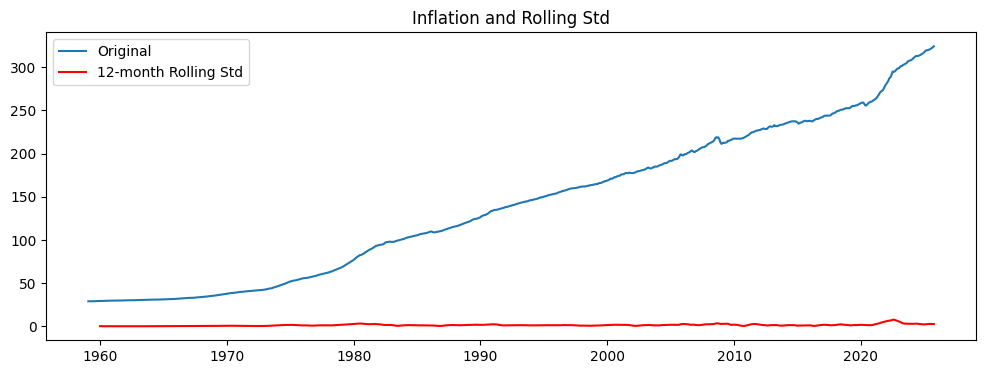

Inflation Dickey-Fuller Test:
  Test Statistic = 2.1120
  p-value = 0.9988
  Series is non-stationary.



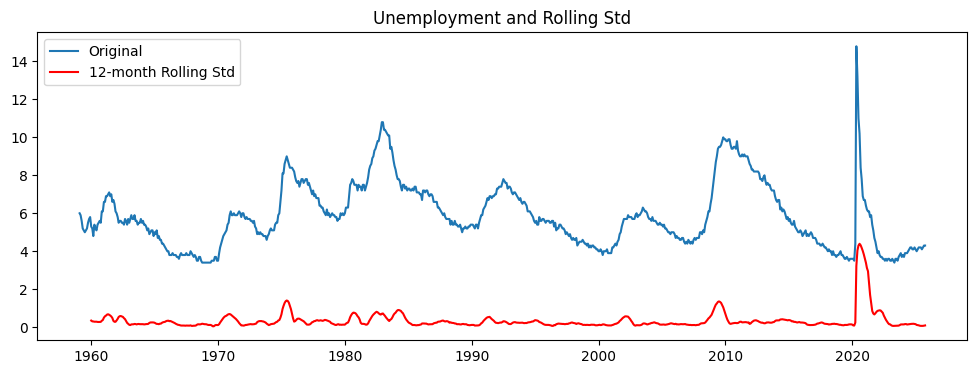

Unemployment Dickey-Fuller Test:
  Test Statistic = -3.4271
  p-value = 0.0101
  Series is stationary.



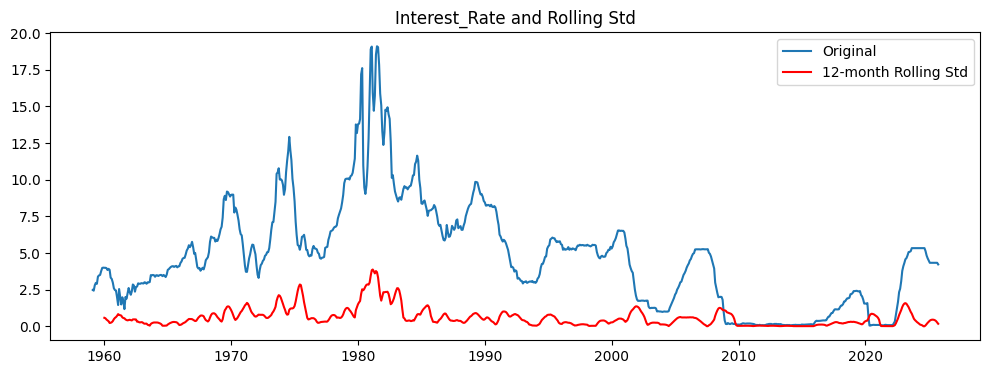

Interest_Rate Dickey-Fuller Test:
  Test Statistic = -2.9316
  p-value = 0.0418
  Series is stationary.



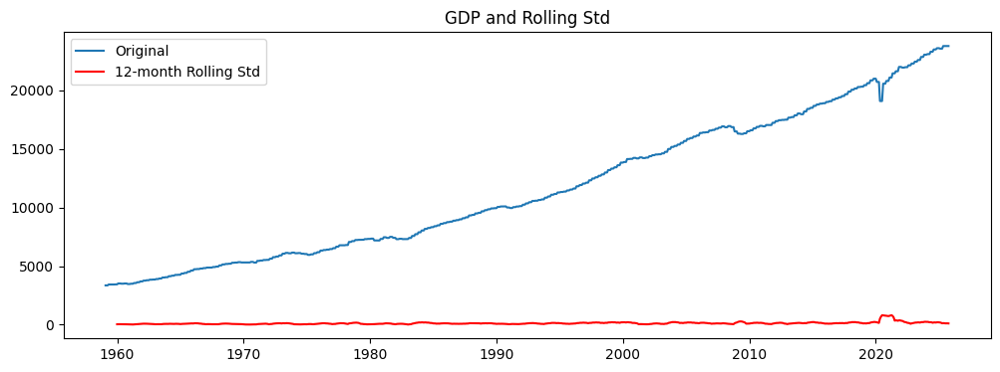

GDP Dickey-Fuller Test:
  Test Statistic = 2.6400
  p-value = 0.9991
  Series is non-stationary.



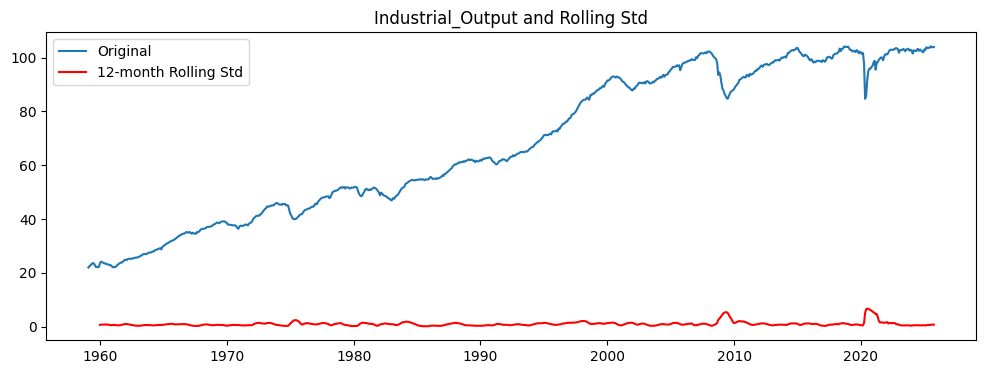

Industrial_Output Dickey-Fuller Test:
  Test Statistic = -1.0437
  p-value = 0.7370
  Series is non-stationary.



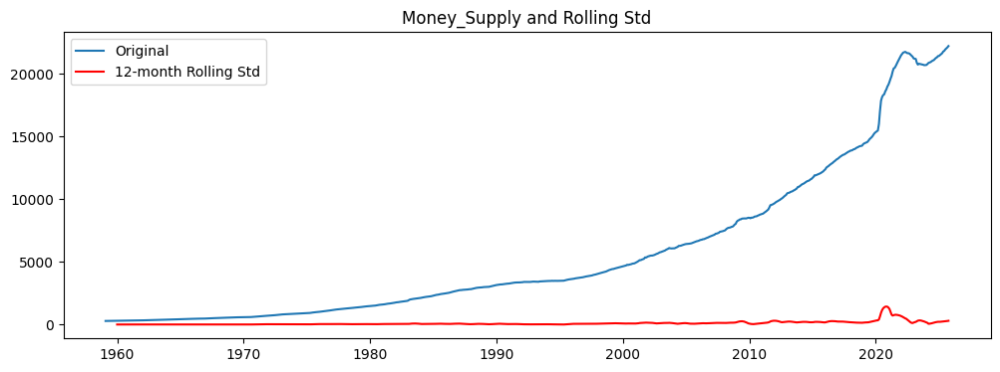

Money_Supply Dickey-Fuller Test:
  Test Statistic = 3.1502
  p-value = 1.0000
  Series is non-stationary.



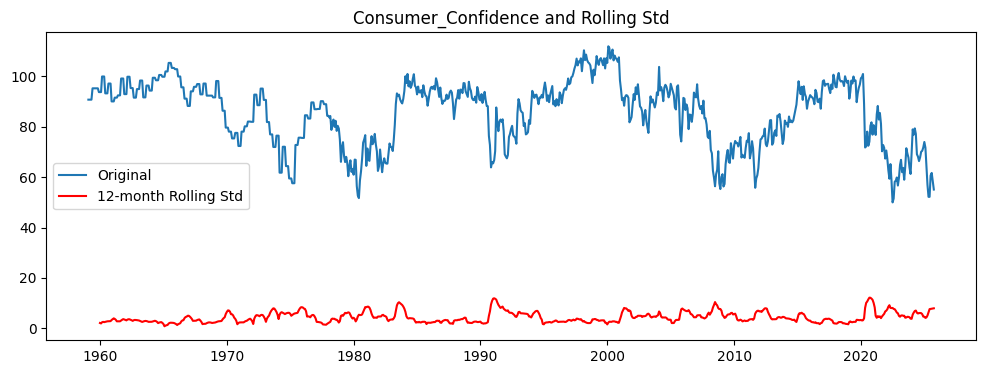

Consumer_Confidence Dickey-Fuller Test:
  Test Statistic = -2.9882
  p-value = 0.0360
  Series is stationary.



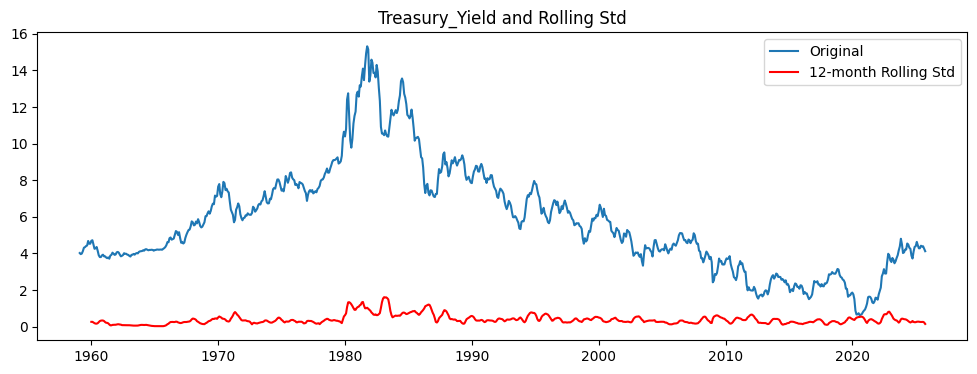

Treasury_Yield Dickey-Fuller Test:
  Test Statistic = -1.2561
  p-value = 0.6490
  Series is non-stationary.



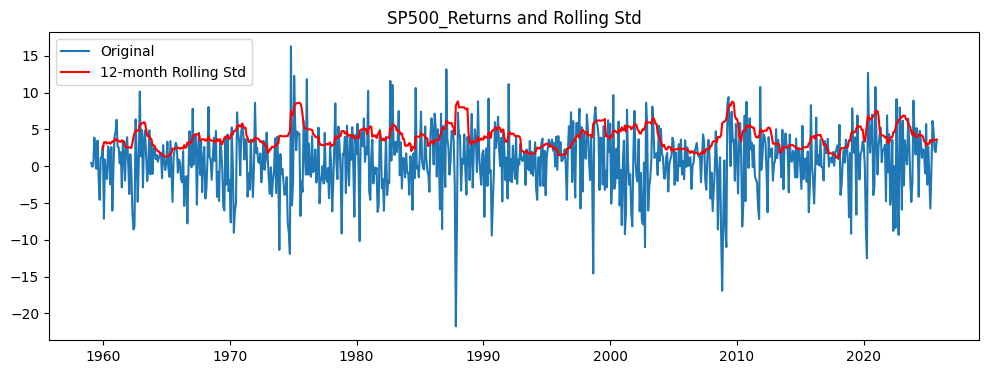

SP500_Returns Dickey-Fuller Test:
  Test Statistic = -11.3029
  p-value = 0.0000
  Series is stationary.



In [ ]:
from statsmodels.tsa.stattools import adfuller

for col in variables:
    # Rolling std
    plt.figure(figsize=(12,4))
    rolling_std = df[col].rolling(window=12).std()
    plt.plot(df.index, df[col], label='Original')
    plt.plot(df.index, rolling_std, label='12-month Rolling Std', color='red')
    plt.title(f"{col} and Rolling Std")
    plt.legend()
    plt.show()

    # Dickey-Fuller Test
    result = adfuller(df[col].dropna())
    print(f"{col} Dickey-Fuller Test:")
    print(f"  Test Statistic = {result[0]:.4f}")
    print(f"  p-value = {result[1]:.4f}")
    if result[1] < 0.05:
        print("  Series is stationary.\n")
    else:
        print("  Series is non-stationary.\n")

### Interaction & Insights




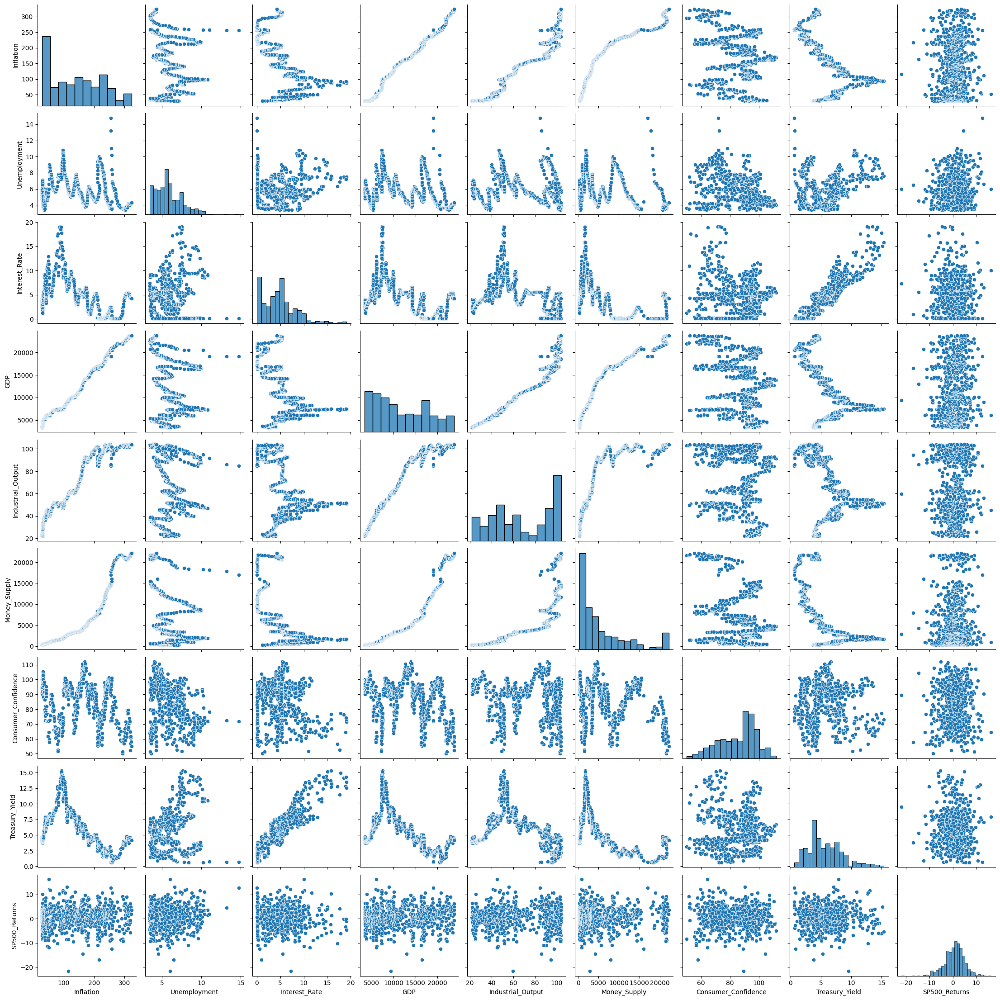

In [ ]:
sns.pairplot(df[variables])
plt.show()

### S&P500 Returns Highlighting Periods of High Inflation

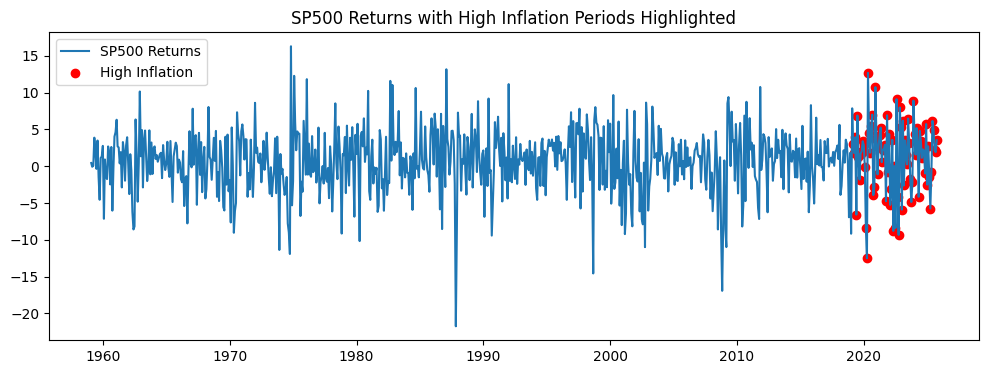

In [ ]:
high_inflation = df['Inflation'] > df['Inflation'].quantile(0.90)
plt.figure(figsize=(12,4))
plt.plot(df.index, df['SP500_Returns'], label='SP500 Returns')
plt.scatter(df.index[high_inflation], df['SP500_Returns'][high_inflation], color='red', label='High Inflation')
plt.title("SP500 Returns with High Inflation Periods Highlighted")
plt.legend()
plt.show()

### Heatmap of returns vs Interest Rate quantiles

/tmp/ipython-input-2324227040.py:3: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(values='SP500_Returns', index=df.index.year, columns='Interest_Quantile', aggfunc='mean')


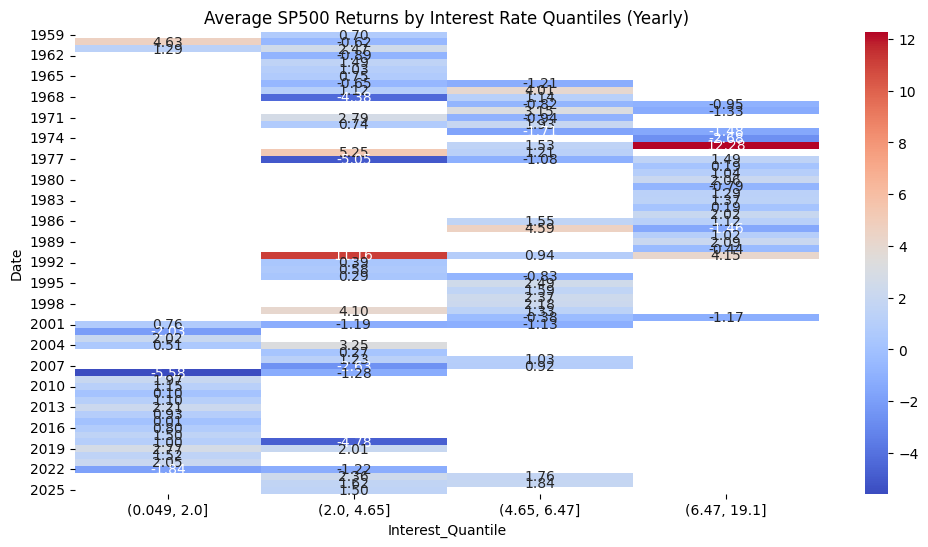

In [ ]:
# Heatmap of returns vs Interest Rate quantiles
df['Interest_Quantile'] = pd.qcut(df['Interest_Rate'], 4)
pivot_table = df.pivot_table(values='SP500_Returns', index=df.index.year, columns='Interest_Quantile', aggfunc='mean')
plt.figure(figsize=(12,6))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Average SP500 Returns by Interest Rate Quantiles (Yearly)")
plt.show()

### Correlation and High-Inflation Insights

* S&P 500 Returns vs. Macro Factors:

  * Very weak linear correlation (≈ 0) with all macro variables in levels.

  * Highlights the need for VAR modeling on differenced data to capture dynamic and lagged relationships.

* Inter-Macro Correlation:

  * Strong positive correlation (0.93–0.99) among trending variables (Inflation, GDP, Industrial Output, Money Supply).

  * Indicates high multicollinearity and a common growth/price factor, justifying VAR modeling.

* Interest Rate & Treasury Yield:

  * Highly correlated (≈ 0.90), representing overlapping monetary signals.

* SP500 Returns with High Inflation Highlighted:

  * Returns are stationary but show volatility clustering, especially post-2020.

  * Periods of high inflation coincide with increased volatility and frequent negative returns, suggesting higher market uncertainty and downside risk.

Overall implication: Linear correlations are insufficient; VAR modeling is necessary to capture dynamic, lagged interactions among macro variables and stock market returns, particularly under high-inflation regimes.

## Part 3 - MODELS

### VAR Model

In [ ]:
df = pd.read_csv('macro_data_cleaned.csv')
print(df.columns)


Index(['Date', 'Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
       'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
       'Treasury_Yield', 'SP500_Returns'],
      dtype='object')


In [ ]:
# converting Unnamed0 to date
df = pd.read_csv('macro_data_cleaned.csv')
print(df.columns)

df = df.rename(columns={'Unnamed: 0': 'Date'})

# Convert to datetime and set as index
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

df.info()


Index(['Date', 'Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
       'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
       'Treasury_Yield', 'SP500_Returns'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 801 entries, 1959-01-31 to 2025-09-30
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Inflation            801 non-null    float64
 1   Unemployment         801 non-null    float64
 2   Interest_Rate        801 non-null    float64
 3   GDP                  801 non-null    float64
 4   Industrial_Output    801 non-null    float64
 5   Money_Supply         801 non-null    float64
 6   Consumer_Confidence  801 non-null    float64
 7   Treasury_Yield       801 non-null    float64
 8   SP500_Returns        801 non-null    float64
dtypes: float64(9)
memory usage: 62.6 KB


In [ ]:
df.head()

,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
Date,,,,,,,,,
1959-01-31,29.01,6.0,2.48,3352.129,21.9616,286.6,90.8,4.02,0.434707
1959-02-28,29.00,5.9,2.43,3352.129,22.3917,287.7,90.8,3.96,-0.072139
1959-03-31,28.97,5.6,2.80,3352.129,22.7142,289.2,90.8,3.99,0.054140
1959-04-30,28.98,5.2,2.96,3427.667,23.1981,290.1,90.8,4.12,3.878069
1959-05-31,29.04,5.1,2.90,3427.667,23.5476,292.2,95.3,4.31,1.892690


In [ ]:
print(df.isnull().sum())
print(df.isnull().sum().sum())

Inflation              0
Unemployment           0
Interest_Rate          0
GDP                    0
Industrial_Output      0
Money_Supply           0
Consumer_Confidence    0
Treasury_Yield         0
SP500_Returns          0
dtype: int64
0


In [ ]:
df = df.dropna()

In [ ]:
data = df.copy()

for col in ['GDP', 'Industrial_Output', 'Money_Supply']:
    if (data[col] <= 0).any():
        data[f'logdiff_{col}'] = data[col].diff()
    else:
        data[f'logdiff_{col}'] = np.log(data[col]).diff()

data['diff_Inflation'] = data['Inflation'].diff()
data['diff_Interest_Rate'] = data['Interest_Rate'].diff()
data['diff_Treasury_Yield'] = data['Treasury_Yield'].diff()

data['Unemployment'] = data['Unemployment']
data['Consumer_Confidence'] = data['Consumer_Confidence']
data['SP500'] = data['SP500_Returns']

vars_for_var = [
    'diff_Inflation', 'Unemployment', 'diff_Interest_Rate',
    'logdiff_GDP', 'logdiff_Industrial_Output', 'logdiff_Money_Supply',
    'Consumer_Confidence', 'diff_Treasury_Yield', 'SP500'
]

Y = data[vars_for_var].dropna()
print("Final stationary dataset shape:", Y.shape)
display(Y.head())


Final stationary dataset shape: (800, 9)


,diff_Inflation,Unemployment,diff_Interest_Rate,logdiff_GDP,logdiff_Industrial_Output,logdiff_Money_Supply,Consumer_Confidence,diff_Treasury_Yield,SP500
Date,,,,,,,,,
1959-02-28,-0.01,5.9,-0.05,0.000000,0.019395,0.003831,90.8,-0.06,-0.072139
1959-03-31,-0.03,5.6,0.37,0.000000,0.014300,0.005200,90.8,0.03,0.054140
1959-04-30,0.01,5.2,0.16,0.022284,0.021080,0.003107,90.8,0.13,3.878069
1959-05-31,0.06,5.1,-0.06,0.000000,0.014954,0.007213,95.3,0.19,1.892690
1959-06-30,0.07,5.0,0.49,0.000000,0.001137,0.006481,95.3,0.03,-0.357872


In [ ]:
model = VAR(Y)
lag_results = model.select_order(maxlags=12)
print(lag_results.summary())


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -27.30      -27.25   1.393e-12      -27.28
1       -34.59     -34.06*   9.495e-16      -34.39
2       -35.02      -34.01   6.189e-16      -34.63
3       -35.22      -33.73   5.047e-16     -34.65*
4       -35.30      -33.33   4.672e-16      -34.54
5       -35.32      -32.87   4.576e-16      -34.38
6      -35.34*      -32.40  4.508e-16*      -34.21
7       -35.32      -31.90   4.605e-16      -34.01
8       -35.34      -31.44   4.530e-16      -33.84
9       -35.28      -30.91   4.800e-16      -33.60
10      -35.29      -30.43   4.776e-16      -33.42
11      -35.23      -29.90   5.050e-16      -33.18
12      -35.17      -29.36   5.391e-16      -32.94
--------------------------------------------------


In [ ]:
optimal_lag = 3
var_model = model.fit(optimal_lag)
print(var_model.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 12, Dec, 2025
Time:                     06:28:20
--------------------------------------------------------------------
No. of Equations:         9.00000    BIC:                   -33.6427
Nobs:                     797.000    HQIC:                  -34.5540
Log likelihood:           4070.35    FPE:                5.57848e-16
AIC:                     -35.1227    Det(Omega_mle):     4.08841e-16
--------------------------------------------------------------------
Results for equation diff_Inflation
                                  coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------------------
const                                0.747517         0.164440            4.546           0.000
L1.diff_Inflation                    0.563092         0.036297           15.513        

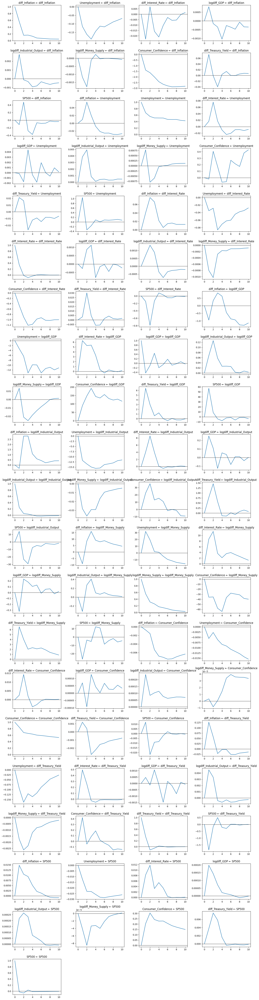

In [ ]:
irf = var_model.irf(10)
responses = var_model.names
impulses = var_model.names

ncols = 4
n_plots = len(responses) * len(impulses)
nrows = (n_plots + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, nrows * 3))
axes = axes.flatten()

plot_idx = 0
for impulse in impulses:
    for response in responses:
        ax = axes[plot_idx]
        data = irf.irfs[:, responses.index(response), impulses.index(impulse)]
        ax.plot(np.arange(len(data)), data, color="C0")
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(f"{response} ← {impulse}")
        plot_idx += 1

for ax in axes[plot_idx:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)


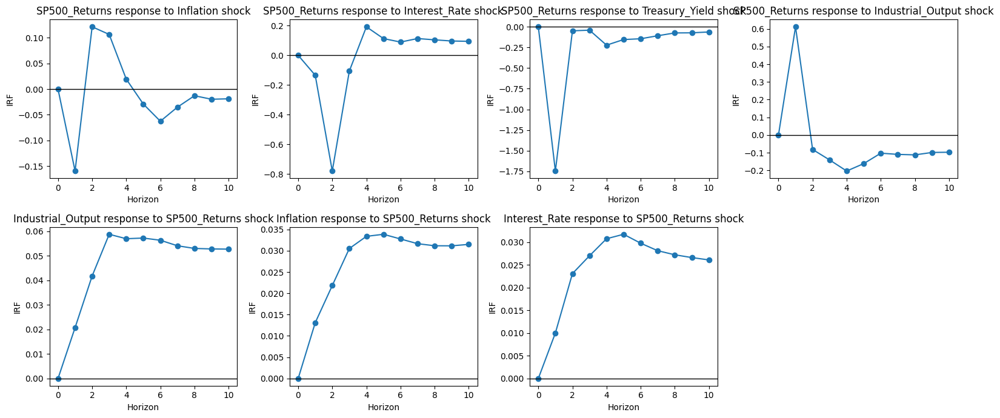

In [ ]:
model = VAR(df)
selected_lag = 3
var_results = model.fit(selected_lag)

pairs_to_plot = [
    ("SP500_Returns", "Inflation"),
    ("SP500_Returns", "Interest_Rate"),
    ("SP500_Returns", "Treasury_Yield"),
    ("SP500_Returns", "Industrial_Output"),
    ("Industrial_Output", "SP500_Returns"),
    ("Inflation", "SP500_Returns"),
    ("Interest_Rate", "SP500_Returns")
]

irf = var_results.irf(10)   # 10 periods

# Extract IRF array: shape is (periods+1, n_variables, n_variables)
irf_array = irf.irfs
horizon = np.arange(irf_array.shape[0])

variables = list(df.columns)

n = len(pairs_to_plot)
rows = 2
cols = (n + 1) // 2  # auto column count

fig, axes = plt.subplots(rows, cols, figsize=(16, 7))
axes = axes.flatten()

for i, (response, shock) in enumerate(pairs_to_plot):
    ax = axes[i]

    resp_index = variables.index(response)
    shock_index = variables.index(shock)

    # Get IRF series
    irf_series = irf_array[:, resp_index, shock_index]

    ax.plot(horizon, irf_series, marker='o')
    ax.axhline(0, color='black', linewidth=1)
    ax.set_title(f"{response} response to {shock} shock")
    ax.set_xlabel("Horizon")
    ax.set_ylabel("IRF")

# Remove unused axes
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


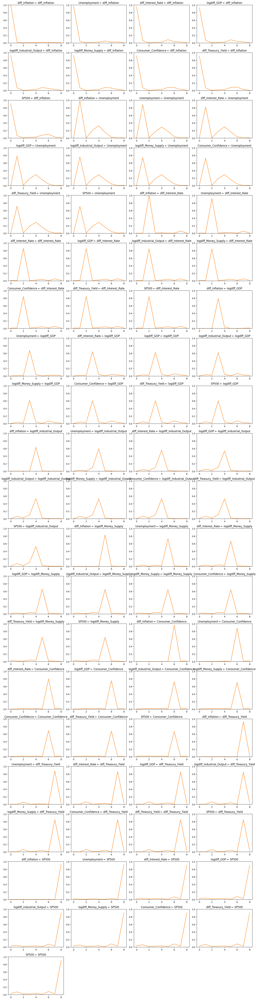

In [ ]:
fevd = var_model.fevd(10)
responses = var_model.names
impulses = var_model.names

ncols = 4
n_plots = len(responses) * len(impulses)
nrows = (n_plots + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, nrows * 3))
axes = axes.flatten()

plot_idx = 0
for impulse in impulses:
    for response in responses:
        ax = axes[plot_idx]
        data = fevd.decomp[:, responses.index(response), impulses.index(impulse)]
        ax.plot(np.arange(len(data)), data, color="C1")
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_ylim(0, 1)
        ax.set_title(f"{response} ← {impulse}")
        plot_idx += 1

for ax in axes[plot_idx:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


In [ ]:
forecast = var_model.forecast(df.values[-3:], steps=12)

forecast_df = pd.DataFrame(
    forecast,
    columns=df.columns,
    index=pd.date_range(start=df.index[-1] + pd.offsets.MonthEnd(), periods=12, freq='M')
)

forecast_df

/tmp/ipython-input-4279233670.py:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index=pd.date_range(start=df.index[-1] + pd.offsets.MonthEnd(), periods=12, freq='M')


,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
2025-10-31,139054.472202,-3.424468e+05,382069.486449,-9280.703134,7641.559186,15873.701697,6.748481e+06,399389.172366,3.454601e+06
2025-11-30,414612.068885,-9.031427e+05,513868.279346,10384.255848,12853.867408,10116.545682,1.041030e+07,314295.130747,6.684582e+05
2025-12-31,453081.014662,-1.307615e+06,539126.126493,13784.064647,8956.435734,6798.603138,1.095516e+07,189720.700784,-3.134270e+05
2026-01-31,374295.524647,-1.402583e+06,341749.823211,-2516.695343,6027.991487,4850.972370,9.553777e+06,146351.728490,-1.339974e+05
2026-02-28,304409.255786,-1.625946e+06,177058.384986,3802.167743,5015.406072,3657.918960,9.698338e+06,90589.480048,-2.615477e+05
2026-03-31,253286.258954,-1.807242e+06,134720.274401,5172.039021,3557.544902,2771.169391,9.684677e+06,69244.839750,-4.822964e+05
2026-04-30,197720.378014,-1.824016e+06,123056.591940,-1375.735371,1755.108359,2136.576107,8.548659e+06,58685.332015,-5.089851e+05
2026-05-31,147324.560462,-1.870937e+06,92265.208754,1055.852465,1020.414309,1690.854884,7.997531e+06,36229.345429,-3.796774e+05
2026-06-30,117577.197672,-1.909070e+06,72303.548832,1534.248901,635.465268,1286.470005,7.553321e+06,31182.154905,-4.326349e+05
2026-07-31,96758.683018,-1.889535e+06,62274.882627,-859.370485,99.704403,986.516186,6.739625e+06,30481.370602,-4.555490e+05


In [ ]:
print("ADF Test Results (Before Transformation):")
adf_results = {}
for col in df.columns:
    result = adfuller(df[col].dropna())
    adf_results[col] = result[1]
    print(f"{col}: p-value = {result[1]:.4f}")

for col in df.columns:
    if (df[col] > 0).all() and adf_results[col] > 0.05:
        df[col] = np.log(df[col])
        print(f"Applied log transform to {col}")

print("\nADF Test Results (After Log Transform):")
for col in df.columns:
    result = adfuller(df[col].dropna())
    print(f"{col}: p-value = {result[1]:.4f}")

for col in df.columns:
    result = adfuller(df[col].dropna())
    if result[1] > 0.05:
        df[col] = df[col].diff().dropna()
        print(f"Differenced {col}")

df = df.dropna()
print("\nStationarity transformation complete.")


ADF Test Results (Before Transformation):
Inflation: p-value = 0.9988
Unemployment: p-value = 0.0101
Interest_Rate: p-value = 0.0418
GDP: p-value = 0.9991
Industrial_Output: p-value = 0.7370
Money_Supply: p-value = 1.0000
Consumer_Confidence: p-value = 0.0360
Treasury_Yield: p-value = 0.6490
SP500_Returns: p-value = 0.0000
Applied log transform to Inflation
Applied log transform to GDP
Applied log transform to Industrial_Output
Applied log transform to Money_Supply
Applied log transform to Treasury_Yield

ADF Test Results (After Log Transform):
Inflation: p-value = 0.5587
Unemployment: p-value = 0.0101
Interest_Rate: p-value = 0.0418
GDP: p-value = 0.1836
Industrial_Output: p-value = 0.1918
Money_Supply: p-value = 0.5225
Consumer_Confidence: p-value = 0.0360
Treasury_Yield: p-value = 0.3134
SP500_Returns: p-value = 0.0000
Differenced Inflation
Differenced GDP
Differenced Industrial_Output
Differenced Money_Supply
Differenced Treasury_Yield

Stationarity transformation complete.


In [ ]:
max_lags = 12
model = VAR(df)

for i in range(1, max_lags + 1):
    result = model.fit(i)
    print(f"Lag Order = {i}")
    print(f"AIC : {result.aic}")
    print(f"BIC : {result.bic}")
    print(f"HQIC: {result.hqic}")
    print("-"*30)


Lag Order = 1
AIC : -47.79725422302766
BIC : -47.26971669471857
HQIC: -47.59458616371581
------------------------------
Lag Order = 2
AIC : -48.2818026225255
BIC : -47.278493637357684
HQIC: -47.896331081365574
------------------------------
Lag Order = 3
AIC : -48.50557619604318
BIC : -47.02555689986359
HQIC: -47.93691879786678
------------------------------
Lag Order = 4
AIC : -48.533750901929764
BIC : -46.57607938322853
HQIC: -47.78152399602891
------------------------------
Lag Order = 5
AIC : -48.53099261888873
BIC : -46.094723895031
HQIC: -47.5948112732009
------------------------------
Lag Order = 6
AIC : -48.563647316416564
BIC : -45.64783331979524
HQIC: -47.44312531167617
------------------------------
Lag Order = 7
AIC : -48.55267332640691
BIC : -45.15636289051577
HQIC: -47.247423150262925
------------------------------
Lag Order = 8
AIC : -48.53576512209875
BIC : -44.65800396752542
HQIC: -47.04539796319827
------------------------------
Lag Order = 9
AIC : -48.56493614828775


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
/tmp/ipython-input-1393963586.py:9: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  forecast_index = pd.date_range(start=df.index[-1] + pd.offsets.MonthEnd(1), periods=12, freq='M')


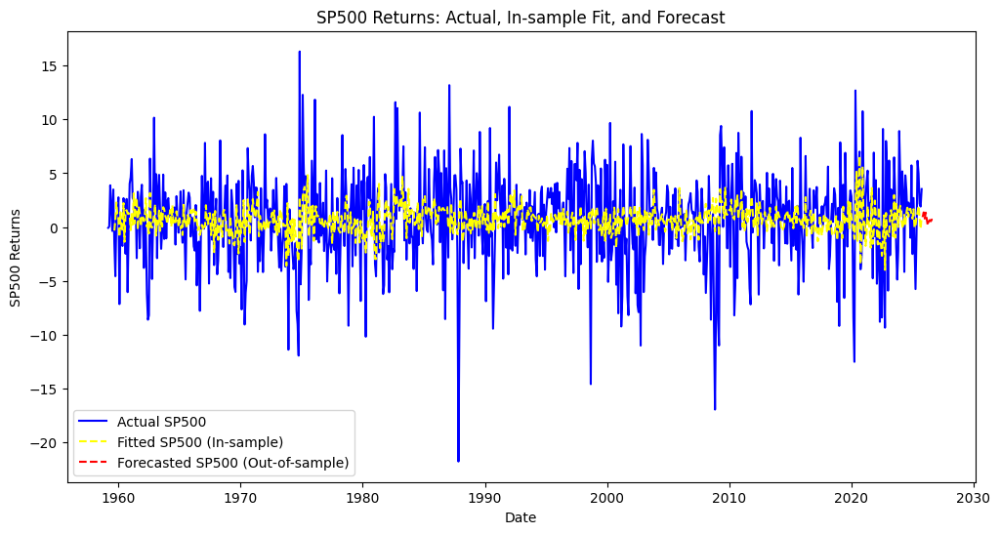

In [ ]:
var_model = VAR(df)
var_results = var_model.fit(maxlags=6)

# In-sample fitted values
in_sample_forecast = var_results.fittedvalues

# Out-of-sample forecast
forecast_array = var_results.forecast(df.values[-var_results.k_ar:], steps=12)
forecast_index = pd.date_range(start=df.index[-1] + pd.offsets.MonthEnd(1), periods=12, freq='M')
forecast_df = pd.DataFrame(forecast_array, index=forecast_index, columns=df.columns)

plt.figure(figsize=(12,6))
plt.plot(df['SP500_Returns'], label='Actual SP500', color='blue')
plt.plot(in_sample_forecast['SP500_Returns'], label='Fitted SP500 (In-sample)', linestyle='--', color='yellow')
plt.plot(forecast_df['SP500_Returns'], label='Forecasted SP500 (Out-of-sample)', linestyle='--', color='red')
plt.title('SP500 Returns: Actual, In-sample Fit, and Forecast')
plt.xlabel('Date')
plt.ylabel('SP500 Returns')
plt.legend()
plt.show()

In [ ]:
# Durbin-Watson test for autocorrelation
out = durbin_watson(var_results.resid)
for col, val in zip(df.columns, out):
    print(f'{col}: {val:.2f}')

# Jarque-Bera test for normality
jb_test = stats.jarque_bera(var_results.resid)
print("\nJarque-Bera Test (Normality):", jb_test)


Inflation: 2.02
Unemployment: 2.00
Interest_Rate: 2.01
GDP: 2.00
Industrial_Output: 2.02
Money_Supply: 2.02
Consumer_Confidence: 1.98
Treasury_Yield: 1.99
SP500_Returns: 2.00

Jarque-Bera Test (Normality): SignificanceResult(statistic=np.float64(81518.26999703482), pvalue=np.float64(0.0))


In [ ]:
stability = var_results.is_stable()
print("VAR model is stable:", stability)
print(var_results.roots)


VAR model is stable: True
[ 3.90854434+3.29500846j  3.90854434-3.29500846j -2.20461014+1.37859369j
 -2.20461014-1.37859369j  0.40775329+1.75008595j  0.40775329-1.75008595j
 -0.87661049+1.53683212j -0.87661049-1.53683212j  1.17040328-1.17849555j
  1.17040328+1.17849555j -1.62683632-0.24873982j -1.62683632+0.24873982j
 -0.78388259-1.36845431j -0.78388259+1.36845431j  1.4676159 -0.40688408j
  1.4676159 +0.40688408j -0.37204435-1.46474864j -0.37204435+1.46474864j
 -1.41305411-0.52987662j -1.41305411+0.52987662j  1.1789297 +0.91851352j
  1.1789297 -0.91851352j  0.95992553+1.09635967j  0.95992553-1.09635967j
 -0.91311809+1.11963975j -0.91311809-1.11963975j -1.43553329-0.j
  0.11974797+1.42960981j  0.11974797-1.42960981j  0.43249611-1.36479909j
  0.43249611+1.36479909j -1.1635183 +0.81654891j -1.1635183 -0.81654891j
  1.22317304+0.64537352j  1.22317304-0.64537352j -0.4045702 +1.31264158j
 -0.4045702 -1.31264158j -1.37148157-0.j         -0.83005749+1.07806076j
 -0.83005749-1.07806076j  0.43926

In [ ]:
print(var_results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 12, Dec, 2025
Time:                     06:28:47
--------------------------------------------------------------------
No. of Equations:         9.00000    BIC:                   -45.6478
Nobs:                     794.000    HQIC:                  -47.4431
Log likelihood:           9635.03    FPE:                8.12727e-22
AIC:                     -48.5636    Det(Omega_mle):     4.44795e-22
--------------------------------------------------------------------
Results for equation Inflation
                            coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------------
const                          0.002778         0.001059            2.622           0.009
L1.Inflation                   0.386326         0.037623           10.268           0.000
L1.Unemployment     

In [ ]:
# In-sample evaluation
rmse_in_sample = {}
mae_in_sample = {}

for col in df.columns:
    rmse_in_sample[col] = np.sqrt(mean_squared_error(df[col][var_results.k_ar:],
                                                     in_sample_forecast[col]))
    mae_in_sample[col] = mean_absolute_error(df[col][var_results.k_ar:],
                                             in_sample_forecast[col])

print("In-sample RMSE:")
for col, val in rmse_in_sample.items():
    print(f"{col}: {val:.4f}")

print("\nIn-sample MAE:")
for col, val in mae_in_sample.items():
    print(f"{col}: {val:.4f}")


In-sample RMSE:
Inflation: 0.0022
Unemployment: 0.3568
Interest_Rate: 0.4177
GDP: 0.0048
Industrial_Output: 0.0081
Money_Supply: 0.0030
Consumer_Confidence: 3.3372
Treasury_Yield: 0.0508
SP500_Returns: 4.0973

In-sample MAE:
Inflation: 0.0016
Unemployment: 0.1850
Interest_Rate: 0.2357
GDP: 0.0031
Industrial_Output: 0.0053
Money_Supply: 0.0020
Consumer_Confidence: 2.5271
Treasury_Yield: 0.0356
SP500_Returns: 3.1301


In [ ]:
# GRANGER TEST

import contextlib
import io

# Create differenced data for Granger tests (recommended for non-stationary data)
df_diff = df.diff().dropna()

# Function to run a quiet Granger test
def granger_test_quiet(data, cause, effect, maxlag=3):
    buf = io.StringIO()
    with contextlib.redirect_stdout(buf):
        result = grangercausalitytests(data[[effect, cause]], maxlag=maxlag, verbose=False)
    # extract p-values from the F-test
    pvals = {lag: result[lag][0]['ssr_ftest'][1] for lag in result.keys()}
    return pvals

# Run Granger tests between all variable pairs
variables = df_diff.columns
granger_matrix = pd.DataFrame(index=variables, columns=variables)

for cause in variables:
    for effect in variables:
        if cause != effect:
            pvals = granger_test_quiet(df_diff, cause, effect, maxlag=3)
            granger_matrix.loc[effect, cause] = min(pvals.values())
        else:
            granger_matrix.loc[effect, cause] = None

print("\nGranger Causality Matrix (minimum p-value across lags):")
display(granger_matrix)



/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul


Granger Causality Matrix (minimum p-value across lags):


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul

,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
Inflation,None,0.095008,0.000322,0.649403,0.633046,0.000101,0.008666,0.000052,0.004314
Unemployment,0.014515,None,0.0079,0.108181,0.000001,0.0,0.005576,0.0,0.041145
Interest_Rate,0.093248,0.075182,None,0.111899,0.195524,0.695856,0.000435,0.004431,0.142686
GDP,0.059531,0.0,0.364984,None,0.0,0.0,0.003201,0.0,0.012952
Industrial_Output,0.006983,0.0,0.006963,0.141207,None,0.0,0.028574,0.0,0.011114
Money_Supply,0.0,0.0,0.00001,0.004045,0.0,None,0.195757,0.0,0.112518
Consumer_Confidence,0.054485,0.308361,0.012422,0.000032,0.1169,0.44011,None,0.087983,0.0
Treasury_Yield,0.001013,0.0,0.000651,0.211131,0.00016,0.000011,0.255862,None,0.000329
SP500_Returns,0.021815,0.026753,0.02782,0.578273,0.720419,0.787759,0.000002,0.020599,None


* The VAR model was estimated on differenced macroeconomic variables to focus on short-run dynamics, ensuring all series were stationary.

* Lag order 3 was chosen after comparing AIC, BIC, HQIC, and FPE criteria, balancing model complexity with meaningful interactions.

* The estimation captured system-level interactions, showing strong feedback between Industrial Production and Employment, while some relationships, such as Inflation’s effect on real activity, were relatively muted.

* Granger causality tests revealed that variables like Industrial Production, Unemployment, Money Supply, and Treasury Yield had significant predictive power, whereas SP500 Returns were primarily influenced by Consumer Confidence and Treasury Yield.

* Diagnostic checks confirmed the model’s stability, with no major serial correlation issues and all characteristic roots within the unit circle, validating the use of IRFs and variance decomposition.

* Impulse Response Functions illustrated intuitive responses: positive shocks to Industrial Production increased Employment, Inflation shocks raised Interest Rates, and Interest Rate shocks slightly dampened real activity.

* Forecast Error Variance Decomposition highlighted that most variation in Industrial Production and Employment was explained by their own shocks, whereas Inflation was notably affected by Interest Rate movements, emphasizing the short-run influence of monetary policy.

### VECM Model

In [ ]:
csv_path = "macro_data_cleaned.csv"

In [ ]:
df = pd.read_csv(csv_path, parse_dates=['Date'], index_col='Date')

In [ ]:
df.head()

,Inflation,Unemployment,Interest_Rate,GDP,Industrial_Output,Money_Supply,Consumer_Confidence,Treasury_Yield,SP500_Returns
Date,,,,,,,,,
1959-01-31,29.01,6.0,2.48,3352.129,21.9616,286.6,90.8,4.02,0.434707
1959-02-28,29.00,5.9,2.43,3352.129,22.3917,287.7,90.8,3.96,-0.072139
1959-03-31,28.97,5.6,2.80,3352.129,22.7142,289.2,90.8,3.99,0.054140
1959-04-30,28.98,5.2,2.96,3427.667,23.1981,290.1,90.8,4.12,3.878069
1959-05-31,29.04,5.1,2.90,3427.667,23.5476,292.2,95.3,4.31,1.892690


In [ ]:
df = df.sort_index()
df = df.asfreq('M')

/tmp/ipython-input-1345135640.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.asfreq('M')


In [ ]:
print("Date range:", df.index.min().strftime("%Y-%m-%d"), "to", df.index.max().strftime("%Y-%m-%d"))
print("Shape:", df.shape)
print(df.head())

Date range: 1959-01-31 to 2025-09-30
Shape: (801, 9)
            Inflation  Unemployment  Interest_Rate       GDP  \
Date                                                           
1959-01-31      29.01           6.0           2.48  3352.129   
1959-02-28      29.00           5.9           2.43  3352.129   
1959-03-31      28.97           5.6           2.80  3352.129   
1959-04-30      28.98           5.2           2.96  3427.667   
1959-05-31      29.04           5.1           2.90  3427.667   

            Industrial_Output  Money_Supply  Consumer_Confidence  \
Date                                                               
1959-01-31            21.9616         286.6                 90.8   
1959-02-28            22.3917         287.7                 90.8   
1959-03-31            22.7142         289.2                 90.8   
1959-04-30            23.1981         290.1                 90.8   
1959-05-31            23.5476         292.2                 95.3   

            Treasury_

In [ ]:
print("\nMissing values per column:")
print(df.isna().sum())


Missing values per column:
Inflation              0
Unemployment           0
Interest_Rate          0
GDP                    0
Industrial_Output      0
Money_Supply           0
Consumer_Confidence    0
Treasury_Yield         0
SP500_Returns          0
dtype: int64


In [ ]:
# Function to check if a series is I(1) (non-stationary in level)
def is_nonstationary(series, alpha=0.05):
    result = adfuller(series, autolag='AIC')
    p_value = result[1]
    return p_value > alpha  # True if non-stationary (do not reject that it is non stationary)

log_candidates = []

In [ ]:
for col in df.columns:
    if (df[col] > 0).all():
        if is_nonstationary(df[col]):
            log_candidates.append(col)

print("Columns suggested for log-transform:", log_candidates)

Columns suggested for log-transform: ['Inflation', 'GDP', 'Industrial_Output', 'Money_Supply', 'Treasury_Yield']


In [ ]:
def adf_summary(series, col_name):
    result = adfuller(series, autolag='AIC')
    p_value = result[1]
    stationary = p_value < 0.05
    print(f"{col_name:20s} | p-value: {p_value:.4f} | Stationary: {stationary}")
    return stationary

In [ ]:
print("=== Log-transformed variables ===")
for col in log_candidates:
    df[f'log_{col}'] = np.log(df[col])
    adf_summary(df[f'log_{col}'], f"log_{col}")

=== Log-transformed variables ===
log_Inflation        | p-value: 0.5587 | Stationary: False
log_GDP              | p-value: 0.1836 | Stationary: False
log_Industrial_Output | p-value: 0.1918 | Stationary: False
log_Money_Supply     | p-value: 0.5225 | Stationary: False
log_Treasury_Yield   | p-value: 0.3134 | Stationary: False


In [ ]:
print("\n=== Level variables ===")
level_vars = [c for c in df.columns if c not in log_candidates and c not in [f"log_{v}" for v in log_candidates]]
for col in level_vars:
    adf_summary(df[col], col)


=== Level variables ===
Unemployment         | p-value: 0.0101 | Stationary: True
Interest_Rate        | p-value: 0.0418 | Stationary: True
Consumer_Confidence  | p-value: 0.0360 | Stationary: True
SP500_Returns        | p-value: 0.0000 | Stationary: True


In [ ]:
johansen_data = df[['log_Inflation', 'log_GDP', 'log_Industrial_Output', 'log_Money_Supply', 'log_Treasury_Yield']]

# Johansen Test
# det_order=0 means no deterministic trend, can change to -1 for automatic selection
# k_ar_diff = lag order for differences (we can start with 1, will tune later)
johansen_test = coint_johansen(johansen_data, det_order=0, k_ar_diff=1)

In [ ]:
beta = johansen_test.evec[:, 0]   # first cointegrating vector
print(beta)

[  8.67261946  27.39234017 -17.5848318  -10.93903653  -0.70371527]


In [ ]:
beta_normalized = beta / beta[johansen_data.columns.get_loc('log_GDP')]

In [ ]:
print(beta_normalized)

[ 0.31660747  1.         -0.64196165 -0.39934655 -0.02569022]


In [ ]:
# Summary of test statistics
print("Eigenvalues:\n", johansen_test.eig)
print("\nTrace Statistic:", johansen_test.lr1)  # Trace statistic
print("Critical Values (90%, 95%, 99%):\n", johansen_test.cvt)

Eigenvalues:
 [0.12328181 0.0501679  0.01320278 0.00600993 0.00085116]

Trace Statistic: [162.36480223  57.24063674  16.11606932   5.49679021   0.68036662]
Critical Values (90%, 95%, 99%):
 [[65.8202 69.8189 77.8202]
 [44.4929 47.8545 54.6815]
 [27.0669 29.7961 35.4628]
 [13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]]


In [ ]:
# Use only I(1) variables for lag selection
vecm_vars = df[['log_Inflation', 'log_GDP', 'log_Industrial_Output', 'log_Money_Supply', 'log_Treasury_Yield']]


In [ ]:
# Fitting VAR to determine optimal lag order
model_var = VAR(vecm_vars)
lag_order_results = model_var.select_order(maxlags=12)
print(lag_order_results.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -17.55      -17.52   2.391e-08      -17.54
1       -48.13      -47.95   1.257e-21      -48.06
2       -49.28      -48.95   3.973e-22      -49.15
3       -49.57     -49.10*   2.965e-22      -49.39
4       -49.67      -49.05   2.681e-22     -49.43*
5       -49.69      -48.92   2.639e-22      -49.39
6       -49.71      -48.79   2.575e-22      -49.36
7       -49.75      -48.68   2.480e-22      -49.34
8       -49.73      -48.51   2.540e-22      -49.26
9       -49.74      -48.37   2.514e-22      -49.21
10      -49.76      -48.25   2.453e-22      -49.18
11      -49.78      -48.12   2.415e-22      -49.14
12     -49.79*      -47.98  2.391e-22*      -49.09
--------------------------------------------------


* Information criteria suggested different optimal lags: AIC and FPE favored longer lags (12), while BIC and HQIC favored shorter lags (3–4).

* Longer lags (AIC/FPE) risk overfitting, whereas shorter lags (BIC/HQIC) provide more parsimonious models.

* A moderate lag of 3–4 is a practical starting point for the VAR model to balance fit and simplicity.

* For the VECM, lag = 2 is used, with the option to experiment later to check result stability.

In [ ]:
vecm_data = df[['log_Inflation', 'log_GDP', 'log_Industrial_Output', 'log_Money_Supply', 'log_Treasury_Yield',
                'SP500_Returns', 'Unemployment', 'Interest_Rate', 'Consumer_Confidence']]

In [ ]:
# Fit VECM
vecm = VECM(endog=vecm_data, k_ar_diff=2, coint_rank=2, deterministic="ci")  # ci = constant in cointegration
vecm_res = vecm.fit()

In [ ]:
print(vecm_res.summary())

Det. terms outside the coint. relation & lagged endog. parameters for equation log_Inflation
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
L1.log_Inflation             0.4321      0.036     12.032      0.000       0.362       0.502
L1.log_GDP                  -0.0089      0.014     -0.627      0.531      -0.037       0.019
L1.log_Industrial_Output    -0.0174      0.011     -1.553      0.120      -0.039       0.005
L1.log_Money_Supply         -0.0514      0.027     -1.898      0.058      -0.105       0.002
L1.log_Treasury_Yield        0.0057      0.002      3.584      0.000       0.003       0.009
L1.SP500_Returns          4.125e-06   2.95e-05      0.140      0.889   -5.36e-05    6.19e-05
L1.Unemployment           3.918e-05      0.000      0.142      0.887      -0.001       0.001
L1.Interest_Rate             0.0005      0.000      2.716      0.007  

In [ ]:
resid = vecm_res.resid
# Autocorrelation: Ljung-Box
lb_tests = []

for i in range(resid.shape[1]):
    lb = acorr_ljungbox(resid[:, i], lags=[10], return_df=True)
    lb['variable'] = vecm_data.columns[i]  # optional: add variable name
    lb_tests.append(lb)

lb_test_df = pd.concat(lb_tests)
print(lb_test_df)

# Normality: Jarque-Bera

jb_test_list = []
for i in range(resid.shape[1]):
    series = resid[:, i]
    jb_stat, jb_pvalue = jarque_bera(series)
    s = skew(series)
    k = kurtosis(series)
    jb_test_list.append([vecm_data.columns[i], jb_stat, jb_pvalue, s, k])

jb_test_df = pd.DataFrame(jb_test_list, columns=['variable', 'JB_stat', 'JB_pvalue', 'skew', 'kurtosis'])
print(jb_test_df)

# Stability
var_model = VAR(vecm_data)
var_res = var_model.fit(maxlags=vecm.k_ar_diff)

k = var_res.neqs  # number of endogenous variables
p = var_res.k_ar  # number of lags

comp_matrix = np.zeros((k * p, k * p))
comp_matrix[:k, :] = np.hstack(var_res.coefs)  # top row: VAR coefficients
if p > 1:
    comp_matrix[k:, :-k] = np.eye(k * (p - 1))  # identity blocks for lagged variables

eigvals = np.linalg.eigvals(comp_matrix)

is_stable = np.all(np.abs(eigvals) < 1)

print("Eigenvalues of the VAR system:", eigvals)
print("Is the system stable?", is_stable)

      lb_stat     lb_pvalue               variable
10  34.127654  1.757234e-04          log_Inflation
10  69.594560  5.309195e-11                log_GDP
10  17.118649  7.177946e-02  log_Industrial_Output
10  41.435318  9.447521e-06       log_Money_Supply
10   7.815712  6.468324e-01     log_Treasury_Yield
10   7.744452  6.537825e-01          SP500_Returns
10  16.958003  7.529844e-02           Unemployment
10  57.051197  1.303742e-08          Interest_Rate
10  31.009742  5.845559e-04    Consumer_Confidence
                variable       JB_stat      JB_pvalue       skew    kurtosis
0          log_Inflation  5.420908e+02  1.934124e-118  -0.033821    4.037190
1                log_GDP  6.852852e+03   0.000000e+00  -0.782919   14.270563
2  log_Industrial_Output  2.785707e+04   0.000000e+00  -2.017296   28.662324
3       log_Money_Supply  1.369762e+04   0.000000e+00   1.690711   20.013108
4     log_Treasury_Yield  3.561090e+03   0.000000e+00  -0.858796   10.205407
5          SP500_Returns  8.

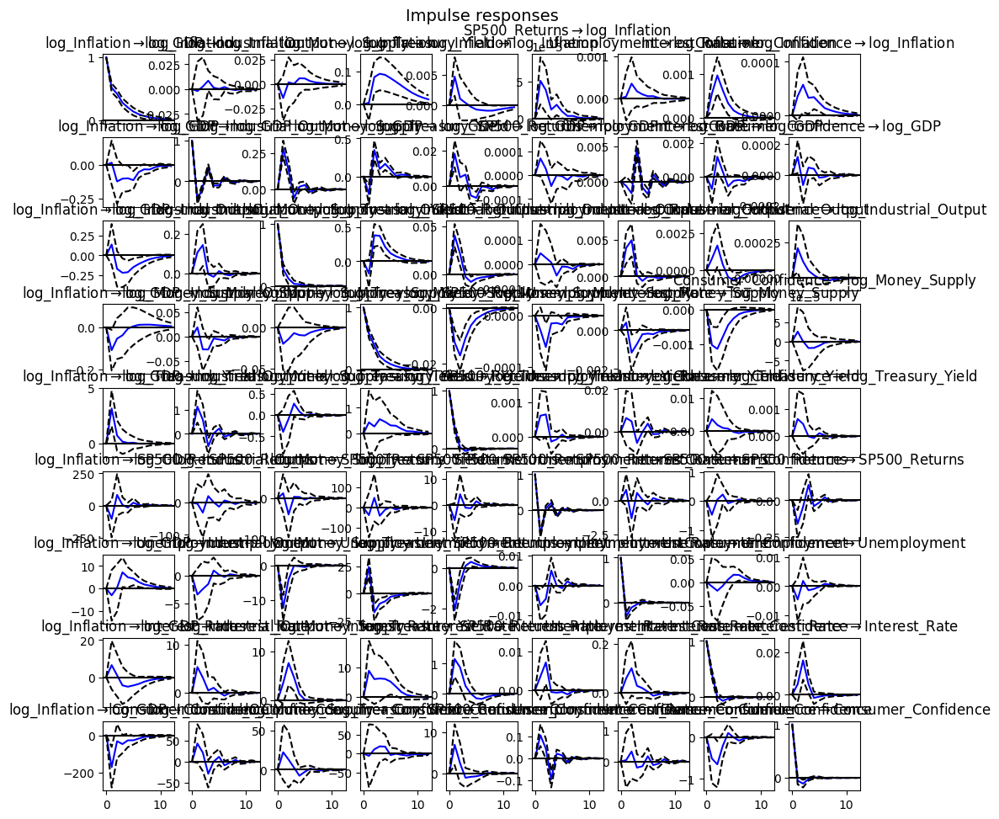

FEVD for log_Inflation
      log_Inflation   log_GDP  log_Industrial_Output  log_Money_Supply  log_Treasury_Yield  SP500_Returns  Unemployment  Interest_Rate  Consumer_Confidence
0          1.000000  0.000000               0.000000          0.000000            0.000000       0.000000      0.000000       0.000000             0.000000
1          0.970671  0.000243               0.000860          0.000521            0.010201       0.007449      0.000052       0.007772             0.002231
2          0.936765  0.000591               0.000886          0.006385            0.010193       0.009787      0.001516       0.027154             0.006722
3          0.921897  0.000575               0.001050          0.014099            0.009917       0.009384      0.001775       0.033548             0.007756
4          0.912334  0.000593               0.001024          0.021229            0.009587       0.009817      0.001799       0.034586             0.009031
5          0.905941  0.000620            

In [ ]:
var_res = vecm.fit()

vecm_diff = vecm_data.diff().dropna()  # first differences
var_model = VAR(vecm_diff)
var_res = var_model.fit(maxlags=2)

# Impulse Response Function (IRF)
irf = var_res.irf(12)  # horizon=12 months
irf.plot(orth=False)   # orthogonalized=False
plt.show()

# To get numerical values
irf_values = irf.irfs  # shape: (horizon+1, n_variables, n_variables)

# Forecast Error Variance Decomposition (FEVD)
fevd = var_res.fevd(12)  # horizon=12
fevd_summary = fevd.summary()  # textual summary
print(fevd_summary)

# FEVD values
fevd_values = fevd.decomp

In [ ]:
variables = var_res.names


In [ ]:
shock_infl = variables.index('log_Inflation')
shock_rate = variables.index('log_Treasury_Yield')
shock_indust = variables.index('log_Industrial_Output')
shock_spx = variables.index('SP500_Returns')
shock_intr = variables.index('Interest_Rate')

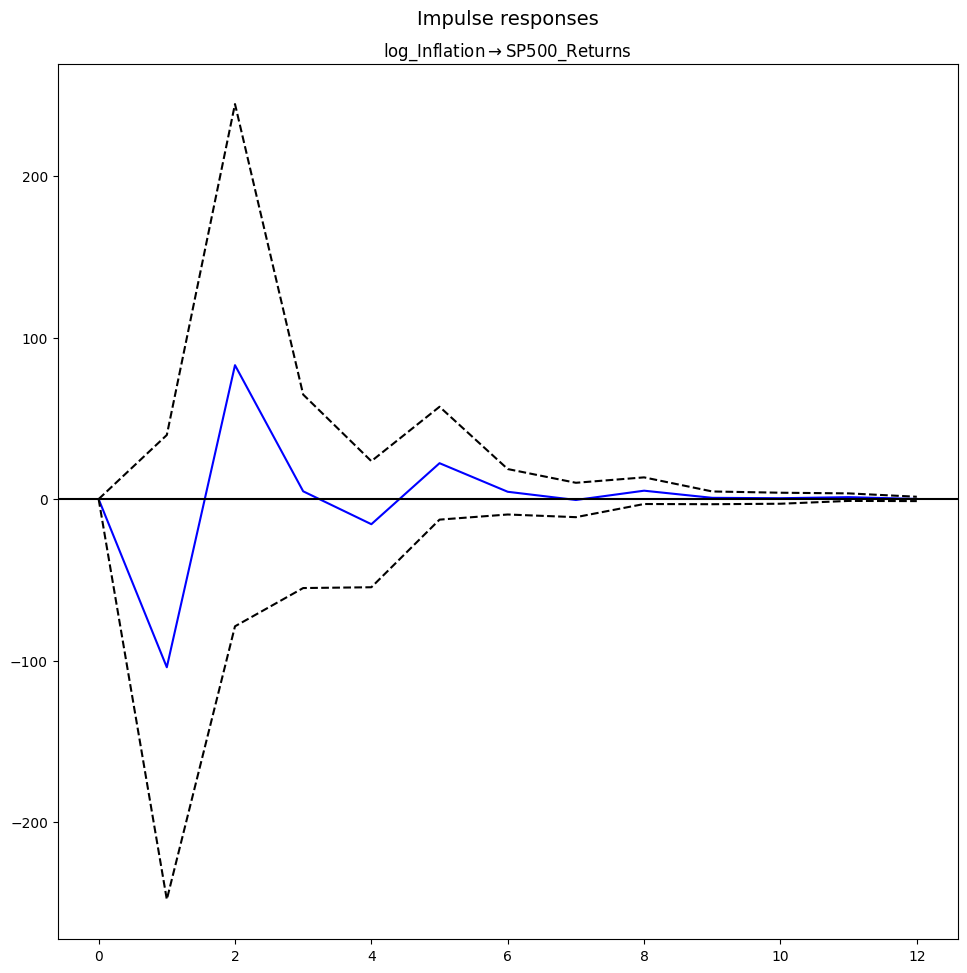

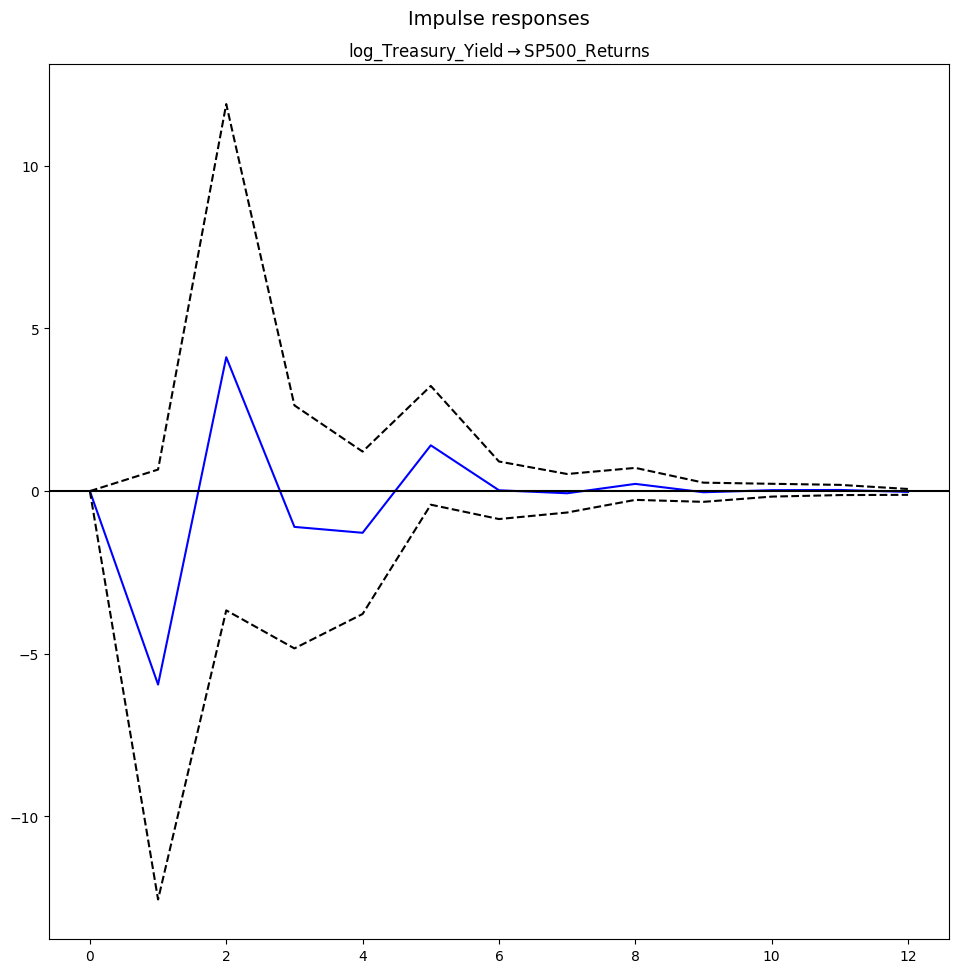

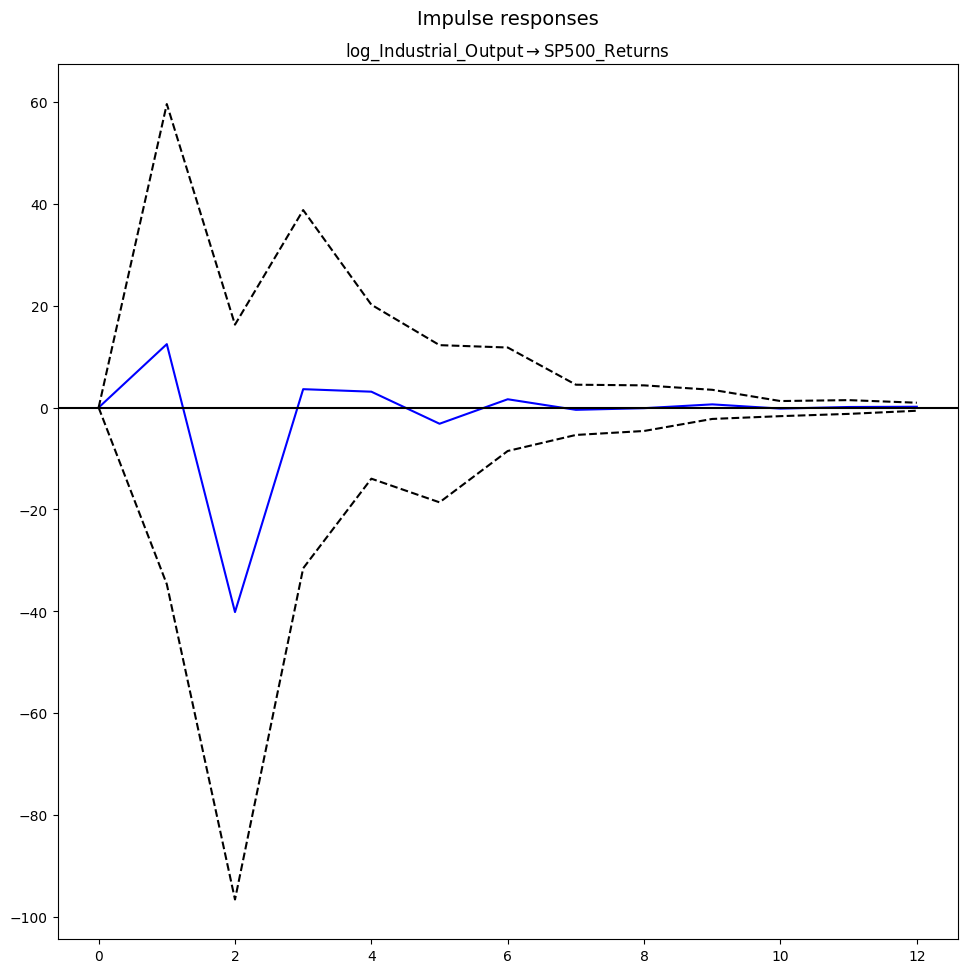

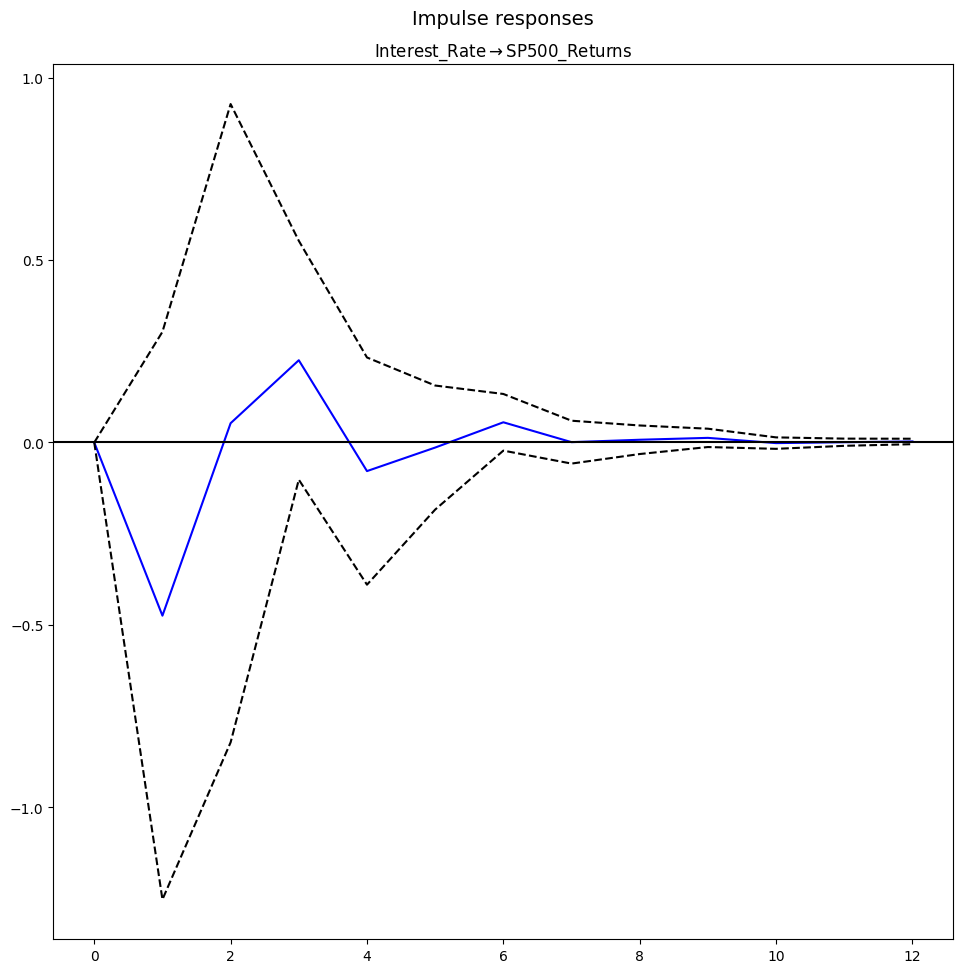

In [ ]:
irf.plot(response='SP500_Returns', impulse='log_Inflation')
plt.show()

irf.plot(response='SP500_Returns', impulse='log_Treasury_Yield')
plt.show()

irf.plot(response='SP500_Returns', impulse='log_Industrial_Output')
plt.show()

irf.plot(response='SP500_Returns', impulse='Interest_Rate')
plt.show()

In [ ]:
fevd.decomp.shape

(9, 12, 9)

In [ ]:
max_h = fevd.decomp.shape[0] - 1
print(max_h)

8


In [ ]:
spx_idx = variables.index('SP500_Returns')
fevd_1  = fevd.decomp[1, spx_idx]     # horizon 1
fevd_6  = fevd.decomp[6, spx_idx]     # horizon 6
fevd_8 = fevd.decomp[8, spx_idx]    # horizon 12

In [ ]:
print("\nFEVD Horizon 1:")
for var, val in zip(variables, fevd_1):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 6:")
for var, val in zip(variables, fevd_6):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 8 (proxy for 12 months):")
for var, val in zip(variables, fevd_8):
    print(f"{var}: {val:.4f}")


FEVD Horizon 1:
log_Inflation: 0.0066
log_GDP: 0.6590
log_Industrial_Output: 0.1933
log_Money_Supply: 0.0498
log_Treasury_Yield: 0.0260
SP500_Returns: 0.0027
Unemployment: 0.0485
Interest_Rate: 0.0085
Consumer_Confidence: 0.0057

FEVD Horizon 6:
log_Inflation: 0.0081
log_GDP: 0.1704
log_Industrial_Output: 0.1596
log_Money_Supply: 0.0867
log_Treasury_Yield: 0.0677
SP500_Returns: 0.0213
Unemployment: 0.4836
Interest_Rate: 0.0007
Consumer_Confidence: 0.0019

FEVD Horizon 8 (proxy for 12 months):
log_Inflation: 0.0139
log_GDP: 0.0217
log_Industrial_Output: 0.0030
log_Money_Supply: 0.0127
log_Treasury_Yield: 0.0215
SP500_Returns: 0.0387
Unemployment: 0.0041
Interest_Rate: 0.0104
Consumer_Confidence: 0.8740


In [ ]:
def highlight_major_contributors(fevd_values, variables):
    max_idx = fevd_values.argmax()
    return variables[max_idx], fevd_values[max_idx]

print("\nMajor Contributor at Horizon 1:", highlight_major_contributors(fevd_1, variables))
print("Major Contributor at Horizon 6:", highlight_major_contributors(fevd_6, variables))
print("Major Contributor at Horizon 8:", highlight_major_contributors(fevd_8, variables))


Major Contributor at Horizon 1: ('log_GDP', np.float64(0.6589510743442981))
Major Contributor at Horizon 6: ('Unemployment', np.float64(0.48360486292736626))
Major Contributor at Horizon 8: ('Consumer_Confidence', np.float64(0.8740125349561241))


**Experimenting with different Lag values**

In [ ]:
vecm3 = VECM(endog=vecm_data, k_ar_diff=3, coint_rank=2, deterministic="ci")
vecm_res3 = vecm3.fit()
print(vecm_res3.summary())

Det. terms outside the coint. relation & lagged endog. parameters for equation log_Inflation
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
L1.log_Inflation             0.3888      0.036     10.767      0.000       0.318       0.460
L1.log_GDP                   0.0096      0.016      0.586      0.558      -0.022       0.042
L1.log_Industrial_Output    -0.0013      0.011     -0.111      0.911      -0.024       0.021
L1.log_Money_Supply         -0.0048      0.026     -0.189      0.850      -0.055       0.045
L1.log_Treasury_Yield        0.0061      0.002      3.939      0.000       0.003       0.009
L1.SP500_Returns         -9.373e-06   3.73e-05     -0.251      0.801   -8.24e-05    6.37e-05
L1.Unemployment              0.0004      0.000      1.598      0.110      -0.000       0.001
L1.Interest_Rate             0.0005      0.000      2.583      0.010  

In [ ]:
# Residuals
resid3 = vecm_res3.resid

# Ljung-Box
lb_tests3 = []
for i in range(resid3.shape[1]):
    lb = acorr_ljungbox(resid3[:, i], lags=[10], return_df=True)
    lb['variable'] = vecm_data.columns[i]
    lb_tests3.append(lb)
lb_test_df3 = pd.concat(lb_tests3)
print(lb_test_df3)

# Jarque-Bera
jb_test_list3 = []
for i in range(resid3.shape[1]):
    series = resid3[:, i]
    jb_stat, jb_pvalue = jarque_bera(series)
    s = skew(series)
    k = kurtosis(series)
    jb_test_list3.append([vecm_data.columns[i], jb_stat, jb_pvalue, s, k])
jb_test_df3 = pd.DataFrame(jb_test_list3, columns=['variable', 'JB_stat', 'JB_pvalue', 'skew', 'kurtosis'])
print(jb_test_df3)

# Stability
var_model3 = VAR(vecm_data)
var_res3 = var_model3.fit(maxlags=vecm3.k_ar_diff)

k = var_res3.neqs
p = var_res3.k_ar
comp_matrix3 = np.zeros((k * p, k * p))
comp_matrix3[:k, :] = np.hstack(var_res3.coefs)
if p > 1:
    comp_matrix3[k:, :-k] = np.eye(k * (p - 1))
eigvals3 = np.linalg.eigvals(comp_matrix3)
is_stable3 = np.all(np.abs(eigvals3) < 1)
print("Eigenvalues:", eigvals3)
print("Is stable?", is_stable3)


      lb_stat     lb_pvalue               variable
10  10.608535  3.888183e-01          log_Inflation
10  46.897977  9.854843e-07                log_GDP
10  17.043753  7.340142e-02  log_Industrial_Output
10  42.509906  6.083357e-06       log_Money_Supply
10   6.100153  8.067798e-01     log_Treasury_Yield
10   9.448261  4.901546e-01          SP500_Returns
10  10.921370  3.636768e-01           Unemployment
10  56.710529  1.510611e-08          Interest_Rate
10  26.026584  3.704595e-03    Consumer_Confidence
                variable       JB_stat      JB_pvalue       skew    kurtosis
0          log_Inflation  7.188539e+02  7.995743e-157  -0.330302    4.605474
1                log_GDP  1.105168e+04   0.000000e+00  -1.096027   18.110583
2  log_Industrial_Output  3.276504e+04   0.000000e+00  -2.266585   31.082174
3       log_Money_Supply  1.252447e+04   0.000000e+00   1.437161   19.206420
4     log_Treasury_Yield  3.802622e+03   0.000000e+00  -0.920910   10.541146
5          SP500_Returns  7.

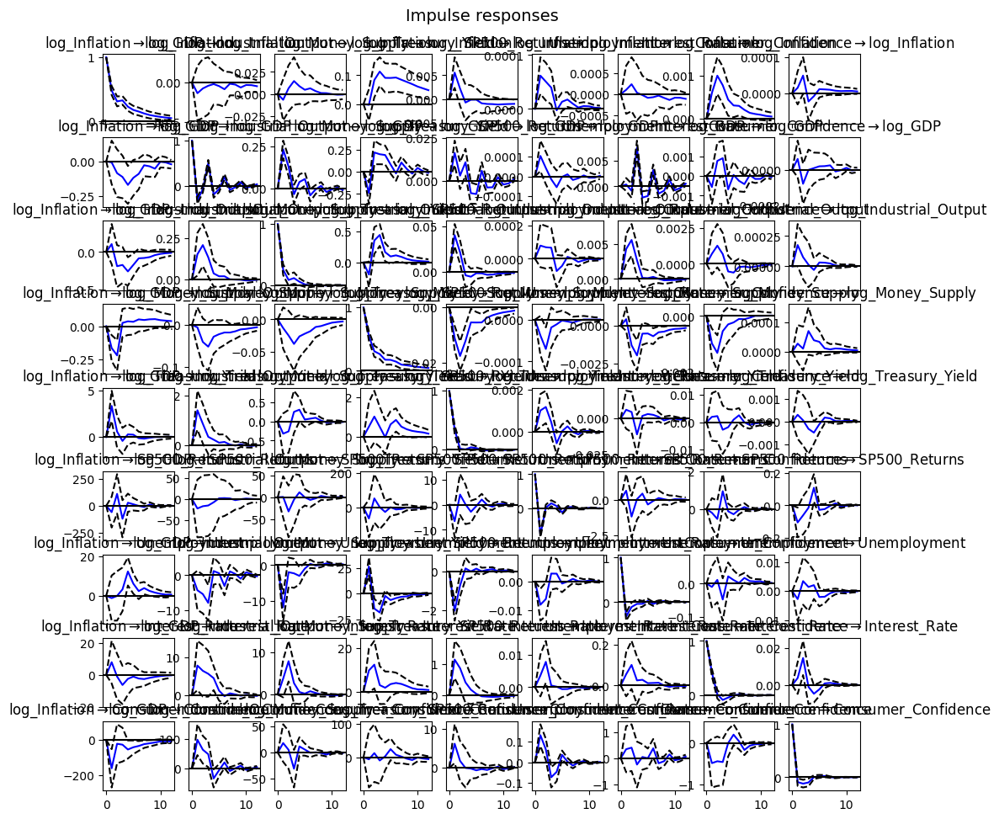

FEVD for log_Inflation
      log_Inflation   log_GDP  log_Industrial_Output  log_Money_Supply  log_Treasury_Yield  SP500_Returns  Unemployment  Interest_Rate  Consumer_Confidence
0          1.000000  0.000000               0.000000          0.000000            0.000000       0.000000      0.000000       0.000000             0.000000
1          0.963610  0.001047               0.000042          0.000856            0.013378       0.010892      0.000231       0.009541             0.000404
2          0.922886  0.001655               0.000127          0.006296            0.015499       0.016004      0.001027       0.032383             0.004122
3          0.899281  0.001663               0.000643          0.019346            0.014074       0.017342      0.001056       0.042141             0.004455
4          0.890931  0.001634               0.000810          0.026755            0.013485       0.016690      0.001014       0.044330             0.004351
5          0.884051  0.001681            

In [ ]:
# VAR on differences for IRF/FEVD
vecm_diff3 = vecm_data.diff().dropna()
var_model_diff3 = VAR(vecm_diff3)
var_res_diff3 = var_model_diff3.fit(maxlags=3)

# IRF
irf3 = var_res_diff3.irf(12)
irf3.plot(orth=False)
plt.show()

# FEVD
fevd3 = var_res_diff3.fevd(12)
print(fevd3.summary())


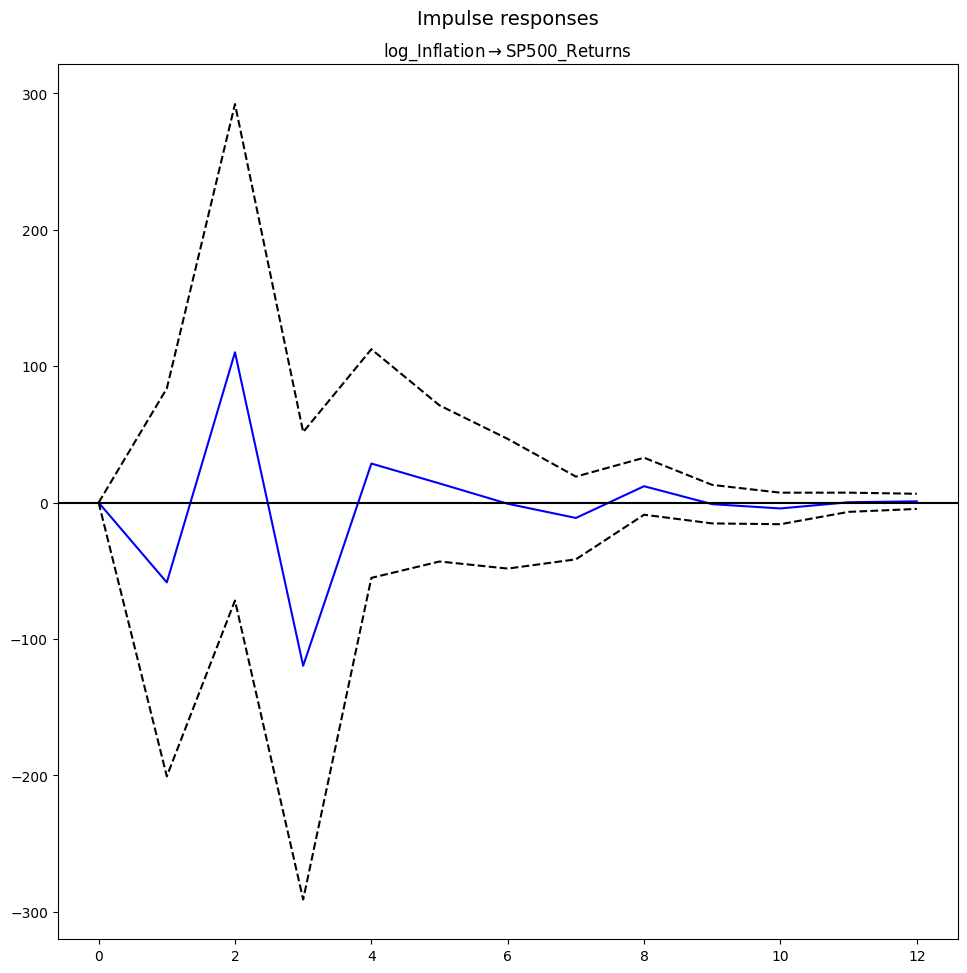

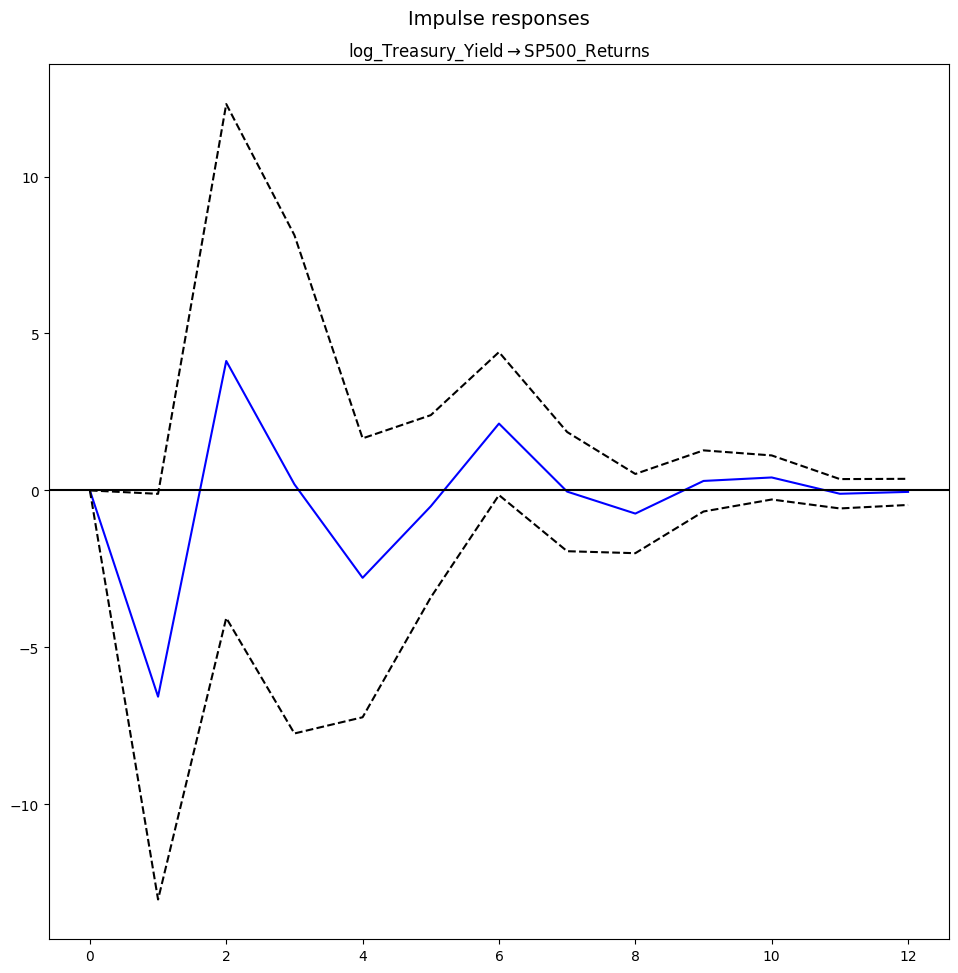

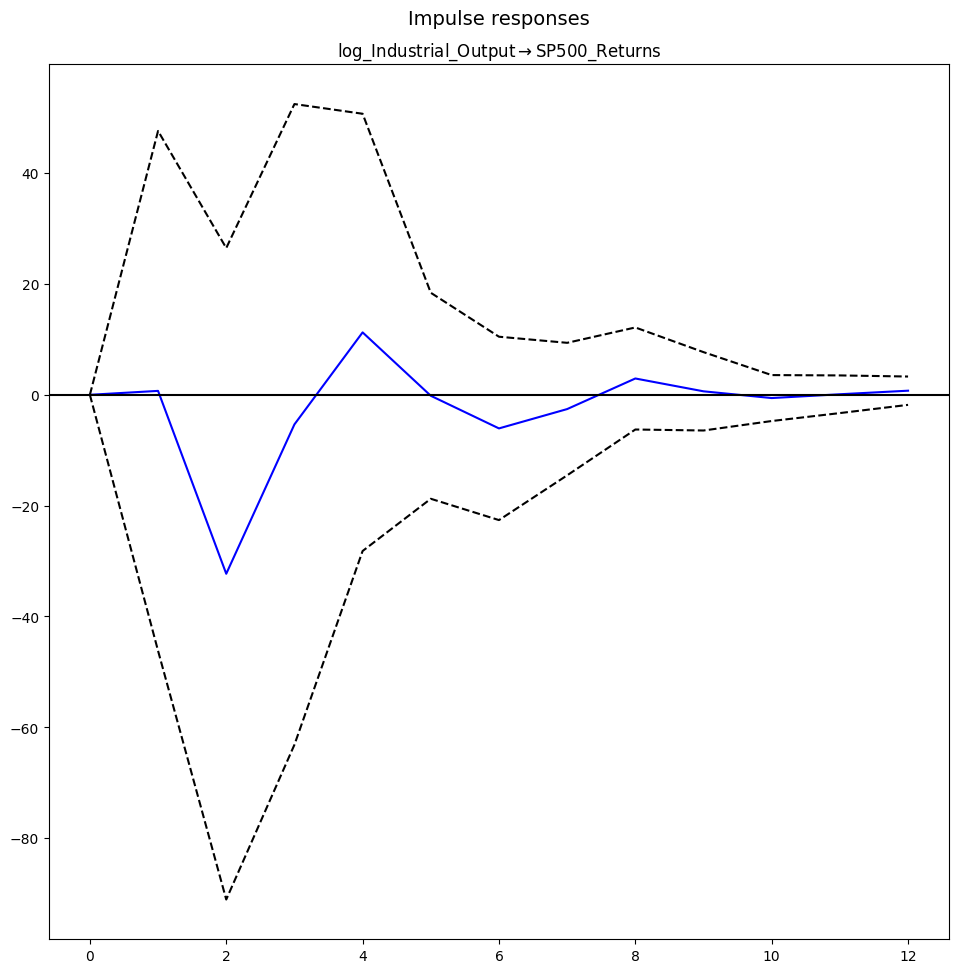

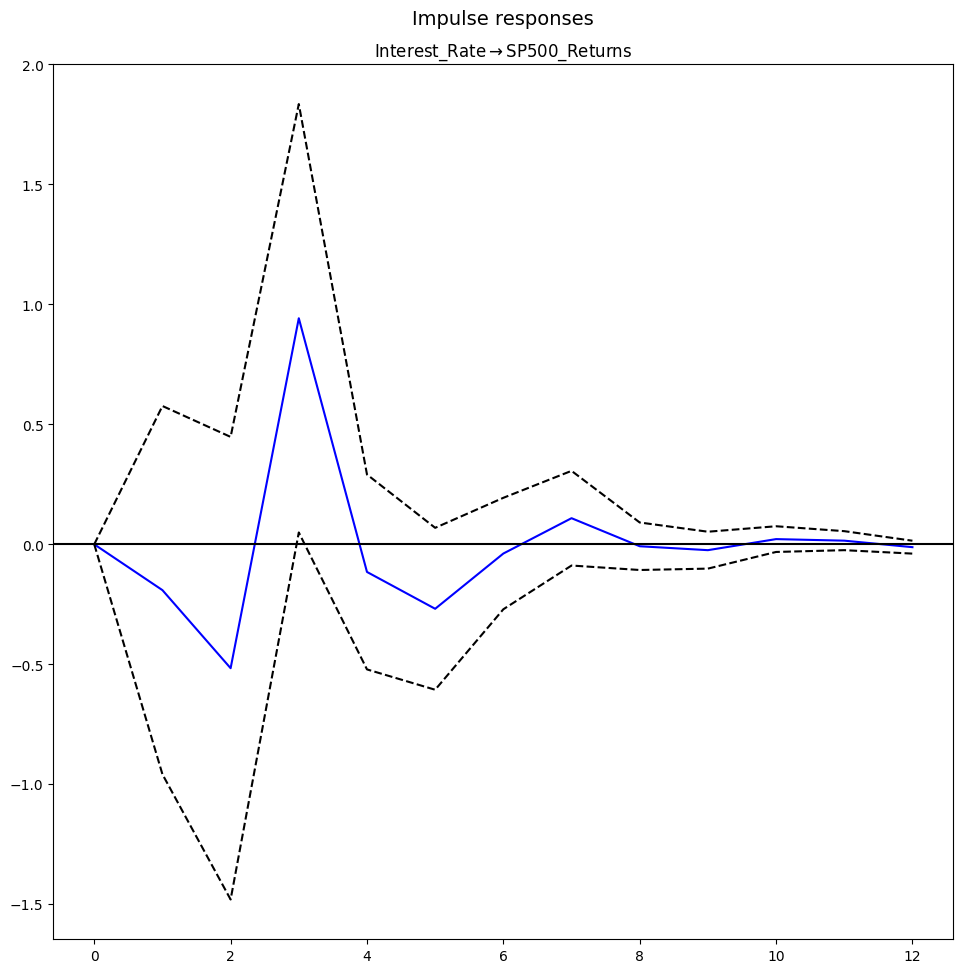

In [ ]:
variables3 = var_res_diff3.names

# Shock indices
shock_infl3 = variables3.index('log_Inflation')
shock_rate3 = variables3.index('log_Treasury_Yield')
shock_indust3 = variables3.index('log_Industrial_Output')
shock_spx3 = variables3.index('SP500_Returns')
shock_intr3 = variables3.index('Interest_Rate')

# IRF Plots for SP500_Returns
irf3.plot(response='SP500_Returns', impulse='log_Inflation')
plt.show()
irf3.plot(response='SP500_Returns', impulse='log_Treasury_Yield')
plt.show()
irf3.plot(response='SP500_Returns', impulse='log_Industrial_Output')
plt.show()
irf3.plot(response='SP500_Returns', impulse='Interest_Rate')
plt.show()

In [ ]:
# FEVD
max_h3 = fevd3.decomp.shape[0] - 1
print("Max horizon:", max_h3)

Max horizon: 8


In [ ]:
spx_idx3 = variables3.index('SP500_Returns')
fevd_1_3  = fevd3.decomp[1, spx_idx3]
fevd_6_3  = fevd3.decomp[6, spx_idx3]
fevd_8_3 = fevd3.decomp[8, spx_idx3]

print("\nFEVD Horizon 1:")
for var, val in zip(variables3, fevd_1_3):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 6:")
for var, val in zip(variables3, fevd_6_3):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 8:")
for var, val in zip(variables3, fevd_8_3):
    print(f"{var}: {val:.4f}")


FEVD Horizon 1:
log_Inflation: 0.0095
log_GDP: 0.6095
log_Industrial_Output: 0.1645
log_Money_Supply: 0.0561
log_Treasury_Yield: 0.0278
SP500_Returns: 0.0087
Unemployment: 0.1129
Interest_Rate: 0.0083
Consumer_Confidence: 0.0027

FEVD Horizon 6:
log_Inflation: 0.0096
log_GDP: 0.1712
log_Industrial_Output: 0.1529
log_Money_Supply: 0.1038
log_Treasury_Yield: 0.0624
SP500_Returns: 0.0266
Unemployment: 0.4684
Interest_Rate: 0.0030
Consumer_Confidence: 0.0019

FEVD Horizon 8:
log_Inflation: 0.0140
log_GDP: 0.0319
log_Industrial_Output: 0.0064
log_Money_Supply: 0.0123
log_Treasury_Yield: 0.0153
SP500_Returns: 0.0478
Unemployment: 0.0050
Interest_Rate: 0.0093
Consumer_Confidence: 0.8580


In [ ]:
def highlight_major_contributors(fevd_values, variables):
    max_idx = fevd_values.argmax()
    return variables[max_idx], fevd_values[max_idx]

print("\nMajor Contributor at Horizon 1:", highlight_major_contributors(fevd_1_3, variables3))
print("Major Contributor at Horizon 6:", highlight_major_contributors(fevd_6_3, variables3))
print("Major Contributor at Horizon 8:", highlight_major_contributors(fevd_8_3, variables3))


Major Contributor at Horizon 1: ('log_GDP', np.float64(0.6094839328920506))
Major Contributor at Horizon 6: ('Unemployment', np.float64(0.468419724452514))
Major Contributor at Horizon 8: ('Consumer_Confidence', np.float64(0.8580349996485638))


Lag = 4

In [ ]:
vecm4 = VECM(endog=vecm_data, k_ar_diff=4, coint_rank=2, deterministic="ci")
vecm_res4 = vecm4.fit()
print(vecm_res4.summary())

Det. terms outside the coint. relation & lagged endog. parameters for equation log_Inflation
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
L1.log_Inflation             0.3857      0.036     10.700      0.000       0.315       0.456
L1.log_GDP                   0.0065      0.018      0.370      0.711      -0.028       0.041
L1.log_Industrial_Output    -0.0050      0.011     -0.440      0.660      -0.027       0.017
L1.log_Money_Supply         -0.0247      0.027     -0.915      0.360      -0.078       0.028
L1.log_Treasury_Yield        0.0060      0.002      3.852      0.000       0.003       0.009
L1.SP500_Returns         -3.166e-05   4.12e-05     -0.768      0.443      -0.000    4.92e-05
L1.Unemployment              0.0004      0.000      1.305      0.192      -0.000       0.001
L1.Interest_Rate             0.0005      0.000      2.654      0.008  

In [ ]:
resid4 = vecm_res4.resid

# Ljung-Box
lb_tests4 = []
for i in range(resid4.shape[1]):
    lb = acorr_ljungbox(resid4[:, i], lags=[10], return_df=True)
    lb['variable'] = vecm_data.columns[i]
    lb_tests4.append(lb)
lb_test_df4 = pd.concat(lb_tests4)
print(lb_test_df4)

# Jarque-Bera
jb_test_list4 = []
for i in range(resid4.shape[1]):
    series = resid4[:, i]
    jb_stat, jb_pvalue = jarque_bera(series)
    s = skew(series)
    k = kurtosis(series)
    jb_test_list4.append([vecm_data.columns[i], jb_stat, jb_pvalue, s, k])
jb_test_df4 = pd.DataFrame(jb_test_list4, columns=['variable', 'JB_stat', 'JB_pvalue', 'skew', 'kurtosis'])
print(jb_test_df4)

# Stability
var_model4 = VAR(vecm_data)
var_res4 = var_model4.fit(maxlags=vecm4.k_ar_diff)

k = var_res4.neqs
p = var_res4.k_ar
comp_matrix4 = np.zeros((k * p, k * p))
comp_matrix4[:k, :] = np.hstack(var_res4.coefs)
if p > 1:
    comp_matrix4[k:, :-k] = np.eye(k * (p - 1))
eigvals4 = np.linalg.eigvals(comp_matrix4)
is_stable4 = np.all(np.abs(eigvals4) < 1)
print("Eigenvalues:", eigvals4)
print("Is stable?", is_stable4)


      lb_stat  lb_pvalue               variable
10   5.996434   0.815563          log_Inflation
10  42.815303   0.000005                log_GDP
10  14.025715   0.171822  log_Industrial_Output
10  35.509552   0.000102       log_Money_Supply
10   4.174826   0.939116     log_Treasury_Yield
10   1.596904   0.998601          SP500_Returns
10   4.590388   0.916810           Unemployment
10  44.202292   0.000003          Interest_Rate
10  19.492842   0.034431    Consumer_Confidence
                variable       JB_stat      JB_pvalue       skew    kurtosis
0          log_Inflation  8.931604e+02  1.129000e-194  -0.417175    5.121847
1                log_GDP  9.381925e+03   0.000000e+00  -0.968178   16.706964
2  log_Industrial_Output  2.959941e+04   0.000000e+00  -2.134641   29.567174
3       log_Money_Supply  1.293362e+04   0.000000e+00   1.719558   19.445587
4     log_Treasury_Yield  3.699137e+03   0.000000e+00  -0.975210   10.379192
5          SP500_Returns  5.927464e+01   1.344856e-13  -0.

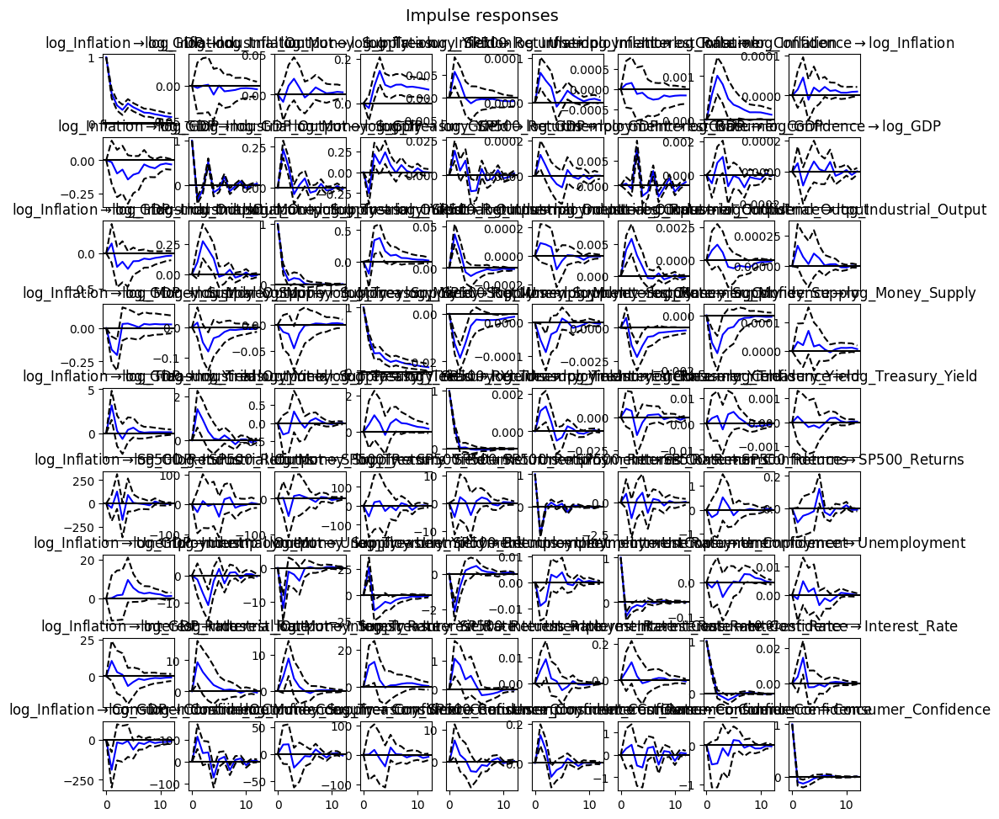

FEVD for log_Inflation
      log_Inflation   log_GDP  log_Industrial_Output  log_Money_Supply  log_Treasury_Yield  SP500_Returns  Unemployment  Interest_Rate  Consumer_Confidence
0          1.000000  0.000000               0.000000          0.000000            0.000000       0.000000      0.000000       0.000000             0.000000
1          0.958767  0.000179               0.000138          0.002925            0.014914       0.013285      0.000265       0.009126             0.000400
2          0.915800  0.000164               0.001115          0.006567            0.020171       0.018198      0.000609       0.033670             0.003707
3          0.879906  0.000303               0.002683          0.028306            0.018876       0.019079      0.000597       0.046614             0.003637
4          0.873962  0.000658               0.002914          0.033289            0.017774       0.018190      0.000608       0.048634             0.003972
5          0.871613  0.000636            

In [ ]:
# VAR on differences
vecm_diff4 = vecm_data.diff().dropna()
var_model_diff4 = VAR(vecm_diff4)
var_res_diff4 = var_model_diff4.fit(maxlags=4)

# IRF
irf4 = var_res_diff4.irf(12)
irf4.plot(orth=False)
plt.show()

# FEVD
fevd4 = var_res_diff4.fevd(12)
print(fevd4.summary())

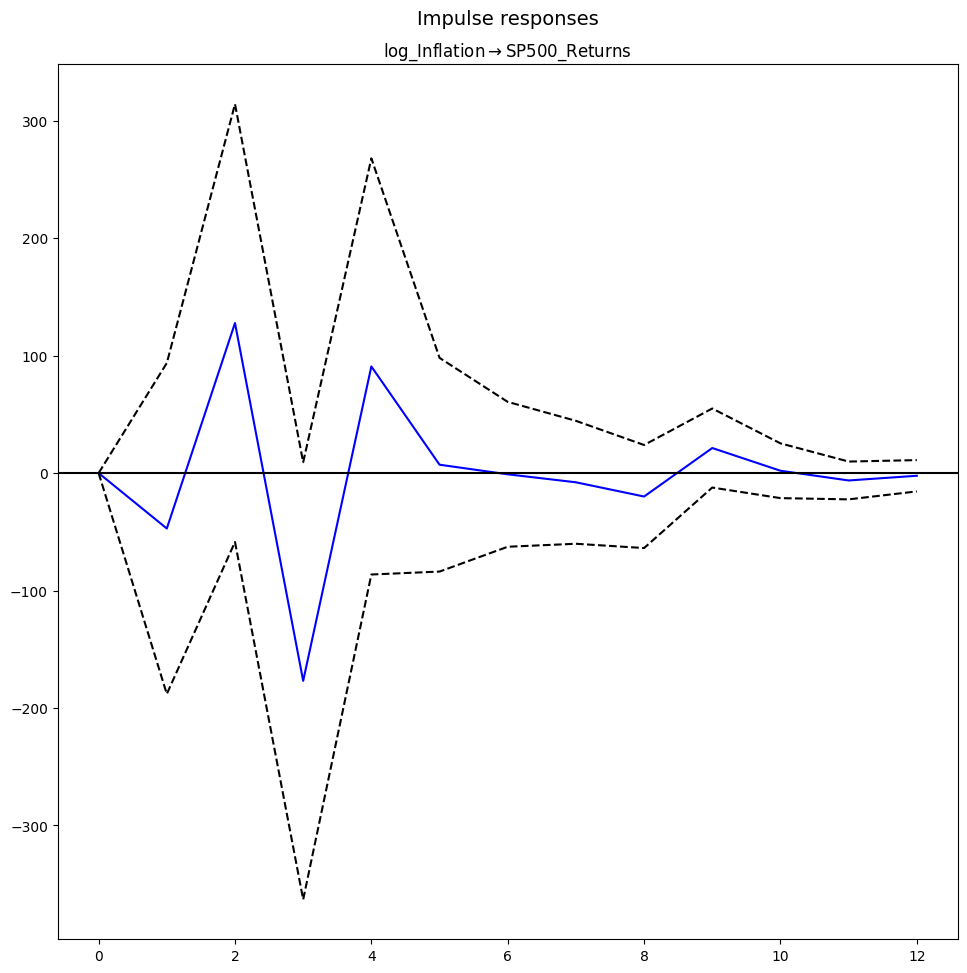

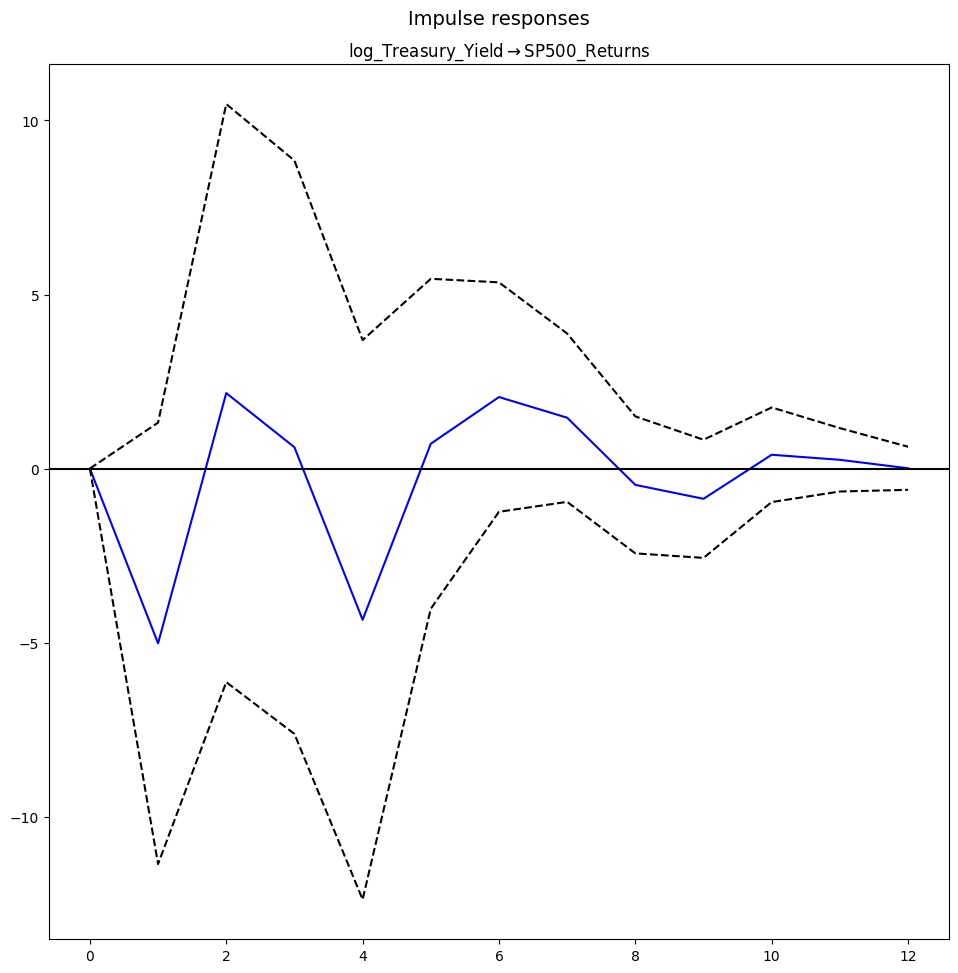

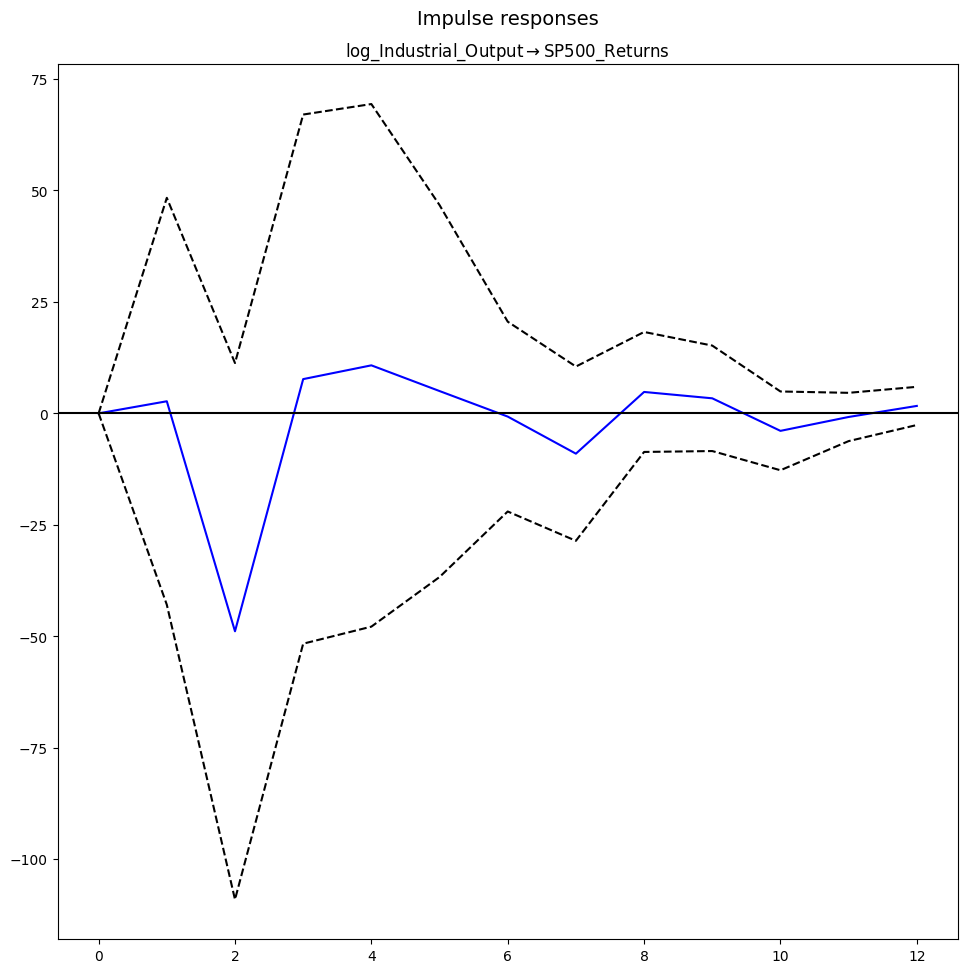

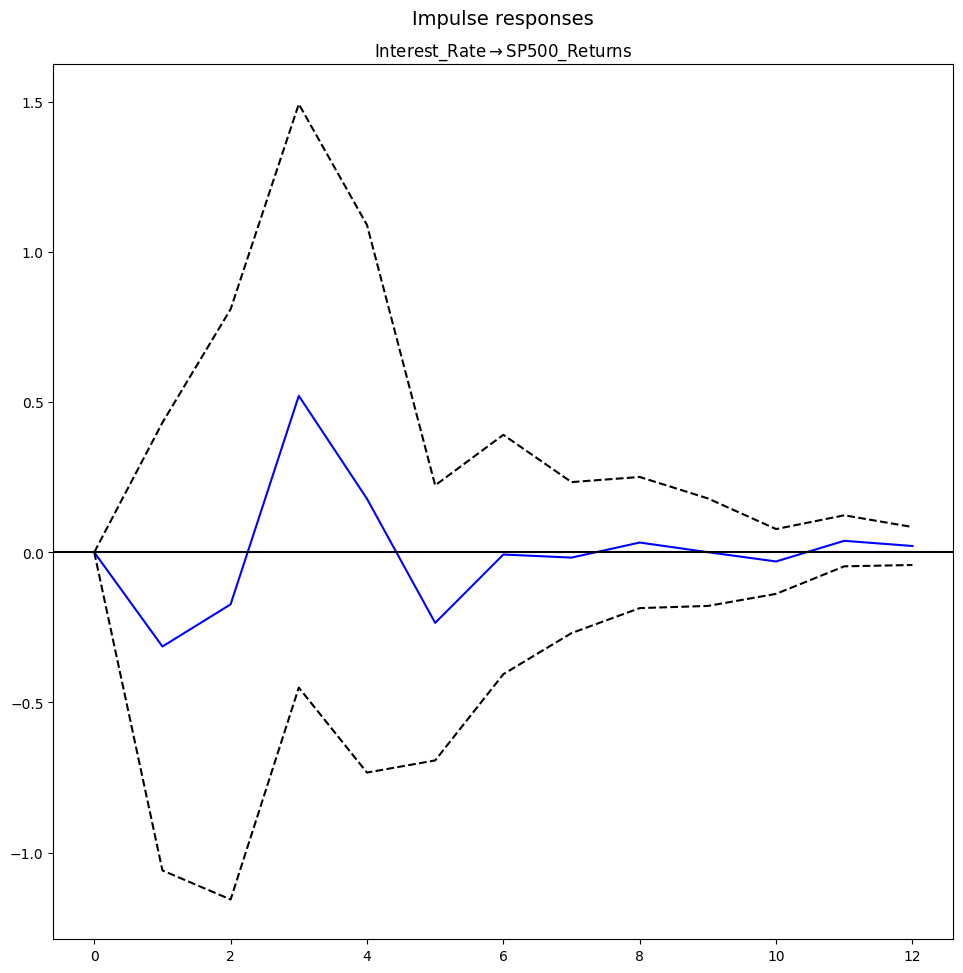

In [ ]:
variables4 = var_res_diff4.names

# Shock indices
shock_infl4 = variables4.index('log_Inflation')
shock_rate4 = variables4.index('log_Treasury_Yield')
shock_indust4 = variables4.index('log_Industrial_Output')
shock_spx4 = variables4.index('SP500_Returns')
shock_intr4 = variables4.index('Interest_Rate')

# IRF Plots
irf4.plot(response='SP500_Returns', impulse='log_Inflation')
plt.show()
irf4.plot(response='SP500_Returns', impulse='log_Treasury_Yield')
plt.show()
irf4.plot(response='SP500_Returns', impulse='log_Industrial_Output')
plt.show()
irf4.plot(response='SP500_Returns', impulse='Interest_Rate')
plt.show()

In [ ]:
max_h4 = fevd4.decomp.shape[0] - 1
print("Max horizon:", max_h4)

Max horizon: 8


In [ ]:
spx_idx4 = variables4.index('SP500_Returns')
fevd_1_4  = fevd4.decomp[1, spx_idx4]
fevd_6_4  = fevd4.decomp[6, spx_idx4]
fevd_8_4 = fevd4.decomp[8, spx_idx4]

print("\nFEVD Horizon 1:")
for var, val in zip(variables4, fevd_1_4):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 6:")
for var, val in zip(variables4, fevd_6_4):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 8:")
for var, val in zip(variables4, fevd_8_4):
    print(f"{var}: {val:.4f}")

# Major Contributors
print("\nMajor Contributor at Horizon 1:", highlight_major_contributors(fevd_1_4, variables4))
print("Major Contributor at Horizon 6:", highlight_major_contributors(fevd_6_4, variables4))
print("Major Contributor at Horizon 8:", highlight_major_contributors(fevd_8_4, variables4))


FEVD Horizon 1:
log_Inflation: 0.0090
log_GDP: 0.6114
log_Industrial_Output: 0.1573
log_Money_Supply: 0.0500
log_Treasury_Yield: 0.0368
SP500_Returns: 0.0123
Unemployment: 0.1104
Interest_Rate: 0.0090
Consumer_Confidence: 0.0038

FEVD Horizon 6:
log_Inflation: 0.0085
log_GDP: 0.1678
log_Industrial_Output: 0.1544
log_Money_Supply: 0.0972
log_Treasury_Yield: 0.0694
SP500_Returns: 0.0314
Unemployment: 0.4664
Interest_Rate: 0.0022
Consumer_Confidence: 0.0028

FEVD Horizon 8:
log_Inflation: 0.0174
log_GDP: 0.0428
log_Industrial_Output: 0.0047
log_Money_Supply: 0.0131
log_Treasury_Yield: 0.0182
SP500_Returns: 0.0487
Unemployment: 0.0086
Interest_Rate: 0.0070
Consumer_Confidence: 0.8395

Major Contributor at Horizon 1: ('log_GDP', np.float64(0.6114097940590799))
Major Contributor at Horizon 6: ('Unemployment', np.float64(0.46635999311385007))
Major Contributor at Horizon 8: ('Consumer_Confidence', np.float64(0.8394717680471654))


**Lag = 12**

In [ ]:
vecm12 = VECM(endog=vecm_data, k_ar_diff=12, coint_rank=2, deterministic="ci")
vecm_res12 = vecm12.fit()
print(vecm_res12.summary())

 Det. terms outside the coint. relation & lagged endog. parameters for equation log_Inflation
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
L1.log_Inflation              0.3783      0.036     10.405      0.000       0.307       0.450
L1.log_GDP                   -0.0232      0.019     -1.206      0.228      -0.061       0.014
L1.log_Industrial_Output      0.0066      0.013      0.517      0.605      -0.018       0.032
L1.log_Money_Supply          -0.0423      0.028     -1.486      0.137      -0.098       0.013
L1.log_Treasury_Yield         0.0058      0.002      3.675      0.000       0.003       0.009
L1.SP500_Returns           3.819e-05   7.95e-05      0.481      0.631      -0.000       0.000
L1.Unemployment               0.0002      0.000      0.620      0.535      -0.000       0.001
L1.Interest_Rate              0.0007      0.000      3.686  

In [ ]:
resid12 = vecm_res12.resid

# Ljung-Box
lb_tests12 = []
for i in range(resid12.shape[1]):
    lb = acorr_ljungbox(resid12[:, i], lags=[10], return_df=True)
    lb['variable'] = vecm_data.columns[i]
    lb_tests12.append(lb)
lb_test_df12 = pd.concat(lb_tests12)
print(lb_test_df12)

# Jarque-Bera
jb_test_list12 = []
for i in range(resid12.shape[1]):
    series = resid12[:, i]
    jb_stat, jb_pvalue = jarque_bera(series)
    s = skew(series)
    k = kurtosis(series)
    jb_test_list12.append([vecm_data.columns[i], jb_stat, jb_pvalue, s, k])
jb_test_df12 = pd.DataFrame(jb_test_list12, columns=['variable', 'JB_stat', 'JB_pvalue', 'skew', 'kurtosis'])
print(jb_test_df12)

# Stability
var_model12 = VAR(vecm_data)
var_res12 = var_model12.fit(maxlags=vecm12.k_ar_diff)

k = var_res12.neqs
p = var_res12.k_ar
comp_matrix12 = np.zeros((k * p, k * p))
comp_matrix12[:k, :] = np.hstack(var_res12.coefs)
if p > 1:
    comp_matrix12[k:, :-k] = np.eye(k * (p - 1))
eigvals12 = np.linalg.eigvals(comp_matrix12)
is_stable12 = np.all(np.abs(eigvals12) < 1)
print("Eigenvalues:", eigvals12)
print("Is stable?", is_stable12)


     lb_stat  lb_pvalue               variable
10  3.140385   0.977924          log_Inflation
10  0.798009   0.999939                log_GDP
10  3.629511   0.962517  log_Industrial_Output
10  1.425684   0.999149       log_Money_Supply
10  1.103863   0.999730     log_Treasury_Yield
10  0.523297   0.999992          SP500_Returns
10  0.877322   0.999906           Unemployment
10  1.925902   0.996877          Interest_Rate
10  2.699997   0.987630    Consumer_Confidence
                variable       JB_stat      JB_pvalue       skew    kurtosis
0          log_Inflation  6.162780e+02  1.502917e-134  -0.120848    4.325676
1                log_GDP  1.354367e+04   0.000000e+00  -1.204908   20.166568
2  log_Industrial_Output  2.154927e+04   0.000000e+00  -2.299390   25.202664
3       log_Money_Supply  7.645730e+03   0.000000e+00   1.340984   15.022381
4     log_Treasury_Yield  2.626451e+03   0.000000e+00  -0.980177    8.726421
5          SP500_Returns  6.734586e+01   2.377023e-15  -0.348067    

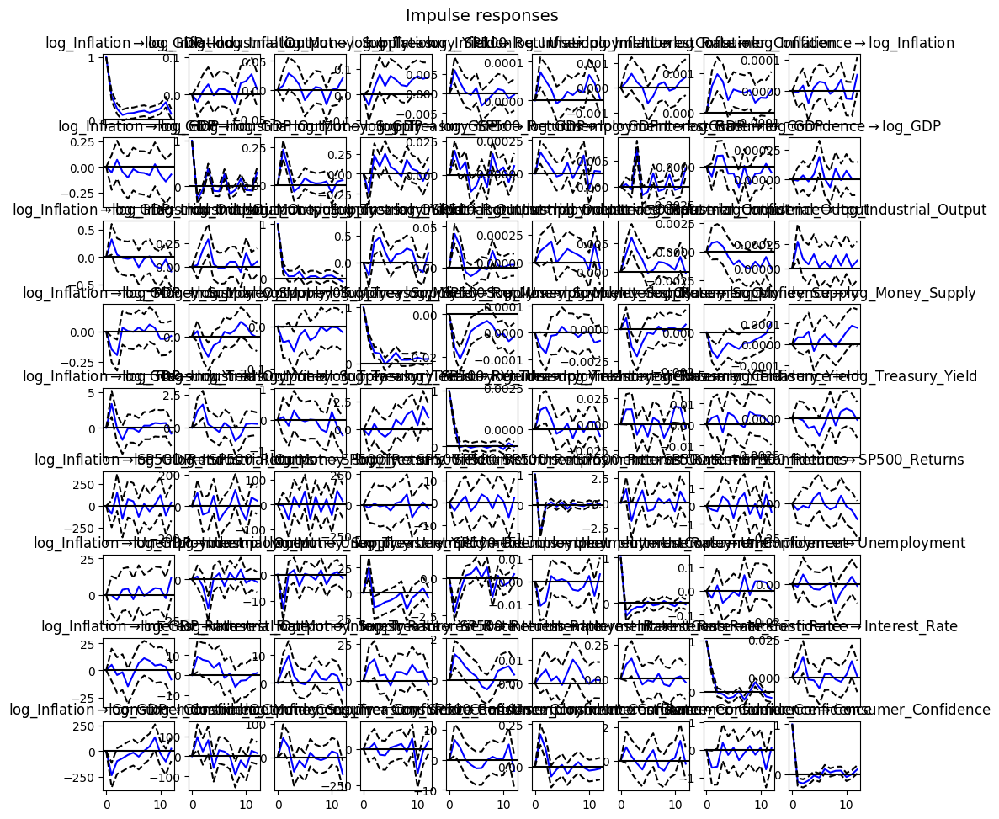

FEVD for log_Inflation
      log_Inflation   log_GDP  log_Industrial_Output  log_Money_Supply  log_Treasury_Yield  SP500_Returns  Unemployment  Interest_Rate  Consumer_Confidence
0          1.000000  0.000000               0.000000          0.000000            0.000000       0.000000      0.000000       0.000000             0.000000
1          0.945767  0.000472               0.001711          0.005183            0.016594       0.015835      0.001087       0.013296             0.000054
2          0.899665  0.000865               0.005981          0.005581            0.020620       0.022461      0.005915       0.038362             0.000550
3          0.868510  0.003179               0.007220          0.014870            0.019960       0.022833      0.006928       0.053445             0.003056
4          0.865211  0.003142               0.007663          0.016068            0.019723       0.022753      0.006864       0.055344             0.003232
5          0.849488  0.004474            

In [ ]:
# VAR on differences
vecm_diff12 = vecm_data.diff().dropna()
var_model_diff12 = VAR(vecm_diff12)
var_res_diff12 = var_model_diff12.fit(maxlags=12)

# IRF
irf12 = var_res_diff12.irf(12)
irf12.plot(orth=False)
plt.show()

# FEVD
fevd12 = var_res_diff12.fevd(12)
print(fevd12.summary())

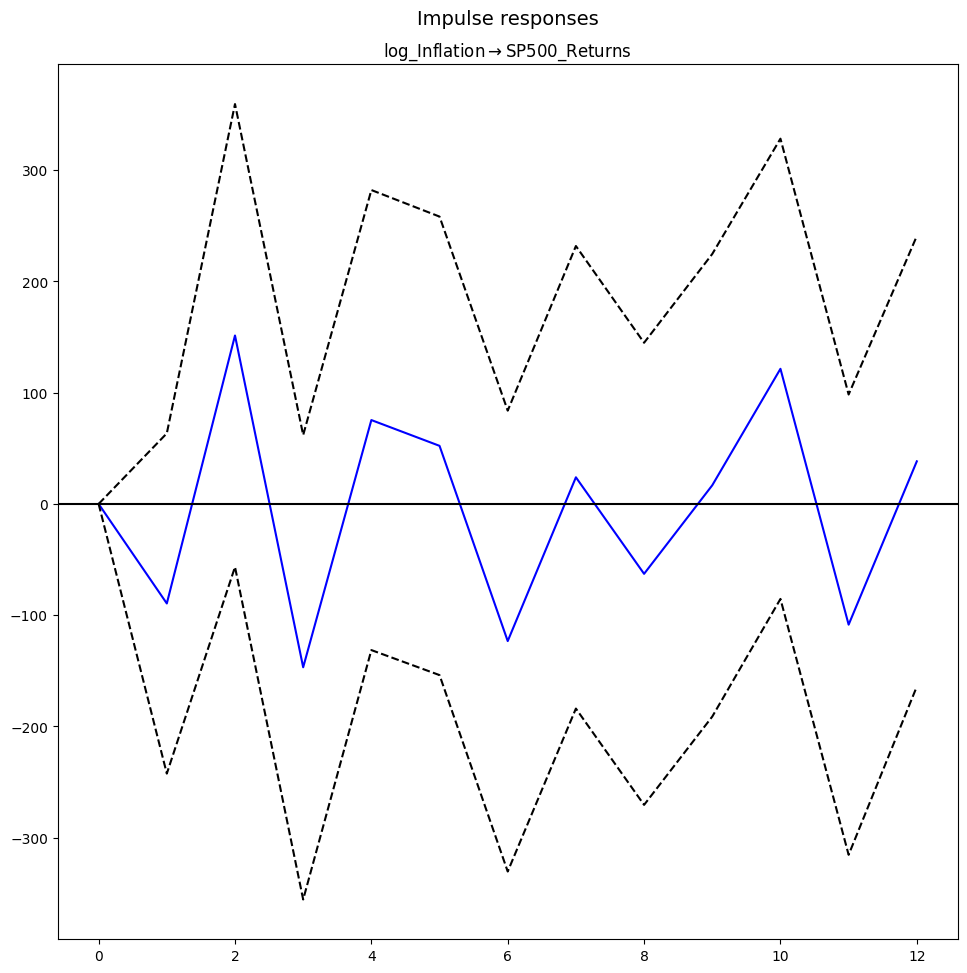

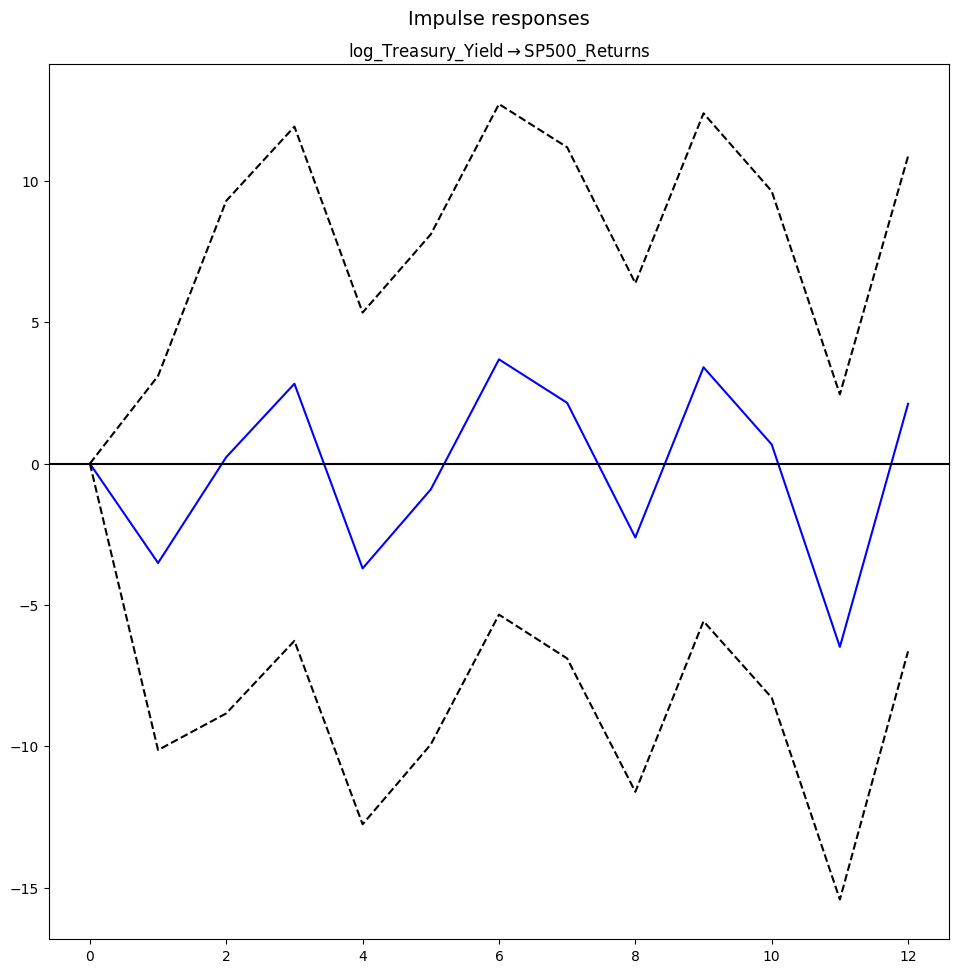

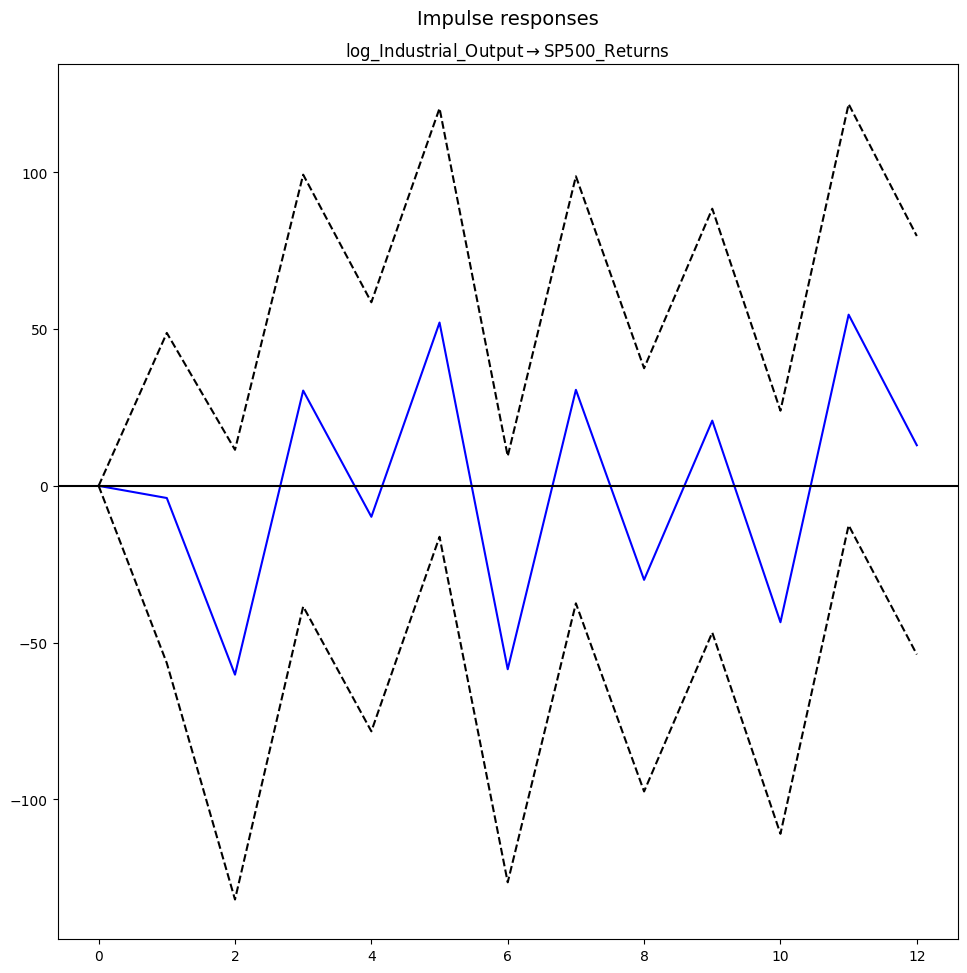

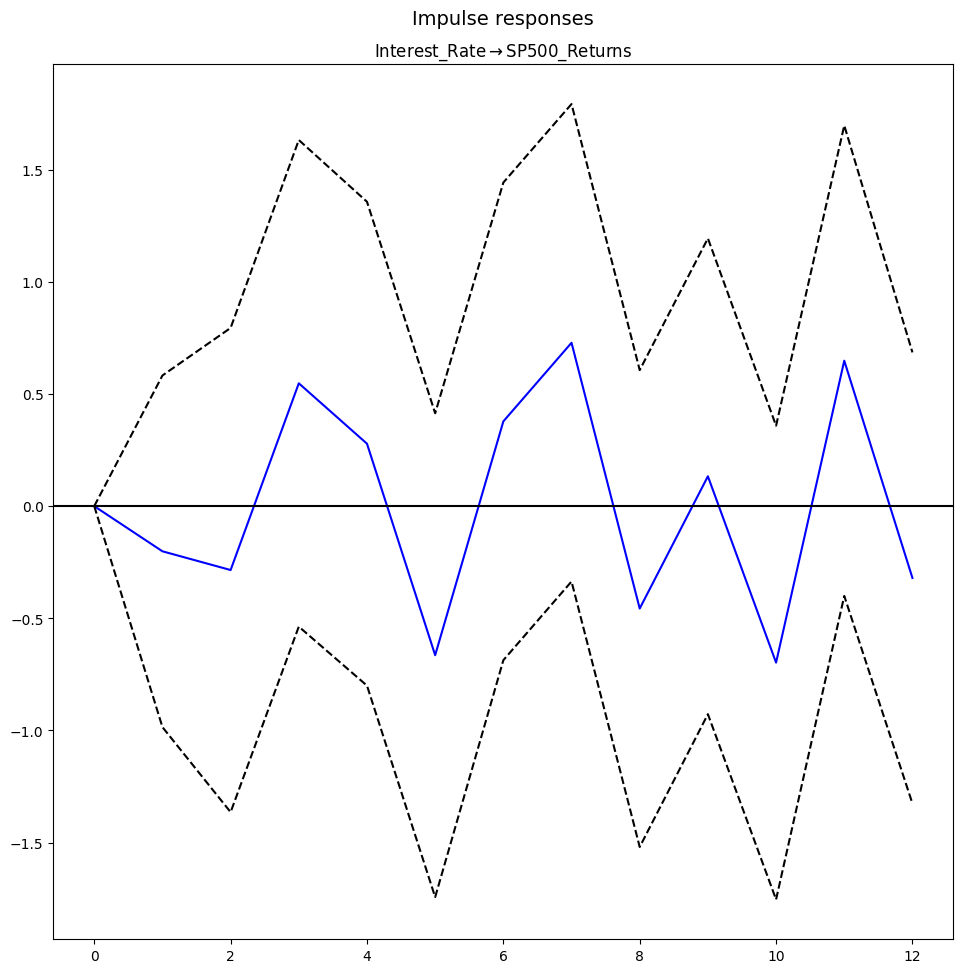

In [ ]:
variables12 = var_res_diff12.names

# Shock indices
shock_infl12 = variables12.index('log_Inflation')
shock_rate12 = variables12.index('log_Treasury_Yield')
shock_indust12 = variables12.index('log_Industrial_Output')
shock_spx12 = variables12.index('SP500_Returns')
shock_intr12 = variables12.index('Interest_Rate')

# IRF Plots
irf12.plot(response='SP500_Returns', impulse='log_Inflation')
plt.show()
irf12.plot(response='SP500_Returns', impulse='log_Treasury_Yield')
plt.show()
irf12.plot(response='SP500_Returns', impulse='log_Industrial_Output')
plt.show()
irf12.plot(response='SP500_Returns', impulse='Interest_Rate')
plt.show()


In [ ]:
max_h12 = fevd12.decomp.shape[0] - 1
print("Max horizon:", max_h12)



Max horizon: 8


In [ ]:
spx_idx12 = variables12.index('SP500_Returns')
fevd_1_12  = fevd12.decomp[1, spx_idx12]
fevd_6_12  = fevd12.decomp[6, spx_idx12]
fevd_8_12 = fevd12.decomp[8, spx_idx12]

print("\nFEVD Horizon 1:")
for var, val in zip(variables12, fevd_1_12):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 6:")
for var, val in zip(variables12, fevd_6_12):
    print(f"{var}: {val:.4f}")

print("\nFEVD Horizon 8:")
for var, val in zip(variables12, fevd_8_12):
    print(f"{var}: {val:.4f}")

# Major Contributors
print("\nMajor Contributor at Horizon 1:", highlight_major_contributors(fevd_1_12, variables12))
print("Major Contributor at Horizon 6:", highlight_major_contributors(fevd_6_12, variables12))
print("Major Contributor at Horizon 8:", highlight_major_contributors(fevd_8_12, variables12))


FEVD Horizon 1:
log_Inflation: 0.0079
log_GDP: 0.6152
log_Industrial_Output: 0.1353
log_Money_Supply: 0.0531
log_Treasury_Yield: 0.0384
SP500_Returns: 0.0226
Unemployment: 0.1087
Interest_Rate: 0.0082
Consumer_Confidence: 0.0105

FEVD Horizon 6:
log_Inflation: 0.0066
log_GDP: 0.2096
log_Industrial_Output: 0.1490
log_Money_Supply: 0.0899
log_Treasury_Yield: 0.0831
SP500_Returns: 0.0344
Unemployment: 0.4206
Interest_Rate: 0.0042
Consumer_Confidence: 0.0026

FEVD Horizon 8:
log_Inflation: 0.0295
log_GDP: 0.0349
log_Industrial_Output: 0.0165
log_Money_Supply: 0.0160
log_Treasury_Yield: 0.0143
SP500_Returns: 0.0771
Unemployment: 0.0083
Interest_Rate: 0.0101
Consumer_Confidence: 0.7933

Major Contributor at Horizon 1: ('log_GDP', np.float64(0.6152139803216263))
Major Contributor at Horizon 6: ('Unemployment', np.float64(0.42061966740327816))
Major Contributor at Horizon 8: ('Consumer_Confidence', np.float64(0.7932800989663028))


* The VECM was estimated with a lag order of 3 and one cointegrating vector to capture both short-run adjustments and long-run equilibrium relationships among macroeconomic variables and S&P 500 returns.

* Johansen cointegration testing confirmed a single long-run relationship, with GDP serving as the primary anchor, Industrial Output and Money Supply adjusting negatively, and Inflation and Treasury Yield having smaller weights, reflecting a stable macro-finance equilibrium.

* Error correction terms were significant for key variables, indicating that deviations from the long-run equilibrium are gradually corrected, while short-run coefficients were mixed, showing limited predictive power over monthly horizons.

* Impulse Response Functions revealed intuitive dynamics: Inflation shocks caused short-term oscillations in S&P 500 returns, Industrial Output shocks initially reduced returns before a positive rebound, and Treasury Yield and Interest Rate shocks produced immediate negative impacts followed by recovery.

* Forecast Error Variance Decomposition showed that GDP dominated short-run variance, Unemployment contributed most over a 6-month horizon, and Consumer Confidence was the primary driver of long-run S&P 500 return variation.

* Residual diagnostics confirmed model stability, with all eigenvalues within the unit circle, minor autocorrelation in some series, and expected non-normality, supporting the validity of IRFs and FEVD for economic interpretation.

* Robustness checks with alternative lag lengths (p = 4 and p = 12) confirmed that the main cointegrating vector and dynamic responses remained stable, indicating reliable VECM results.


### ARIMA Model

In [ ]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 11.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
!pip install pmdarima
from pmdarima import auto_arima
from statsmodels.tsa.stattools import adfuller

In [ ]:
df = pd.read_csv('macro_data_cleaned.csv', parse_dates=['Date'])
df = df.set_index('Date')

In [ ]:
exog = df[['Inflation', 'Unemployment', 'Interest_Rate', 'GDP',
           'Industrial_Output', 'Money_Supply', 'Consumer_Confidence',
           'Treasury_Yield']]

y = df['SP500_Returns']

In [ ]:
result = adfuller(y.dropna())
print("ADF Statistic:", result[0])
print("p-value:", result[1])

ADF Statistic: -11.302943834927285
p-value: 1.293994172710107e-20


In [ ]:
model = auto_arima(
    y,
    exogenous=exog,
    seasonal=False,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True
)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4617.326, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4618.140, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4618.070, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4615.911, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4617.899, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=4619.396, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=4619.581, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 2.793 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  801
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -2304.95

In [ ]:
model.fit(y, exogenous=exog)

ARIMA(order=(1, 0, 1), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

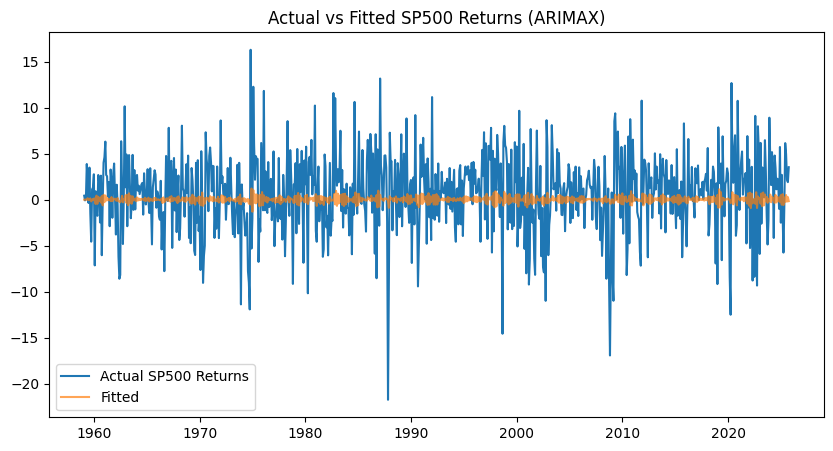

In [ ]:
fitted = model.predict_in_sample(exogenous=exog)
plt.figure(figsize=(10,5))
plt.plot(y, label="Actual SP500 Returns")
plt.plot(y.index, fitted, label="Fitted", alpha=0.7)
plt.title("Actual vs Fitted SP500 Returns (ARIMAX)")
plt.legend()
plt.show()

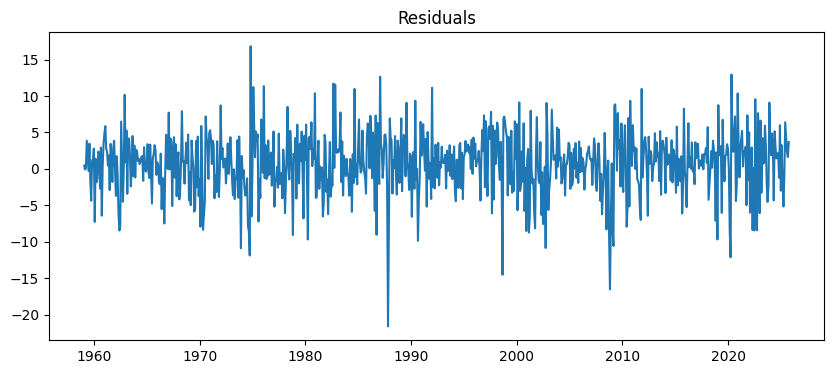

In [ ]:
residuals = y - fitted

plt.figure(figsize=(10,4))
plt.plot(residuals)
plt.title("Residuals")
plt.show()

<Axes: title={'center': 'Residual Histogram'}, ylabel='Frequency'>

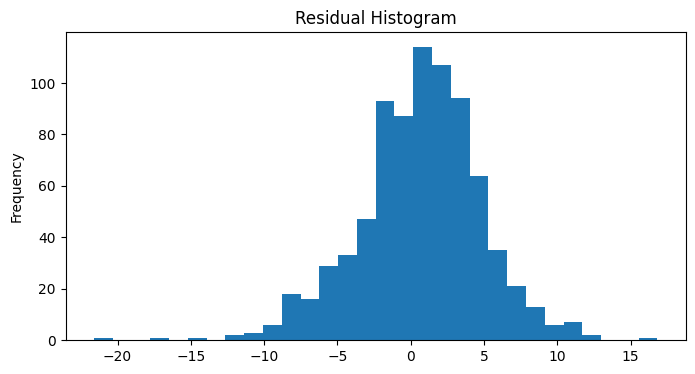

In [ ]:
residuals.plot(kind='hist', bins=30, figsize=(8,4), title='Residual Histogram')

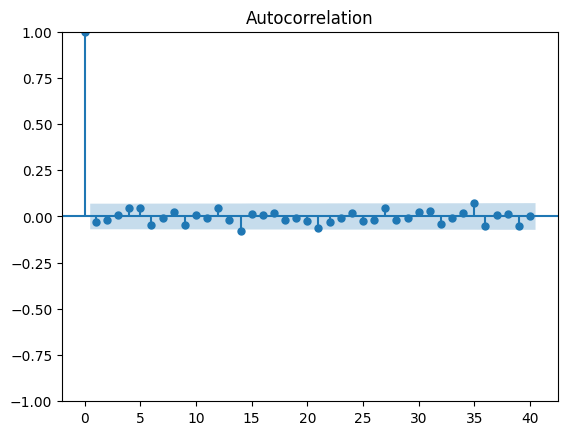

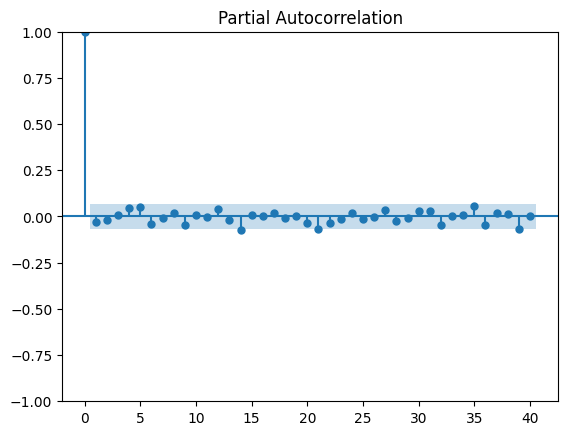

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(residuals.dropna(), lags=40)
plot_pacf(residuals.dropna(), lags=40)
plt.show()

In [ ]:
from statsmodels.stats.diagnostic import acorr_ljungbox

lb_test = acorr_ljungbox(residuals.dropna(), lags=[10], return_df=True)
print(lb_test)

     lb_stat  lb_pvalue
10  8.193985   0.609895


## Part 4 - Results & Conclusion

* Short-Run Dynamics: VAR analysis shows that shocks to Unemployment, Industrial Production, Interest Rates, and Treasury Yields produce immediate, intuitive responses in S&P 500 returns, highlighting the market’s sensitivity to macro surprises.

* Long-Run Relationships: VECM results identify a statistically significant cointegrating relationship linking GDP, Industrial Output, Money Supply, Inflation, Treasury Yields, and the S&P 500, confirming co-movement over longer horizons consistent with macro-finance theory.

* Predictive Power: Monthly S&P 500 returns are essentially unpredictable using macro variables. ARIMA outperforms ARIMAX models, indicating that internal market dynamics dominate and macroeconomic indicators provide no additional short-term forecasting advantage.

* Model Insights:

  * VAR: Captures short-run shocks effectively, but loses long-run equilibrium information.

  * VECM: Reveals long-run equilibrium and short-run adjustment patterns, though results are lag-sensitive.

  * ARIMA: Best short-run predictive accuracy for S&P 500 alone.

  * ARIMAX: Macro variables do not improve monthly return forecasts; higher variance is observed.

**Conclusion**: The S&P 500 reacts to macro shocks and shares long-run linkages with economic fundamentals, but macroeconomic data cannot forecast monthly returns, emphasizing the distinction between short-run market responses and long-run equilibrium relationships.